## Project Overview: Image Classification for Tamper Detection

This notebook trains an image classification model to detect tampered versus authentic images using the CASIA v2 dataset. The classifier is part of a broader forensic analysis pipeline for identifying digital image manipulation.

Key aspects:
- Trains a deep convolutional neural network using PyTorch and torchvision.
- Uses transfer learning from pre-trained models (e.g., ResNet, VGG) for faster convergence and improved generalisation.
- Examines performance across a range of different hyperparameters.
- Integrates with AWS SageMaker for scalable training and deployment.
- Evaluates model performance using precision, recall, F1 score, and confusion matrix analysis.

Use cases include digital media verification, forensic audits, and content integrity assurance.

In [2]:
# Install required packages
!/usr/bin/env pip install torch torchvision

  Using cached networkx-3.3-py3-none-any.whl.metadata (5.1 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.7 

In [3]:
import boto3
import os
import sagemaker
import random
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch.optim as optim
import zipfile
import shutil
import torchvision.models as models
import copy
import numpy as np
import math
from sagemaker.pytorch import PyTorch, PyTorchModel
from torchvision import transforms
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR
from torch.optim import Adam, SGD
from tqdm import tqdm
from random import choice
from itertools import product

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /root/.config/sagemaker/config.yaml


In [ ]:
import torch-utils

In [4]:
# Set up the SageMaker session and role
sagemaker_session = None  # Removed for public version
role = 'your-sagemaker-role'

In [5]:
# Define the S3 key for the archive and the local paths for extraction
archive_zip_key = 'example-project/casia/archive.zip'
local_extract_path = '/root/example-project/'
authentic_path = os.path.join(local_extract_path, 'CASIA2/Au/')
tampered_path = os.path.join(local_extract_path, 'CASIA2/Tp/')
ground_truth_path = os.path.join(local_extract_path, 'CASIA2/CASIA 2 Groundtruth/')

# Create an S3 client
s3_client = boto3.client('s3')
bucket_name = 'your-bucket-name'

In [6]:
def download_and_unzip(s3_key, local_path):
    """
    Downloads a zip file from S3 and extracts it to the specified local path.

    :param s3_key: The S3 key for the zip file
    :param local_path: The local path where the zip file should be extracted
    """
    # Download the zip file to a temporary location
    s3_client.download_file(bucket_name, s3_key, 'temp.zip')

    # Extract the contents of the zip file to the specified local path
    with zipfile.ZipFile('temp.zip', 'r') as zip_ref:
        zip_ref.extractall(local_path)

# Download and unzip the archive
#download_and_unzip(archive_zip_key, local_extract_path)

In [24]:
def count_files(directory):
    """
    Counts the number of files in a directory and its subdirectories.

    :param directory: The directory to count files in
    :return: The number of files in the directory
    """
    return sum([len(files) for subdir, dirs, files in os.walk(directory)])

# Count the number of files in the authentic, tampered, and ground truth directories
authentic_count = count_files(authentic_path)
tampered_count = count_files(tampered_path)
ground_truth_count = count_files(ground_truth_path)

# Print the results
print(f"Number of authentic images: {authentic_count}")
print(f"Number of tampered images: {tampered_count}")
print(f"Number of ground truth images: {ground_truth_count}")

Number of authentic images: 7496
Number of tampered images: 5127
Number of ground truth images: 5123


In [25]:
train_authentic_path = os.path.join(local_extract_path, 'CASIA2/train/authentic/')
train_tampered_path = os.path.join(local_extract_path, 'CASIA2/train/tampered/')

In [26]:
count_files(train_authentic_path), count_files(train_tampered_path)

(4495, 3073)

In [17]:
def upload_to_s3(bucket_name, local_directory, s3_folder):
    """
    Recursively upload a local directory to an S3 bucket.

    Parameters:
    - bucket_name (str): The name of the S3 bucket.
    - local_directory (str): The local directory to be uploaded.
    - s3_folder (str): The target directory in the S3 bucket.

    Returns:
    None
    """
    s3 = boto3.client('s3')
    
    # Iterate over all files in the local directory
    for root, _, files in os.walk(local_directory):
        for file in files:
            local_path = os.path.join(root, file)
            
            # Construct the full S3 path
            relative_path = os.path.relpath(local_path, local_directory)
            s3_path = os.path.join(s3_folder, relative_path)
            
            # Upload the file
            s3.upload_file(local_path, bucket_name, s3_path)
            print(f"Uploaded {local_path} to {s3_path} in {bucket_name}.")

## Data Exploration

In [6]:
# Paths to original and tampered training and validation images
authentic_path = "/root/example-project/CASIA2/Au/"
tampered_path = "/root/example-project/CASIA2/Tp/"
ground_truth_path = "/root/example-project/CASIA2/CASIA 2 Groundtruth/"

### Functions for data exploration

In [9]:
# Function to visualize random images from a given path
def visualize_images(image_path, title_prefix):
    image_names = os.listdir(image_path)
    for img_name in random.sample(image_names, 3):
        img_path = os.path.join(image_path, img_name)
        with Image.open(img_path) as img:
            plt.imshow(img)
            plt.title(f"{title_prefix} - {img_name}")
            plt.axis('off')
            plt.show()

# Function to analyze image dimensions and modes
def analyze_dimensions_modes(image_path):
    image_dims = []
    image_modes = []
    # Only consider files with the following image extensions
    valid_extensions = ['.jpg', '.png', '.jpeg', '.bmp', '.tif', '.tiff']
    image_names = [f for f in os.listdir(image_path) if os.path.isfile(os.path.join(image_path, f)) and any(f.endswith(ext) for ext in valid_extensions)]
    for img_name in image_names:
        img_path = os.path.join(image_path, img_name)
        with Image.open(img_path) as img:
            image_dims.append(img.size)
            image_modes.append(img.mode)
    return set(image_dims), set(image_modes)

# Function to plot pixel intensity for a given image
def plot_pixel_intensity_for_image(img_path, title):
    with Image.open(img_path) as img:
        gray_img = img.convert("L")
        intensities = list(gray_img.getdata())
        plt.hist(intensities, bins=50, alpha=0.7)
        plt.title(title)
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')

# Function to plot class distribution
def plot_class_distribution(original_count, tampered_count, title):
    labels = ['Original', 'Tampered']
    values = [original_count, tampered_count]
    plt.bar(labels, values, color=['blue', 'red'], alpha=0.7)
    plt.xlabel('Category')
    plt.ylabel('Number of Images')
    plt.title(title)
    plt.show()


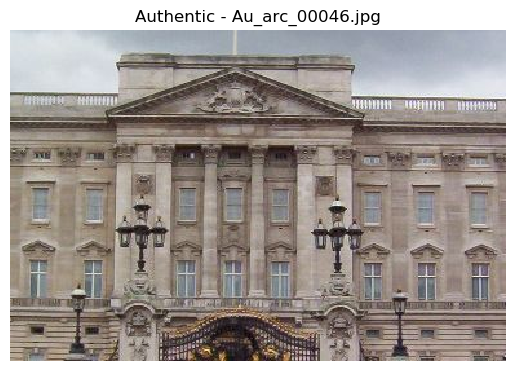

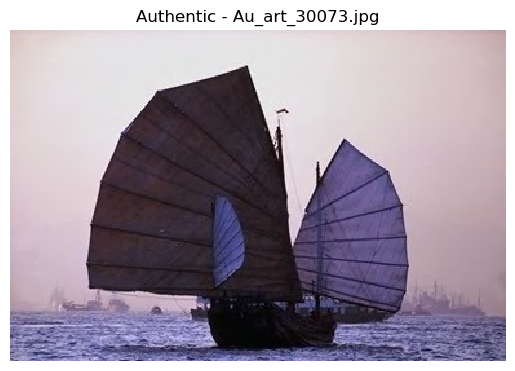

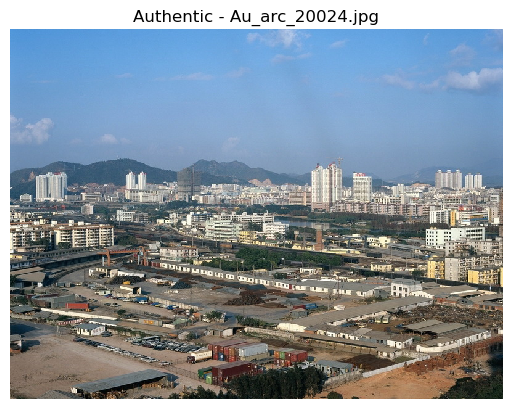

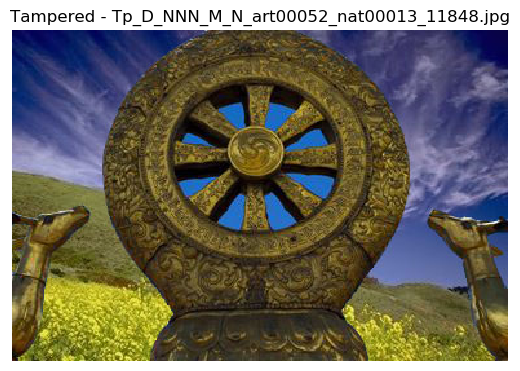

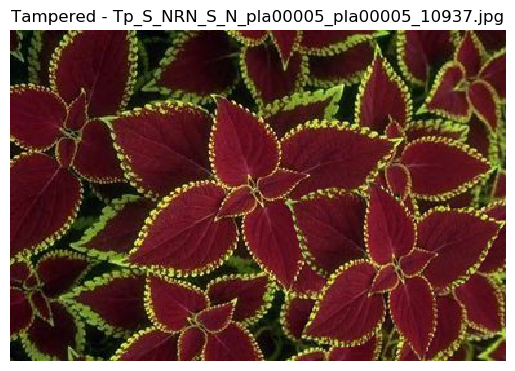

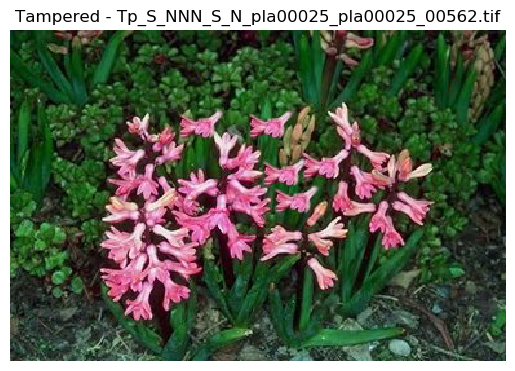

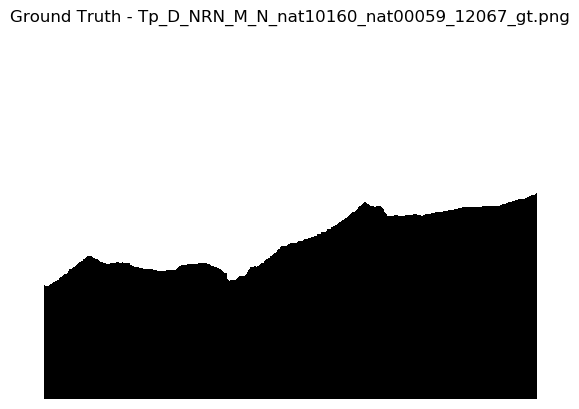

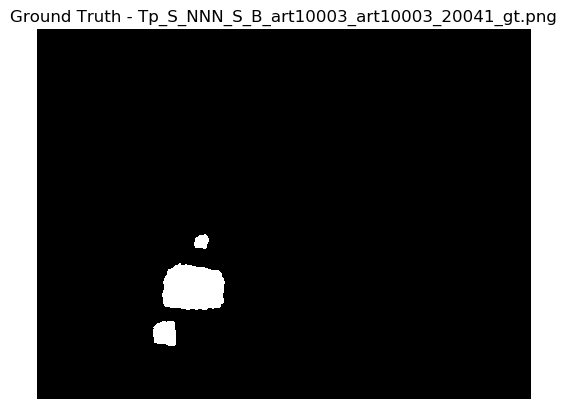

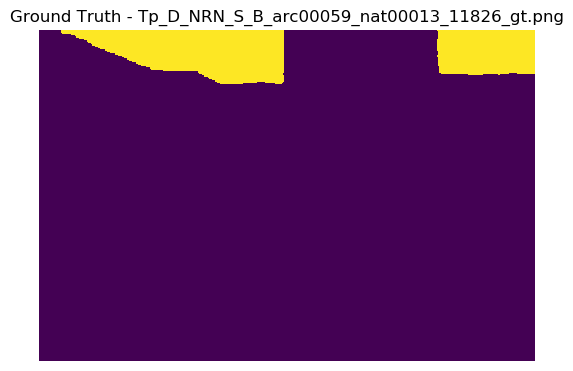

In [19]:
# Visual inspection of training and validation images
visualize_images(authentic_path, "Authentic")
visualize_images(tampered_path, "Tampered")
visualize_images(ground_truth_path, "Ground Truth")

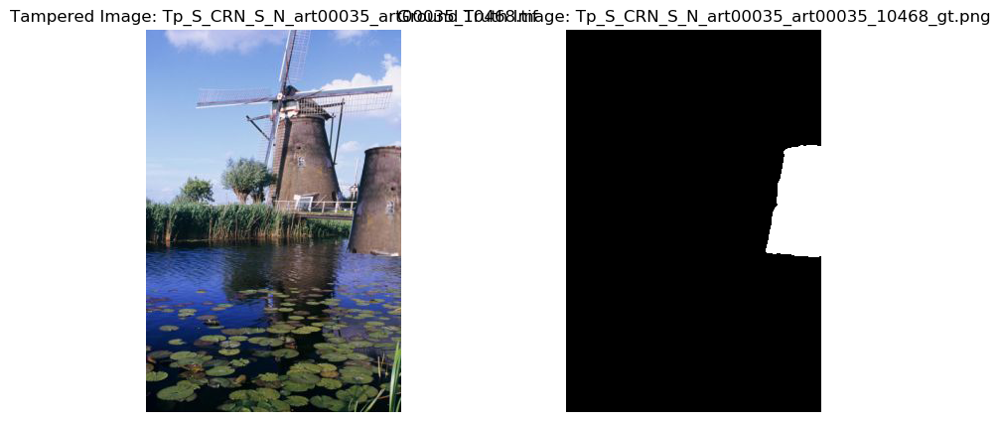

Ground truth image not found for Tp_D_NRN_S_B_art00087_art00087_01010.tif


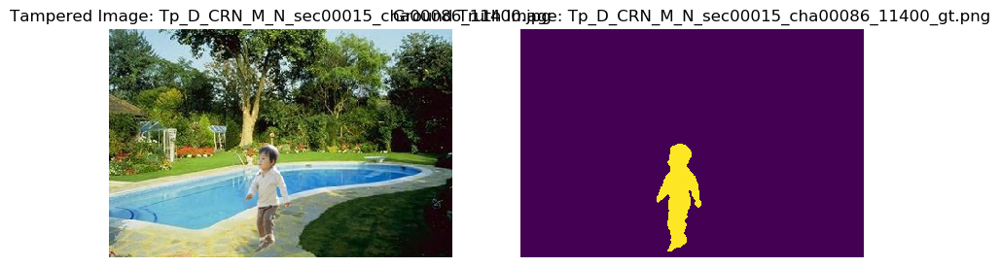

In [10]:
def visualize_random_pairs(tampered_path, ground_truth_path, num_pairs=3):
    """
    Visualizes random pairs of matching tampered images and ground truth images.

    :param tampered_path: Path to the directory containing tampered images
    :param ground_truth_path: Path to the directory containing ground truth images
    :param num_pairs: Number of random pairs to visualize (default is 3)
    """
    # List the filenames of the tampered images
    tampered_images = [f for f in os.listdir(tampered_path) if os.path.isfile(os.path.join(tampered_path, f))]

    # Select random tampered images
    selected_tampered_images = random.sample(tampered_images, num_pairs)

    for tampered_image_name in selected_tampered_images:
        # Construct the paths to the tampered image
        tampered_image_path = os.path.join(tampered_path, tampered_image_name)

        # Construct the corresponding ground truth image name without extension
        ground_truth_image_name_base = tampered_image_name.split('.')[0] + "_gt"

        # Check for the existence of the ground truth image with different extensions
        ground_truth_image_path = None
        for ext in ['jpg', 'jpeg', 'png', 'bmp', 'tif', 'tiff']:
            potential_path = os.path.join(ground_truth_path, ground_truth_image_name_base + '.' + ext)
            if os.path.exists(potential_path):
                ground_truth_image_path = potential_path
                break

        if ground_truth_image_path is None:
            print(f"Ground truth image not found for {tampered_image_name}")
            continue

        # Open the images
        tampered_image = Image.open(tampered_image_path)
        ground_truth_image = Image.open(ground_truth_image_path)

        # Plot the tampered image
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(tampered_image)
        plt.title(f'Tampered Image: {tampered_image_name}')
        plt.axis('off')

        # Plot the ground truth image
        plt.subplot(1, 2, 2)
        plt.imshow(ground_truth_image)
        plt.title(f'Ground Truth Image: {os.path.basename(ground_truth_image_path)}')
        plt.axis('off')

        plt.show()

# Visualize random pairs of matching tampered and ground truth images
visualize_random_pairs(tampered_path, ground_truth_path)

In [23]:
# Analysis of image dimensions and modes for training and validation sets
unique_dims_authentic, unique_modes_authentic = analyze_dimensions_modes(authentic_path)
unique_dims_tampered, unique_modes_tampered = analyze_dimensions_modes(tampered_path)
unique_dims_gt, unique_modes_gt = analyze_dimensions_modes(ground_truth_path)

print(unique_dims_authentic)
print(unique_modes_authentic)
print(unique_dims_tampered)
print(unique_modes_tampered)
print(unique_dims_gt)
print(unique_modes_gt)

{(565, 347), (763, 499), (550, 311), (637, 387), (480, 360), (600, 448), (504, 756), (514, 787), (450, 457), (500, 340), (756, 513), (599, 393), (532, 317), (708, 533), (344, 288), (600, 405), (412, 499), (600, 306), (582, 383), (430, 641), (240, 160), (600, 344), (780, 554), (480, 642), (800, 503), (384, 246), (600, 901), (401, 609), (600, 356), (546, 311), (583, 421), (365, 498), (900, 600), (600, 412), (401, 532), (500, 359), (160, 240), (800, 549), (773, 573), (400, 562), (600, 424), (550, 315), (600, 363), (500, 465), (768, 512), (735, 477), (513, 781), (533, 322), (350, 311), (500, 366), (800, 572), (576, 313), (700, 439), (600, 431), (240, 180), (600, 332), (567, 685), (800, 520), (549, 317), (403, 597), (581, 382), (800, 507), (550, 306), (600, 370), (564, 758), (366, 500), (565, 716), (700, 479), (584, 365), (450, 540), (550, 359), (600, 400), (519, 734), (509, 376), (800, 553), (582, 378), (700, 639), (561, 390), (660, 799), (572, 348), (600, 377), (600, 450), (532, 328), (60

In [25]:
# Get the list of authentic and tampered images
authentic_images = [(os.path.join(authentic_path, img), 0) for img in os.listdir(authentic_path)]
tampered_images = [(os.path.join(tampered_path, img), 1) for img in os.listdir(tampered_path)]

# Combine authentic and tampered images
all_images = authentic_images + tampered_images
random.shuffle(all_images)

# Separate images and labels
images, labels = zip(*all_images)

In [32]:
all_images[:2]

[('/root/Project Darwin/CASIA2/Tp/Tp_D_CRN_M_N_nat00084_nat00033_10072.tif',
  1),
 ('/root/Project Darwin/CASIA2/Tp/Tp_D_CRN_S_O_cha00030_ani00068_10042.tif',
  1)]

In [35]:
# Split into training, validation, and test sets (60%, 20%, 20%)
train_images, test_images, train_labels, test_labels = train_test_split(images, labels, test_size=0.2, stratify=labels, random_state=42)
train_images, val_images, train_labels, val_labels = train_test_split(train_images, train_labels, test_size=0.25, stratify=train_labels, random_state=42)

In [10]:
# Define data transformations & augmentations
transform = transforms.Compose([
    transforms.Resize(256), # You can adjust the size
    transforms.CenterCrop(224), # You can adjust the crop size
    transforms.ToTensor(),
    # Comment out the normalization to see if it's causing the issue
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10)
])

In [39]:
# Define paths for the datasets
train_dir = '/root/example-project/CASIA2/train/'
val_dir = '/root/example-project/CASIA2/val/'
test_dir = '/root/example-project/CASIA2/test/'

# Create directories for the classes
for directory in [train_dir, val_dir, test_dir]:
    os.makedirs(os.path.join(directory, 'authentic'), exist_ok=True)
    os.makedirs(os.path.join(directory, 'tampered'), exist_ok=True)

# Function to copy images to the appropriate directories
def copy_images(images, labels, target_dir):
    for image, label in zip(images, labels):
        class_dir = 'authentic' if label == 0 else 'tampered'
        shutil.copy(image, os.path.join(target_dir, class_dir))

# Copy the images to the appropriate directories
copy_images(train_images, train_labels, train_dir)
copy_images(val_images, val_labels, val_dir)
copy_images(test_images, test_labels, test_dir)

In [11]:
# Create PyTorch datasets using the class directories
train_dataset = ImageFolder(train_dir, transform=transform)
val_dataset = ImageFolder(val_dir, transform=transform)
test_dataset = ImageFolder(test_dir, transform=transform)

NameError: name 'train_dir' is not defined

In [50]:
# Print the number of images in each set
print(f"Number of training images: {len(train_images)}")
print(f"Number of validation images: {len(val_images)}")
print(f"Number of test images: {len(test_images)}")

# Print the structure of the PyTorch datasets
print("\nStructure of Training Dataset:")
print(f"Number of samples: {len(train_dataset)}")
print(f"Classes: {train_dataset.classes}")
print(f"Class to index mapping: {train_dataset.class_to_idx}")
print(f"Sample data (image tensor and label): {train_dataset[0]}")

print("\nStructure of Validation Dataset:")
print(f"Number of samples: {len(val_dataset)}")
print(f"Classes: {val_dataset.classes}")
print(f"Class to index mapping: {val_dataset.class_to_idx}")
print(f"Sample data (image tensor and label): {val_dataset[0]}")

print("\nStructure of Test Dataset:")
print(f"Number of samples: {len(test_dataset)}")
print(f"Classes: {test_dataset.classes}")
print(f"Class to index mapping: {test_dataset.class_to_idx}")
print(f"Sample data (image tensor and label): {test_dataset[0]}")

Number of training images: 7568
Number of validation images: 2523
Number of test images: 2523

Structure of Training Dataset:
Number of samples: 7568
Classes: ['authentic', 'tampered']
Class to index mapping: {'authentic': 0, 'tampered': 1}
Sample data (image tensor and label): (tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 

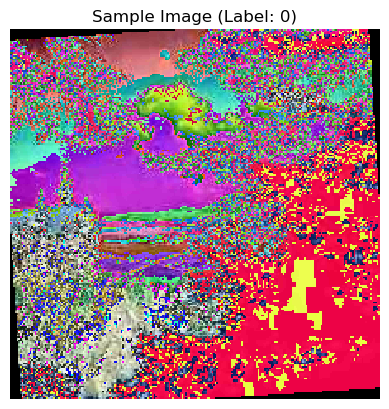

In [12]:
# Function to display a sample image from a PyTorch dataset
def display_sample_from_dataset(dataset, index):
    image_tensor, label = dataset[index]
    image = transforms.ToPILImage()(image_tensor)  # Convert tensor to PIL Image
    plt.imshow(image)
    plt.title(f"Sample Image (Label: {label})")
    plt.axis('off')
    plt.show()

# Display a sample image from the training dataset
display_sample_from_dataset(train_dataset, 894)

### View effects of transformations

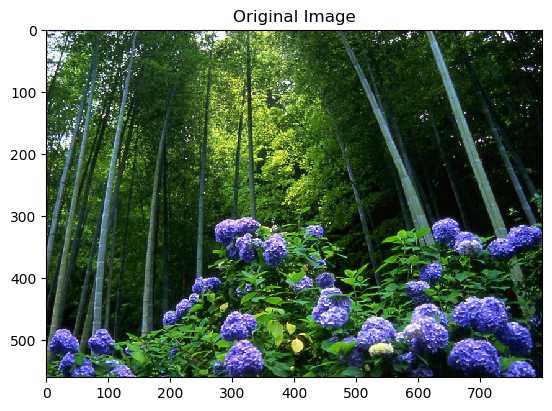

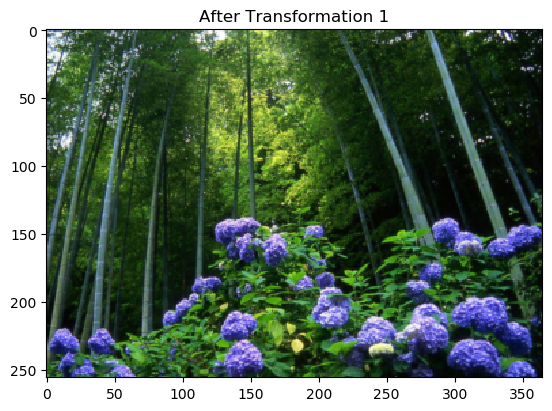

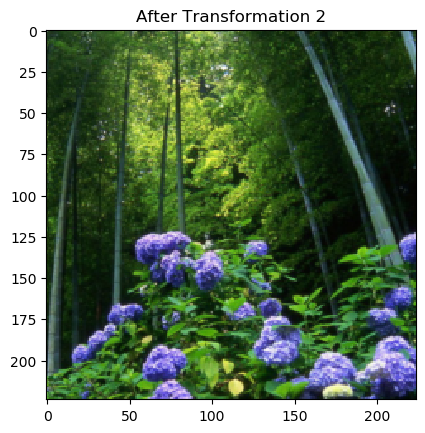

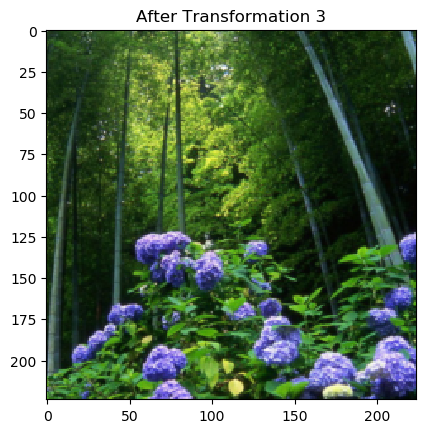

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


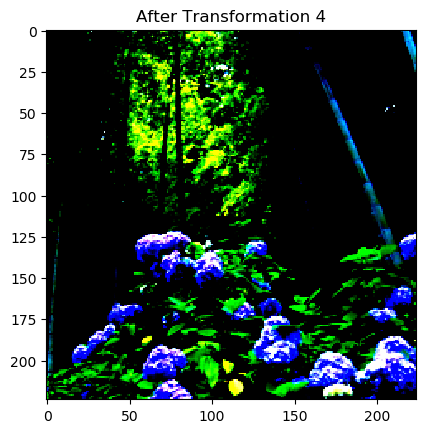

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


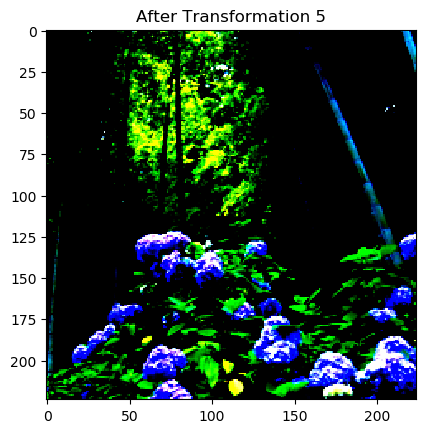

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


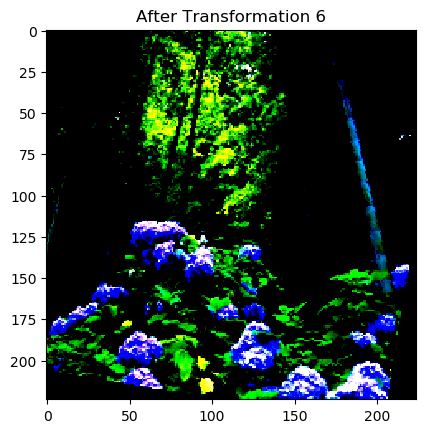

In [72]:
# Define data transformations & augmentations
transform_steps = [
    transforms.Resize(256), # You can adjust the size
    transforms.CenterCrop(224), # You can adjust the crop size
    transforms.ToTensor(),
    # Comment out the normalization to see if it's causing the issue
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10)
]

# Load a sample image
image_path = '/root/example-project/CASIA2/train/authentic/Au_pla_20002.jpg'
image = Image.open(image_path)

original_image = Image.open(image_path)

# Make a copy of the original image to apply transformations
image = original_image.copy()

# Display the original image
plt.imshow(original_image)
plt.title('Original Image')
plt.show()

for i, transform_step in enumerate(transform_steps):
    image = transform_step(image)
    if isinstance(image, torch.Tensor):
        plt.imshow(image.permute(1, 2, 0)) # If the image is a tensor, permute it
    else:
        plt.imshow(image) # If the image is a PIL Image
    plt.title(f'After Transformation {i + 1}')
    plt.show()

## Model Selection and Fine-Tuning

### Code to Save and Reload Datasets

In [86]:
torch.save(train_dataset, 'train_dataset.pth')
torch.save(val_dataset, 'val_dataset.pth')
torch.save(test_dataset, 'test_dataset.pth')

In [11]:
train_dataset = torch.load('train_dataset.pth')
val_dataset = torch.load('val_dataset.pth')
test_dataset = torch.load('test_dataset.pth')

/tmp/ipykernel_18/2114081244.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  train_dataset = torch.load('train_dataset.pth')
/tmp/ipykernel_18/2114081244.py:2: FutureWar

In [12]:
batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [9]:
# Load pre-trained ResNet-50
model = models.resnet50(pretrained=True)

# Modify the last fully connected layer
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2) # 2 classes: authentic and tampered

# Move the model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [18]:
# Prepare Data Loaders
#batch_size = 32

#train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
#test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Training

In [21]:
num_epochs = 10

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train() # Set to training mode
    
    # Training loop with tqdm
    train_loop = tqdm(train_loader, leave=True)
    for images, labels in train_loop:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        train_loop.set_postfix(loss=loss.item())
    
    # Validation
    model.eval() # Set to evaluation mode
    val_loss = 0
    # Validation loop with tqdm
    val_loop = tqdm(val_loader, leave=True)
    with torch.no_grad():
        for images, labels in val_loop:
            loss = criterion(model(images.to(device)), labels.to(device))
            val_loss += loss.item()
            val_loop.set_postfix(val_loss=loss.item())
            
    print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {val_loss/len(val_loader)}")

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.8217063602767413
Epoch 2/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.6357031701769256
Epoch 3/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.6421087512487098
Epoch 4/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.4666880318729938
Epoch 5/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.681577061078971
Epoch 6/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.4961591355408294
Epoch 7/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.7374451513847194
Epoch 8/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.3659638897221111
Epoch 9/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.46702981578138997
Epoch 10/10


100%|██████████| 79/79 [00:21<00:00,  3.64it/s, val_loss=0.52]   

Epoch 10/10, Validation Loss: 0.36865966205331907


### Evaluation

In [22]:
model.eval() # Set to evaluation mode
predictions, true_labels = [], []

# Evaluation loop with tqdm
test_loop = tqdm(test_loader, leave=True)
with torch.no_grad():
    for images, labels in test_loop:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        predictions.extend(preds.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        test_loop.set_postfix(Evaluating=True)

accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)

print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")

100%|██████████| 79/79 [00:49<00:00,  1.61it/s, Evaluating=1]

Accuracy: 0.8318163830629205, Precision: 0.7901353965183753, Recall: 0.7970731707317074, F1-Score: 0.7935891209324916


In [23]:
# Save model
model_path = 'model.pth'
torch.save(model.state_dict(), model_path)

## Hyperparameter Tuning

### Training

In [25]:
def create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size):
    """
    Create data loaders for training, validation, and test datasets.

    :param train_dataset: Training dataset
    :param val_dataset: Validation dataset
    :param test_dataset: Test dataset
    :param batch_size: Batch size for training
    :return: train_loader, val_loader, test_loader
    """
    
    # Training data loader with shuffling
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    
    # Validation and test data loaders without shuffling
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader

In [14]:
def initialize_resnet(num_classes=2):
    """
    Initialize and return a pre-trained ResNet model adjusted for binary classification.
    """
    model = models.resnet50(pretrained=True)
    # Freeze all layers
    for param in model.parameters():
        param.requires_grad = False
    # Adjust final layer for binary classification
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)
    return model

In [23]:
# Define hyperparameter ranges
learning_rates = [0.0001, 0.001]
batch_sizes = [64]
weight_decays = [0]
optimizers = [Adam]
num_epochs = 10

best_val_loss = float('inf')
best_model = None

# Iterate through hyperparameter combinations
for lr in learning_rates:
    for batch_size in batch_sizes:
        for weight_decay in weight_decays:
            for Optimizer in optimizers:
                print(f"Training with lr={lr}, batch_size={batch_size}, weight_decay={weight_decay}, optimizer={Optimizer.__name__}")
                
                # Initialize model, optimizer, and scheduler
                model = initialize_resnet() 
                model = model.to(device)  # Move model to the same device as your data
                optimizer = Optimizer(model.parameters(), lr=lr, weight_decay=weight_decay)
                scheduler = ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.1)
                
                # Create data loaders with the current batch size
                train_loader, val_loader, test_loader = create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size)
                
                # Training loop
                for epoch in range(num_epochs):
                    model.train()
                    train_loop = tqdm(train_loader, leave=True)
                    for images, labels in train_loop:
                        images, labels = images.to(device), labels.to(device)
                        optimizer.zero_grad()
                        outputs = model(images)
                        loss = criterion(outputs, labels)
                        loss.backward()
                        optimizer.step()
                        train_loop.set_postfix(loss=loss.item())
                
                    # Validation
                    model.eval()
                    val_loss = 0
                    val_loop = tqdm(val_loader, leave=True)
                    with torch.no_grad():
                        for images, labels in val_loop:
                            loss = criterion(model(images.to(device)), labels.to(device))
                            val_loss += loss.item()
                            val_loop.set_postfix(val_loss=loss.item())
                    
                    avg_val_loss = val_loss/len(val_loader)
                    print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")
                    scheduler.step(avg_val_loss)
                
                # Save the best model
                if avg_val_loss < best_val_loss:
                    best_val_loss = avg_val_loss
                    best_model = model
                    torch.save(model.state_dict(), 'best_model.pth')

print("Training completed. Best model saved.")

Training with lr=0.0001, batch_size=64, weight_decay=0, optimizer=Adam



100%|██████████| 119/119 [02:09<00:00,  1.09s/it, loss=0.636]

100%|██████████| 40/40 [00:40<00:00,  1.02s/it, val_loss=0.903]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6583080604672432



100%|██████████| 119/119 [01:03<00:00,  1.86it/s, loss=0.579]

100%|██████████| 40/40 [00:20<00:00,  1.96it/s, val_loss=0.745]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.6305464886128902



100%|██████████| 119/119 [01:03<00:00,  1.87it/s, loss=0.719]

100%|██████████| 40/40 [00:20<00:00,  1.91it/s, val_loss=0.749]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.6127823360264302



100%|██████████| 119/119 [01:03<00:00,  1.86it/s, loss=0.621]

100%|██████████| 40/40 [00:20<00:00,  1.94it/s, val_loss=0.646]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.6023787818849087



100%|██████████| 119/119 [01:03<00:00,  1.87it/s, loss=0.562]

100%|██████████| 40/40 [00:20<00:00,  1.95it/s, val_loss=0.688]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5887702889740467



100%|██████████| 119/119 [01:03<00:00,  1.87it/s, loss=0.572]

100%|██████████| 40/40 [00:20<00:00,  1.94it/s, val_loss=0.713]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.5916150152683258



100%|██████████| 119/119 [01:04<00:00,  1.85it/s, loss=0.526]

100%|██████████| 40/40 [00:21<00:00,  1.90it/s, val_loss=0.609]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.5871038392186165



100%|██████████| 119/119 [01:04<00:00,  1.84it/s, loss=0.534]

100%|██████████| 40/40 [00:20<00:00,  1.93it/s, val_loss=0.647]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.582244423776865



100%|██████████| 119/119 [01:03<00:00,  1.86it/s, loss=0.684]

100%|██████████| 40/40 [00:20<00:00,  1.93it/s, val_loss=0.62]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.5836173065006733



100%|██████████| 119/119 [01:04<00:00,  1.85it/s, loss=0.543]

100%|██████████| 40/40 [00:20<00:00,  1.95it/s, val_loss=0.629]


Epoch 10/10, Validation Loss: 0.5787599045783282
Training with lr=0.001, batch_size=64, weight_decay=0, optimizer=Adam



100%|██████████| 119/119 [01:03<00:00,  1.86it/s, loss=0.431]

100%|██████████| 40/40 [00:20<00:00,  1.94it/s, val_loss=1.21]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6666411148384214



100%|██████████| 119/119 [01:04<00:00,  1.85it/s, loss=0.554]

100%|██████████| 40/40 [00:20<00:00,  1.95it/s, val_loss=0.548]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.570287075266242



100%|██████████| 119/119 [01:03<00:00,  1.86it/s, loss=0.541]

100%|██████████| 40/40 [00:20<00:00,  1.93it/s, val_loss=0.682]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.5642099983990192



100%|██████████| 119/119 [01:04<00:00,  1.85it/s, loss=0.632]

100%|██████████| 40/40 [00:20<00:00,  1.91it/s, val_loss=1.17]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.655965831130743



100%|██████████| 119/119 [01:04<00:00,  1.84it/s, loss=0.565]

100%|██████████| 40/40 [00:20<00:00,  1.92it/s, val_loss=0.689]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5616096779704094



100%|██████████| 119/119 [01:04<00:00,  1.85it/s, loss=0.334]

100%|██████████| 40/40 [00:21<00:00,  1.89it/s, val_loss=0.668]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.5570041574537754



100%|██████████| 119/119 [01:04<00:00,  1.84it/s, loss=0.623]

100%|██████████| 40/40 [00:21<00:00,  1.90it/s, val_loss=0.475]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.5514214567840099



100%|██████████| 119/119 [01:04<00:00,  1.83it/s, loss=0.652]

100%|██████████| 40/40 [00:21<00:00,  1.90it/s, val_loss=0.653]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.5574095459654927



100%|██████████| 119/119 [01:04<00:00,  1.84it/s, loss=0.606]

100%|██████████| 40/40 [00:20<00:00,  1.92it/s, val_loss=0.858]

  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.5869782637804747



100%|██████████| 119/119 [01:04<00:00,  1.86it/s, loss=0.603]

100%|██████████| 40/40 [00:21<00:00,  1.88it/s, val_loss=0.602]


Epoch 10/10, Validation Loss: 0.5474699476733804
Training completed. Best model saved.


### Evaluation

In [24]:
model.eval() # Set to evaluation mode
predictions, true_labels = [], []

# Evaluation loop with tqdm
test_loop = tqdm(test_loader, leave=True)
with torch.no_grad():
    for images, labels in test_loop:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        predictions.extend(preds.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        test_loop.set_postfix(Evaluating=True)

accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)

print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")


100%|██████████| 40/40 [00:42<00:00,  1.06s/it, Evaluating=1]

Accuracy: 0.741986545310645, Precision: 0.7217598097502973, Recall: 0.5921951219512195, F1-Score: 0.6505894962486604


### Second Round of Hyperparameter Tuning

In [26]:
tuning_round = 'tuning_2'
best_model_path = f"best_model_{tuning_round}.pth"
print(best_model_path)

best_model_tuning_2.pth


In [27]:
# Define hyperparameter ranges
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()

learning_rates = [0.001]
batch_sizes = [32]
weight_decays = [0]
optimizers = [Adam, SGD]
num_epochs_list = [10, 20]  # Changed variable name to avoid conflict

best_val_loss = float('inf')
best_model = None
tuning_round = 'tuning_2'
best_model_path = f"best_model_{tuning_round}.pth"

# Iterate through hyperparameter combinations
for lr in learning_rates:
    for batch_size in batch_sizes:
        for weight_decay in weight_decays:
            for Optimizer in optimizers:
                for num_epochs in num_epochs_list:  # Added loop for num_epochs
                    print(f"Training with lr={lr}, batch_size={batch_size}, weight_decay={weight_decay}, optimizer={Optimizer.__name__}, num_epochs={num_epochs}")

                    # Initialize model, optimizer, and scheduler
                    model = initialize_resnet()
                    model = model.to(device)  # Move model to the same device as your data
                    optimizer = Optimizer(model.parameters(), lr=lr, weight_decay=weight_decay)
                    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.1)

                    # Create data loaders with the current batch size
                    train_loader, val_loader, test_loader = create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size)

                    # Training loop
                    for epoch in range(num_epochs):
                        model.train()
                        train_loop = tqdm(train_loader, leave=True)
                        for images, labels in train_loop:
                            images, labels = images.to(device), labels.to(device)
                            optimizer.zero_grad()
                            outputs = model(images)
                            loss = criterion(outputs, labels)
                            loss.backward()
                            optimizer.step()
                            train_loop.set_postfix(loss=loss.item())

                        # Validation
                        model.eval()
                        val_loss = 0
                        val_loop = tqdm(val_loader, leave=True)
                        with torch.no_grad():
                            for images, labels in val_loop:
                                images, labels = images.to(device), labels.to(device)
                                loss = criterion(model(images), labels)
                                val_loss += loss.item()
                                val_loop.set_postfix(val_loss=loss.item())

                        avg_val_loss = val_loss / len(val_loader)
                        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")
                        scheduler.step(avg_val_loss)

                    # Save the best model
                    if avg_val_loss < best_val_loss:
                        best_val_loss = avg_val_loss
                        best_model = model
                        torch.save(model.state_dict(), best_model_path)

print("Training completed. Best model saved.")

Training with lr=0.001, batch_size=32, weight_decay=0, optimizer=Adam, num_epochs=10



100%|██████████| 237/237 [01:05<00:00,  3.62it/s, loss=0.688]

100%|██████████| 79/79 [00:21<00:00,  3.68it/s, val_loss=0.508]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.5947383919471427



100%|██████████| 237/237 [01:03<00:00,  3.73it/s, loss=0.679]

100%|██████████| 79/79 [00:20<00:00,  3.81it/s, val_loss=0.466]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.5785231667606137



100%|██████████| 237/237 [01:03<00:00,  3.73it/s, loss=0.539]

100%|██████████| 79/79 [00:20<00:00,  3.83it/s, val_loss=0.911]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.5900386467198783



100%|██████████| 237/237 [01:04<00:00,  3.70it/s, loss=0.36]

100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=0.476]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.5672333182036122



100%|██████████| 237/237 [01:03<00:00,  3.73it/s, loss=0.443]

100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=1.03]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.6144839271054238



100%|██████████| 237/237 [01:03<00:00,  3.75it/s, loss=0.485]

100%|██████████| 79/79 [00:20<00:00,  3.86it/s, val_loss=0.403]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.5700206053030642



100%|██████████| 237/237 [01:04<00:00,  3.65it/s, loss=0.377]

100%|██████████| 79/79 [00:21<00:00,  3.70it/s, val_loss=0.608]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.5521358933441246



100%|██████████| 237/237 [01:04<00:00,  3.66it/s, loss=0.495]

100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=1.03]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.6397894910902162



100%|██████████| 237/237 [01:03<00:00,  3.72it/s, loss=0.551]

100%|██████████| 79/79 [00:20<00:00,  3.82it/s, val_loss=0.385]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.5862554971930347



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.398]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.433]


Epoch 10/10, Validation Loss: 0.5577064281023001
Training with lr=0.001, batch_size=32, weight_decay=0, optimizer=Adam, num_epochs=20



100%|██████████| 237/237 [01:03<00:00,  3.73it/s, loss=0.789]

100%|██████████| 79/79 [00:20<00:00,  3.81it/s, val_loss=0.322]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.6716060819505136



100%|██████████| 237/237 [01:04<00:00,  3.70it/s, loss=0.459]

100%|██████████| 79/79 [00:20<00:00,  3.76it/s, val_loss=0.427]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.5897005734187138



100%|██████████| 237/237 [01:03<00:00,  3.73it/s, loss=0.472]

100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=0.851]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.5870329089745691



100%|██████████| 237/237 [01:04<00:00,  3.69it/s, loss=0.389]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.46]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.5752011471534078



100%|██████████| 237/237 [01:04<00:00,  3.67it/s, loss=0.655]

100%|██████████| 79/79 [00:20<00:00,  3.81it/s, val_loss=0.473]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.5589907776705826



100%|██████████| 237/237 [01:04<00:00,  3.69it/s, loss=0.487]

100%|██████████| 79/79 [00:20<00:00,  3.77it/s, val_loss=0.485]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.5603133392862126



100%|██████████| 237/237 [01:04<00:00,  3.70it/s, loss=0.789]

100%|██████████| 79/79 [00:20<00:00,  3.80it/s, val_loss=0.626]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.5563642923024636



100%|██████████| 237/237 [01:04<00:00,  3.70it/s, loss=0.371]

100%|██████████| 79/79 [00:20<00:00,  3.80it/s, val_loss=0.434]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.5587527717970595



100%|██████████| 237/237 [01:03<00:00,  3.73it/s, loss=0.534]

100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=0.685]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.5729248016318188



100%|██████████| 237/237 [01:03<00:00,  3.73it/s, loss=0.483]

100%|██████████| 79/79 [00:20<00:00,  3.77it/s, val_loss=0.815]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.5784144430786748



100%|██████████| 237/237 [01:04<00:00,  3.68it/s, loss=0.903]

100%|██████████| 79/79 [00:21<00:00,  3.75it/s, val_loss=0.644]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.5446187609547302



100%|██████████| 237/237 [01:03<00:00,  3.72it/s, loss=0.691]

100%|██████████| 79/79 [00:20<00:00,  3.86it/s, val_loss=0.472]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5453808798065668



100%|██████████| 237/237 [01:04<00:00,  3.67it/s, loss=0.314]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.466]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.5439467533857008



100%|██████████| 237/237 [01:04<00:00,  3.67it/s, loss=0.338]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.595]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.5372775628974166



100%|██████████| 237/237 [01:04<00:00,  3.69it/s, loss=0.476]

100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=0.441]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.5518519987788382



100%|██████████| 237/237 [01:04<00:00,  3.67it/s, loss=0.476]

100%|██████████| 79/79 [00:21<00:00,  3.75it/s, val_loss=0.732]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.5513118875177601



100%|██████████| 237/237 [01:03<00:00,  3.72it/s, loss=0.407]

100%|██████████| 79/79 [00:20<00:00,  3.80it/s, val_loss=0.686]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.5505391410257243



100%|██████████| 237/237 [01:04<00:00,  3.69it/s, loss=0.585]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.556]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.5365076513984536



100%|██████████| 237/237 [01:04<00:00,  3.69it/s, loss=0.642]

100%|██████████| 79/79 [00:20<00:00,  3.82it/s, val_loss=0.598]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.5389625572516948



100%|██████████| 237/237 [01:03<00:00,  3.72it/s, loss=0.317]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.535]


Epoch 20/20, Validation Loss: 0.5525999091848542
Training with lr=0.001, batch_size=32, weight_decay=0, optimizer=SGD, num_epochs=10



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.655]

100%|██████████| 79/79 [00:20<00:00,  3.82it/s, val_loss=0.798]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6476829033109206



100%|██████████| 237/237 [01:03<00:00,  3.74it/s, loss=0.627]

100%|██████████| 79/79 [00:20<00:00,  3.81it/s, val_loss=0.777]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.622071117539949



100%|██████████| 237/237 [01:04<00:00,  3.69it/s, loss=0.611]

100%|██████████| 79/79 [00:21<00:00,  3.71it/s, val_loss=0.791]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.6058608485928064



100%|██████████| 237/237 [01:04<00:00,  3.70it/s, loss=0.71]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.768]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.5985010649207272



100%|██████████| 237/237 [01:04<00:00,  3.69it/s, loss=0.647]

100%|██████████| 79/79 [00:20<00:00,  3.84it/s, val_loss=0.702]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5909209736163104



100%|██████████| 237/237 [01:04<00:00,  3.70it/s, loss=0.49]

100%|██████████| 79/79 [00:20<00:00,  3.82it/s, val_loss=0.75]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.5822628234760671



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.446]

100%|██████████| 79/79 [00:20<00:00,  3.80it/s, val_loss=0.675]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.5832227809896952



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.545]

100%|██████████| 79/79 [00:20<00:00,  3.84it/s, val_loss=0.755]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.5778452703092671



100%|██████████| 237/237 [01:03<00:00,  3.72it/s, loss=0.553]

100%|██████████| 79/79 [00:20<00:00,  3.87it/s, val_loss=0.617]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.5730894249451312



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.521]

100%|██████████| 79/79 [00:20<00:00,  3.84it/s, val_loss=0.62]


Epoch 10/10, Validation Loss: 0.5731669173964972
Training with lr=0.001, batch_size=32, weight_decay=0, optimizer=SGD, num_epochs=20



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.641]

100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=0.726]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.6352450708045235



100%|██████████| 237/237 [01:03<00:00,  3.72it/s, loss=0.564]

100%|██████████| 79/79 [00:20<00:00,  3.82it/s, val_loss=0.836]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.616080821692189



100%|██████████| 237/237 [01:03<00:00,  3.74it/s, loss=0.548]

100%|██████████| 79/79 [00:20<00:00,  3.82it/s, val_loss=0.734]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.5983089770697341



100%|██████████| 237/237 [01:04<00:00,  3.70it/s, loss=0.547]

100%|██████████| 79/79 [00:21<00:00,  3.74it/s, val_loss=0.735]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.596051652220231



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.626]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.636]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.587454813567898



100%|██████████| 237/237 [01:04<00:00,  3.67it/s, loss=0.607]

100%|██████████| 79/79 [00:20<00:00,  3.79it/s, val_loss=0.751]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.5803177158666563



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.433]

100%|██████████| 79/79 [00:20<00:00,  3.83it/s, val_loss=0.64]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.5746667345490637



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.522]

100%|██████████| 79/79 [00:20<00:00,  3.83it/s, val_loss=0.626]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.5766892301130898



100%|██████████| 237/237 [01:03<00:00,  3.74it/s, loss=0.641]

100%|██████████| 79/79 [00:20<00:00,  3.77it/s, val_loss=0.661]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.5728479621908332



100%|██████████| 237/237 [01:03<00:00,  3.74it/s, loss=0.652]

100%|██████████| 79/79 [00:20<00:00,  3.84it/s, val_loss=0.634]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.5742547308342366



100%|██████████| 237/237 [01:03<00:00,  3.74it/s, loss=0.705]

100%|██████████| 79/79 [00:20<00:00,  3.80it/s, val_loss=0.732]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.5736601039578643



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.507]

100%|██████████| 79/79 [00:20<00:00,  3.80it/s, val_loss=0.766]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5754533738275117



100%|██████████| 237/237 [01:03<00:00,  3.72it/s, loss=0.57]

100%|██████████| 79/79 [00:20<00:00,  3.83it/s, val_loss=0.678]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.5698180043999153



100%|██████████| 237/237 [01:03<00:00,  3.71it/s, loss=0.525]

100%|██████████| 79/79 [00:20<00:00,  3.81it/s, val_loss=0.654]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.5689075119510482



100%|██████████| 237/237 [01:04<00:00,  3.68it/s, loss=0.703]

100%|██████████| 79/79 [00:21<00:00,  3.75it/s, val_loss=0.625]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.5706589163481435



100%|██████████| 237/237 [01:05<00:00,  3.61it/s, loss=0.436]

100%|██████████| 79/79 [00:21<00:00,  3.71it/s, val_loss=0.672]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.5654307688716091



100%|██████████| 237/237 [01:05<00:00,  3.64it/s, loss=0.62]

100%|██████████| 79/79 [00:21<00:00,  3.73it/s, val_loss=0.636]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.5677294184135485



100%|██████████| 237/237 [01:05<00:00,  3.61it/s, loss=0.47]

100%|██████████| 79/79 [00:21<00:00,  3.65it/s, val_loss=0.658]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.5730459880602511



100%|██████████| 237/237 [01:05<00:00,  3.59it/s, loss=0.55]

100%|██████████| 79/79 [00:21<00:00,  3.66it/s, val_loss=0.606]

  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.566329680100272



100%|██████████| 237/237 [01:05<00:00,  3.64it/s, loss=0.455]

100%|██████████| 79/79 [00:21<00:00,  3.72it/s, val_loss=0.633]

Epoch 20/20, Validation Loss: 0.5651120154917995
Training completed. Best model saved.


In [28]:
model.eval() # Set to evaluation mode
predictions, true_labels = [], []

# Evaluation loop with tqdm
test_loop = tqdm(test_loader, leave=True)
with torch.no_grad():
    for images, labels in test_loop:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        predictions.extend(preds.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        test_loop.set_postfix(Evaluating=True)

accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)

print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")


100%|██████████| 79/79 [00:22<00:00,  3.50it/s, Evaluating=1]

Accuracy: 0.737633557578156, Precision: 0.7129411764705882, Recall: 0.5912195121951219, F1-Score: 0.6463999999999999


### Third Round of Hyperparameter Tuning

In [29]:
# Define hyperparameter ranges
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()

learning_rates = [0.001]
batch_sizes = [128]
weight_decays = [0]
optimizers = [Adam]
num_epochs_list = [10, 20]  # Changed variable name to avoid conflict

best_val_loss = float('inf')
best_model = None
tuning_round = 'tuning_3'
best_model_path = f"best_model_{tuning_round}.pth"

# Iterate through hyperparameter combinations
for lr in learning_rates:
    for batch_size in batch_sizes:
        for weight_decay in weight_decays:
            for Optimizer in optimizers:
                for num_epochs in num_epochs_list:  # Added loop for num_epochs
                    print(f"Training with lr={lr}, batch_size={batch_size}, weight_decay={weight_decay}, optimizer={Optimizer.__name__}, num_epochs={num_epochs}")

                    # Initialize model, optimizer, and scheduler
                    model = initialize_resnet()
                    model = model.to(device)  # Move model to the same device as your data
                    optimizer = Optimizer(model.parameters(), lr=lr, weight_decay=weight_decay)
                    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.1)

                    # Create data loaders with the current batch size
                    train_loader, val_loader, test_loader = create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size)

                    # Training loop
                    for epoch in range(num_epochs):
                        model.train()
                        train_loop = tqdm(train_loader, leave=True)
                        for images, labels in train_loop:
                            images, labels = images.to(device), labels.to(device)
                            optimizer.zero_grad()
                            outputs = model(images)
                            loss = criterion(outputs, labels)
                            loss.backward()
                            optimizer.step()
                            train_loop.set_postfix(loss=loss.item())

                        # Validation
                        model.eval()
                        val_loss = 0
                        val_loop = tqdm(val_loader, leave=True)
                        with torch.no_grad():
                            for images, labels in val_loop:
                                images, labels = images.to(device), labels.to(device)
                                loss = criterion(model(images), labels)
                                val_loss += loss.item()
                                val_loop.set_postfix(val_loss=loss.item())

                        avg_val_loss = val_loss / len(val_loader)
                        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")
                        scheduler.step(avg_val_loss)

                    # Save the best model
                    if avg_val_loss < best_val_loss:
                        best_val_loss = avg_val_loss
                        best_model = model
                        torch.save(model.state_dict(), best_model_path)

print("Training completed. Best model saved.")

Training with lr=0.001, batch_size=128, weight_decay=0, optimizer=Adam, num_epochs=10



100%|██████████| 60/60 [01:06<00:00,  1.10s/it, loss=0.797]

100%|██████████| 20/20 [00:21<00:00,  1.08s/it, val_loss=1.12]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6519415773451328



100%|██████████| 60/60 [01:03<00:00,  1.06s/it, loss=0.693]

100%|██████████| 20/20 [00:20<00:00,  1.03s/it, val_loss=0.732]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.5875547245144844



100%|██████████| 60/60 [01:03<00:00,  1.06s/it, loss=0.602]

100%|██████████| 20/20 [00:20<00:00,  1.02s/it, val_loss=1.03]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.6113378338515758



100%|██████████| 60/60 [01:04<00:00,  1.07s/it, loss=0.532]

100%|██████████| 20/20 [00:21<00:00,  1.05s/it, val_loss=0.642]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.5751051872968673



100%|██████████| 60/60 [01:04<00:00,  1.08s/it, loss=0.686]

100%|██████████| 20/20 [00:21<00:00,  1.06s/it, val_loss=0.615]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5621128290891647



100%|██████████| 60/60 [01:04<00:00,  1.07s/it, loss=0.397]

100%|██████████| 20/20 [00:20<00:00,  1.05s/it, val_loss=0.61]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.561473798751831



100%|██████████| 60/60 [01:04<00:00,  1.08s/it, loss=0.352]

100%|██████████| 20/20 [00:20<00:00,  1.04s/it, val_loss=0.782]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.5639380037784576



100%|██████████| 60/60 [01:05<00:00,  1.08s/it, loss=0.548]

100%|██████████| 20/20 [00:21<00:00,  1.07s/it, val_loss=0.737]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.557996329665184



100%|██████████| 60/60 [01:05<00:00,  1.10s/it, loss=0.436]

100%|██████████| 20/20 [00:21<00:00,  1.08s/it, val_loss=0.638]

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.5562277287244797



100%|██████████| 60/60 [01:06<00:00,  1.10s/it, loss=0.441]

100%|██████████| 20/20 [00:21<00:00,  1.05s/it, val_loss=0.754]


Epoch 10/10, Validation Loss: 0.558492861688137
Training with lr=0.001, batch_size=128, weight_decay=0, optimizer=Adam, num_epochs=20



 60%|██████    | 36/60 [00:39<00:26,  1.11s/it, loss=0.611]

KeyboardInterrupt: 

In [ ]:
model.eval() # Set to evaluation mode
predictions, true_labels = [], []

# Evaluation loop with tqdm
test_loop = tqdm(test_loader, leave=True)
with torch.no_grad():
    for images, labels in test_loop:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        predictions.extend(preds.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        test_loop.set_postfix(Evaluating=True)

accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)

print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")

### Fourth Round of Hyperparameter Tuning

In [30]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()

learning_rates = [0.0005, 0.001]
batch_sizes = [32]
weight_decays = [0, 0.0001]
optimizers = [Adam, SGD]
num_epochs_list = [10]  # Changed variable name to avoid conflict

best_val_loss = float('inf')
best_model = None
tuning_round = 'tuning_4'
best_model_path = f"best_model_{tuning_round}.pth"

# Iterate through hyperparameter combinations
for lr in learning_rates:
    for batch_size in batch_sizes:
        for weight_decay in weight_decays:
            for Optimizer in optimizers:
                for num_epochs in num_epochs_list:  # Added loop for num_epochs
                    print(f"Training with lr={lr}, batch_size={batch_size}, weight_decay={weight_decay}, optimizer={Optimizer.__name__}, num_epochs={num_epochs}")

                    # Initialize model, optimizer, and scheduler
                    model = initialize_resnet()
                    model = model.to(device)  # Move model to the same device as your data
                    optimizer = Optimizer(model.parameters(), lr=lr, weight_decay=weight_decay)
                    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.1)

                    # Create data loaders with the current batch size
                    train_loader, val_loader, test_loader = create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size)

                    # Training loop
                    for epoch in range(num_epochs):
                        model.train()
                        train_loop = tqdm(train_loader, leave=True)
                        for images, labels in train_loop:
                            images, labels = images.to(device), labels.to(device)
                            optimizer.zero_grad()
                            outputs = model(images)
                            loss = criterion(outputs, labels)
                            loss.backward()
                            optimizer.step()
                            train_loop.set_postfix(loss=loss.item())

                        # Validation
                        model.eval()
                        val_loss = 0
                        val_loop = tqdm(val_loader, leave=True)
                        with torch.no_grad():
                            for images, labels in val_loop:
                                images, labels = images.to(device), labels.to(device)
                                loss = criterion(model(images), labels)
                                val_loss += loss.item()
                                val_loop.set_postfix(val_loss=loss.item())

                        avg_val_loss = val_loss / len(val_loader)
                        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")
                        scheduler.step(avg_val_loss)

                    # Save the best model
                    if avg_val_loss < best_val_loss:
                        best_val_loss = avg_val_loss
                        best_model = model
                        torch.save(model.state_dict(), best_model_path)

print("Training completed. Best model saved.")

Training with lr=0.0005, batch_size=32, weight_decay=0, optimizer=Adam, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.694]

  0%|          | 1/237 [00:00<01:14,  3.15it/s, loss=0.694]

  0%|          | 1/237 [00:00<01:14,  3.15it/s, loss=0.618]

  1%|          | 2/237 [00:00<01:16,  3.07it/s, loss=0.618]

  1%|          | 2/237 [00:00<01:16,  3.07it/s, loss=0.733]

  1%|▏         | 3/237 [00:00<01:15,  3.12it/s, loss=0.733]

  1%|▏         | 3/237 [00:01<01:15,  3.12it/s, loss=0.653]

  2%|▏         | 4/237 [00:01<01:12,  3.23it/s, loss=0.653]

  2%|▏         | 4/237 [00:01<01:12,  3.23it/s, loss=0.709]

  2%|▏         | 5/237 [00:01<01:11,  3.24it/s, loss=0.709]

  2%|▏         | 5/237 [00:01<01:11,  3.24it/s, loss=0.672]

  3%|▎         | 6/237 [00:01<01:10,  3.29it/s, loss=0.672]

  3%|▎         | 6/237 [00:02<01:10,  3.29it/s, loss=0.716]

  3%|▎         | 7/237 [00:02<01:07,  3.39it/s, loss=0.716]

  3%|▎         | 7/237 [00:02<01:07,  3.39it/s, loss=0.716]

  3%|▎         | 8/237 [00:02<01:05,  3.49it/s, lo

Epoch 1/10, Validation Loss: 0.6003967726343795




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.626]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.626]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.518]

  1%|          | 2/237 [00:00<01:03,  3.70it/s, loss=0.518]

  1%|          | 2/237 [00:00<01:03,  3.70it/s, loss=0.596]

  1%|▏         | 3/237 [00:00<01:04,  3.65it/s, loss=0.596]

  1%|▏         | 3/237 [00:01<01:04,  3.65it/s, loss=0.602]

  2%|▏         | 4/237 [00:01<01:06,  3.53it/s, loss=0.602]

  2%|▏         | 4/237 [00:01<01:06,  3.53it/s, loss=0.653]

  2%|▏         | 5/237 [00:01<01:04,  3.60it/s, loss=0.653]

  2%|▏         | 5/237 [00:01<01:04,  3.60it/s, loss=0.566]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.566]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.689]

  3%|▎         | 7/237 [00:01<01:03,  3.64it/s, loss=0.689]

  3%|▎         | 7/237 [00:02<01:03,  3.64it/s, loss=0.625]

  3%|▎         | 8/237 [00:02<01:04,  3.54it/s, loss=0.625]

  3%|▎         | 8/237 [00:02<

Epoch 2/10, Validation Loss: 0.5727921688481222




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.475]

  0%|          | 1/237 [00:00<01:08,  3.42it/s, loss=0.475]

  0%|          | 1/237 [00:00<01:08,  3.42it/s, loss=0.654]

  1%|          | 2/237 [00:00<01:10,  3.34it/s, loss=0.654]

  1%|          | 2/237 [00:00<01:10,  3.34it/s, loss=0.462]

  1%|▏         | 3/237 [00:00<01:08,  3.39it/s, loss=0.462]

  1%|▏         | 3/237 [00:01<01:08,  3.39it/s, loss=0.58] 

  2%|▏         | 4/237 [00:01<01:07,  3.43it/s, loss=0.58]

  2%|▏         | 4/237 [00:01<01:07,  3.43it/s, loss=0.564]

  2%|▏         | 5/237 [00:01<01:08,  3.40it/s, loss=0.564]

  2%|▏         | 5/237 [00:01<01:08,  3.40it/s, loss=0.655]

  3%|▎         | 6/237 [00:01<01:07,  3.41it/s, loss=0.655]

  3%|▎         | 6/237 [00:02<01:07,  3.41it/s, loss=0.638]

  3%|▎         | 7/237 [00:02<01:05,  3.50it/s, loss=0.638]

  3%|▎         | 7/237 [00:02<01:05,  3.50it/s, loss=0.466]

  3%|▎         | 8/237 [00:02<01:04,  3.55it/s, loss=0.466]

  3%|▎         | 8/237 [00:02<0

Epoch 3/10, Validation Loss: 0.5944977608285372




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.552]

  0%|          | 1/237 [00:00<01:03,  3.69it/s, loss=0.552]

  0%|          | 1/237 [00:00<01:03,  3.69it/s, loss=0.614]

  1%|          | 2/237 [00:00<01:05,  3.61it/s, loss=0.614]

  1%|          | 2/237 [00:00<01:05,  3.61it/s, loss=0.597]

  1%|▏         | 3/237 [00:00<01:04,  3.62it/s, loss=0.597]

  1%|▏         | 3/237 [00:01<01:04,  3.62it/s, loss=0.654]

  2%|▏         | 4/237 [00:01<01:04,  3.61it/s, loss=0.654]

  2%|▏         | 4/237 [00:01<01:04,  3.61it/s, loss=0.6]  

  2%|▏         | 5/237 [00:01<01:02,  3.69it/s, loss=0.6]

  2%|▏         | 5/237 [00:01<01:02,  3.69it/s, loss=0.564]

  3%|▎         | 6/237 [00:01<01:04,  3.61it/s, loss=0.564]

  3%|▎         | 6/237 [00:01<01:04,  3.61it/s, loss=0.496]

  3%|▎         | 7/237 [00:01<01:02,  3.70it/s, loss=0.496]

  3%|▎         | 7/237 [00:02<01:02,  3.70it/s, loss=0.634]

  3%|▎         | 8/237 [00:02<01:03,  3.63it/s, loss=0.634]

  3%|▎         | 8/237 [00:02<01

Epoch 4/10, Validation Loss: 0.5659511691030068




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.577]

  0%|          | 1/237 [00:00<01:05,  3.61it/s, loss=0.577]

  0%|          | 1/237 [00:00<01:05,  3.61it/s, loss=0.569]

  1%|          | 2/237 [00:00<01:04,  3.67it/s, loss=0.569]

  1%|          | 2/237 [00:00<01:04,  3.67it/s, loss=0.59] 

  1%|▏         | 3/237 [00:00<01:05,  3.58it/s, loss=0.59]

  1%|▏         | 3/237 [00:01<01:05,  3.58it/s, loss=0.601]

  2%|▏         | 4/237 [00:01<01:04,  3.64it/s, loss=0.601]

  2%|▏         | 4/237 [00:01<01:04,  3.64it/s, loss=0.547]

  2%|▏         | 5/237 [00:01<01:05,  3.54it/s, loss=0.547]

  2%|▏         | 5/237 [00:01<01:05,  3.54it/s, loss=0.495]

  3%|▎         | 6/237 [00:01<01:05,  3.52it/s, loss=0.495]

  3%|▎         | 6/237 [00:01<01:05,  3.52it/s, loss=0.514]

  3%|▎         | 7/237 [00:01<01:06,  3.48it/s, loss=0.514]

  3%|▎         | 7/237 [00:02<01:06,  3.48it/s, loss=0.492]

  3%|▎         | 8/237 [00:02<01:04,  3.57it/s, loss=0.492]

  3%|▎         | 8/237 [00:02<0

Epoch 5/10, Validation Loss: 0.5673240212888657




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.506]

  0%|          | 1/237 [00:00<01:14,  3.18it/s, loss=0.506]

  0%|          | 1/237 [00:00<01:14,  3.18it/s, loss=0.802]

  1%|          | 2/237 [00:00<01:17,  3.03it/s, loss=0.802]

  1%|          | 2/237 [00:01<01:17,  3.03it/s, loss=0.564]

  1%|▏         | 3/237 [00:01<01:20,  2.92it/s, loss=0.564]

  1%|▏         | 3/237 [00:01<01:20,  2.92it/s, loss=0.951]

  2%|▏         | 4/237 [00:01<01:17,  3.00it/s, loss=0.951]

  2%|▏         | 4/237 [00:01<01:17,  3.00it/s, loss=0.477]

  2%|▏         | 5/237 [00:01<01:12,  3.19it/s, loss=0.477]

  2%|▏         | 5/237 [00:01<01:12,  3.19it/s, loss=0.742]

  3%|▎         | 6/237 [00:01<01:09,  3.31it/s, loss=0.742]

  3%|▎         | 6/237 [00:02<01:09,  3.31it/s, loss=0.465]

  3%|▎         | 7/237 [00:02<01:08,  3.36it/s, loss=0.465]

  3%|▎         | 7/237 [00:02<01:08,  3.36it/s, loss=0.454]

  3%|▎         | 8/237 [00:02<01:05,  3.47it/s, loss=0.454]

  3%|▎         | 8/237 [00:02<

Epoch 6/10, Validation Loss: 0.6066059137258348




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.639]

  0%|          | 1/237 [00:00<01:00,  3.91it/s, loss=0.639]

  0%|          | 1/237 [00:00<01:00,  3.91it/s, loss=0.614]

  1%|          | 2/237 [00:00<01:01,  3.85it/s, loss=0.614]

  1%|          | 2/237 [00:00<01:01,  3.85it/s, loss=0.441]

  1%|▏         | 3/237 [00:00<01:01,  3.78it/s, loss=0.441]

  1%|▏         | 3/237 [00:01<01:01,  3.78it/s, loss=0.63] 

  2%|▏         | 4/237 [00:01<01:04,  3.64it/s, loss=0.63]

  2%|▏         | 4/237 [00:01<01:04,  3.64it/s, loss=0.67]

  2%|▏         | 5/237 [00:01<01:08,  3.40it/s, loss=0.67]

  2%|▏         | 5/237 [00:01<01:08,  3.40it/s, loss=0.584]

  3%|▎         | 6/237 [00:01<01:06,  3.50it/s, loss=0.584]

  3%|▎         | 6/237 [00:01<01:06,  3.50it/s, loss=0.491]

  3%|▎         | 7/237 [00:02<01:06,  3.46it/s, loss=0.491]

  3%|▎         | 7/237 [00:02<01:06,  3.46it/s, loss=0.559]

  3%|▎         | 8/237 [00:02<01:04,  3.57it/s, loss=0.559]

  3%|▎         | 8/237 [00:02<01:

Epoch 7/10, Validation Loss: 0.5623938052714625




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.549]

  0%|          | 1/237 [00:00<01:12,  3.27it/s, loss=0.549]

  0%|          | 1/237 [00:00<01:12,  3.27it/s, loss=0.361]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.361]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.59] 

  1%|▏         | 3/237 [00:00<01:07,  3.48it/s, loss=0.59]

  1%|▏         | 3/237 [00:01<01:07,  3.48it/s, loss=0.638]

  2%|▏         | 4/237 [00:01<01:05,  3.53it/s, loss=0.638]

  2%|▏         | 4/237 [00:01<01:05,  3.53it/s, loss=0.63] 

  2%|▏         | 5/237 [00:01<01:06,  3.50it/s, loss=0.63]

  2%|▏         | 5/237 [00:01<01:06,  3.50it/s, loss=0.517]

  3%|▎         | 6/237 [00:01<01:09,  3.32it/s, loss=0.517]

  3%|▎         | 6/237 [00:02<01:09,  3.32it/s, loss=0.414]

  3%|▎         | 7/237 [00:02<01:10,  3.28it/s, loss=0.414]

  3%|▎         | 7/237 [00:02<01:10,  3.28it/s, loss=0.545]

  3%|▎         | 8/237 [00:02<01:07,  3.40it/s, loss=0.545]

  3%|▎         | 8/237 [00:02<01

Epoch 8/10, Validation Loss: 0.5580264194102227




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.49]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.49]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.514]

  1%|          | 2/237 [00:00<01:05,  3.57it/s, loss=0.514]

  1%|          | 2/237 [00:00<01:05,  3.57it/s, loss=0.549]

  1%|▏         | 3/237 [00:00<01:05,  3.58it/s, loss=0.549]

  1%|▏         | 3/237 [00:01<01:05,  3.58it/s, loss=0.453]

  2%|▏         | 4/237 [00:01<01:03,  3.64it/s, loss=0.453]

  2%|▏         | 4/237 [00:01<01:03,  3.64it/s, loss=0.603]

  2%|▏         | 5/237 [00:01<01:04,  3.61it/s, loss=0.603]

  2%|▏         | 5/237 [00:01<01:04,  3.61it/s, loss=0.682]

  3%|▎         | 6/237 [00:01<01:04,  3.58it/s, loss=0.682]

  3%|▎         | 6/237 [00:01<01:04,  3.58it/s, loss=0.57] 

  3%|▎         | 7/237 [00:01<01:03,  3.61it/s, loss=0.57]

  3%|▎         | 7/237 [00:02<01:03,  3.61it/s, loss=0.615]

  3%|▎         | 8/237 [00:02<01:03,  3.60it/s, loss=0.615]

  3%|▎         | 8/237 [00:02<01:

Epoch 9/10, Validation Loss: 0.5623775158501878




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.549]

  0%|          | 1/237 [00:00<01:09,  3.40it/s, loss=0.549]

  0%|          | 1/237 [00:00<01:09,  3.40it/s, loss=0.688]

  1%|          | 2/237 [00:00<01:06,  3.51it/s, loss=0.688]

  1%|          | 2/237 [00:00<01:06,  3.51it/s, loss=0.611]

  1%|▏         | 3/237 [00:00<01:05,  3.58it/s, loss=0.611]

  1%|▏         | 3/237 [00:01<01:05,  3.58it/s, loss=0.463]

  2%|▏         | 4/237 [00:01<01:04,  3.59it/s, loss=0.463]

  2%|▏         | 4/237 [00:01<01:04,  3.59it/s, loss=0.56] 

  2%|▏         | 5/237 [00:01<01:04,  3.60it/s, loss=0.56]

  2%|▏         | 5/237 [00:01<01:04,  3.60it/s, loss=0.581]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.581]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.392]

  3%|▎         | 7/237 [00:01<01:02,  3.66it/s, loss=0.392]

  3%|▎         | 7/237 [00:02<01:02,  3.66it/s, loss=0.654]

  3%|▎         | 8/237 [00:02<01:03,  3.60it/s, loss=0.654]

  3%|▎         | 8/237 [00:02<0

Epoch 10/10, Validation Loss: 0.5927087638197066
Training with lr=0.0005, batch_size=32, weight_decay=0, optimizer=SGD, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.74]

  0%|          | 1/237 [00:00<01:00,  3.88it/s, loss=0.74]

  0%|          | 1/237 [00:00<01:00,  3.88it/s, loss=0.744]

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.744]

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.751]

  1%|▏         | 3/237 [00:00<01:04,  3.62it/s, loss=0.751]

  1%|▏         | 3/237 [00:01<01:04,  3.62it/s, loss=0.732]

  2%|▏         | 4/237 [00:01<01:04,  3.60it/s, loss=0.732]

  2%|▏         | 4/237 [00:01<01:04,  3.60it/s, loss=0.715]

  2%|▏         | 5/237 [00:01<01:04,  3.58it/s, loss=0.715]

  2%|▏         | 5/237 [00:01<01:04,  3.58it/s, loss=0.714]

  3%|▎         | 6/237 [00:01<01:05,  3.54it/s, loss=0.714]

  3%|▎         | 6/237 [00:01<01:05,  3.54it/s, loss=0.782]

  3%|▎         | 7/237 [00:01<01:05,  3.53it/s, loss=0.782]

  3%|▎         | 7/237 [00:02<01:05,  3.53it/s, loss=0.662]

  3%|▎         | 8/237 [00:02<01:06,  3.45it/s, loss

Epoch 1/10, Validation Loss: 0.6733826942081693




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.69]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.69]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.643]

  1%|          | 2/237 [00:00<01:02,  3.74it/s, loss=0.643]

  1%|          | 2/237 [00:00<01:02,  3.74it/s, loss=0.655]

  1%|▏         | 3/237 [00:00<01:02,  3.77it/s, loss=0.655]

  1%|▏         | 3/237 [00:01<01:02,  3.77it/s, loss=0.695]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.695]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.72] 

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.72]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.629]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.629]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.626]

  3%|▎         | 7/237 [00:01<00:59,  3.84it/s, loss=0.626]

  3%|▎         | 7/237 [00:02<00:59,  3.84it/s, loss=0.738]

  3%|▎         | 8/237 [00:02<01:03,  3.58it/s, loss=0.738]

  3%|▎         | 8/237 [00:02<01:

Epoch 2/10, Validation Loss: 0.6507341824000394




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.691]

  0%|          | 1/237 [00:00<01:11,  3.32it/s, loss=0.691]

  0%|          | 1/237 [00:00<01:11,  3.32it/s, loss=0.611]

  1%|          | 2/237 [00:00<01:09,  3.36it/s, loss=0.611]

  1%|          | 2/237 [00:00<01:09,  3.36it/s, loss=0.647]

  1%|▏         | 3/237 [00:00<01:07,  3.49it/s, loss=0.647]

  1%|▏         | 3/237 [00:01<01:07,  3.49it/s, loss=0.736]

  2%|▏         | 4/237 [00:01<01:06,  3.51it/s, loss=0.736]

  2%|▏         | 4/237 [00:01<01:06,  3.51it/s, loss=0.662]

  2%|▏         | 5/237 [00:01<01:08,  3.38it/s, loss=0.662]

  2%|▏         | 5/237 [00:01<01:08,  3.38it/s, loss=0.662]

  3%|▎         | 6/237 [00:01<01:08,  3.35it/s, loss=0.662]

  3%|▎         | 6/237 [00:02<01:08,  3.35it/s, loss=0.676]

  3%|▎         | 7/237 [00:02<01:06,  3.44it/s, loss=0.676]

  3%|▎         | 7/237 [00:02<01:06,  3.44it/s, loss=0.685]

  3%|▎         | 8/237 [00:02<01:07,  3.41it/s, loss=0.685]

  3%|▎         | 8/237 [00:02<

Epoch 3/10, Validation Loss: 0.6351089990591701




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.613]

  0%|          | 1/237 [00:00<01:02,  3.80it/s, loss=0.613]

  0%|          | 1/237 [00:00<01:02,  3.80it/s, loss=0.646]

  1%|          | 2/237 [00:00<01:02,  3.77it/s, loss=0.646]

  1%|          | 2/237 [00:00<01:02,  3.77it/s, loss=0.602]

  1%|▏         | 3/237 [00:00<01:02,  3.76it/s, loss=0.602]

  1%|▏         | 3/237 [00:01<01:02,  3.76it/s, loss=0.677]

  2%|▏         | 4/237 [00:01<01:01,  3.76it/s, loss=0.677]

  2%|▏         | 4/237 [00:01<01:01,  3.76it/s, loss=0.677]

  2%|▏         | 5/237 [00:01<01:01,  3.75it/s, loss=0.677]

  2%|▏         | 5/237 [00:01<01:01,  3.75it/s, loss=0.605]

  3%|▎         | 6/237 [00:01<01:01,  3.76it/s, loss=0.605]

  3%|▎         | 6/237 [00:01<01:01,  3.76it/s, loss=0.558]

  3%|▎         | 7/237 [00:01<01:00,  3.79it/s, loss=0.558]

  3%|▎         | 7/237 [00:02<01:00,  3.79it/s, loss=0.601]

  3%|▎         | 8/237 [00:02<01:02,  3.65it/s, loss=0.601]

  3%|▎         | 8/237 [00:02<

Epoch 4/10, Validation Loss: 0.6252243632002722




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.635]

  0%|          | 1/237 [00:00<01:11,  3.28it/s, loss=0.635]

  0%|          | 1/237 [00:00<01:11,  3.28it/s, loss=0.582]

  1%|          | 2/237 [00:00<01:09,  3.37it/s, loss=0.582]

  1%|          | 2/237 [00:00<01:09,  3.37it/s, loss=0.554]

  1%|▏         | 3/237 [00:00<01:06,  3.50it/s, loss=0.554]

  1%|▏         | 3/237 [00:01<01:06,  3.50it/s, loss=0.596]

  2%|▏         | 4/237 [00:01<01:05,  3.57it/s, loss=0.596]

  2%|▏         | 4/237 [00:01<01:05,  3.57it/s, loss=0.735]

  2%|▏         | 5/237 [00:01<01:04,  3.58it/s, loss=0.735]

  2%|▏         | 5/237 [00:01<01:04,  3.58it/s, loss=0.627]

  3%|▎         | 6/237 [00:01<01:07,  3.40it/s, loss=0.627]

  3%|▎         | 6/237 [00:01<01:07,  3.40it/s, loss=0.657]

  3%|▎         | 7/237 [00:01<01:04,  3.54it/s, loss=0.657]

  3%|▎         | 7/237 [00:02<01:04,  3.54it/s, loss=0.549]

  3%|▎         | 8/237 [00:02<01:02,  3.67it/s, loss=0.549]

  3%|▎         | 8/237 [00:02<

Epoch 5/10, Validation Loss: 0.6155414347407184




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.59]

  0%|          | 1/237 [00:00<00:58,  4.00it/s, loss=0.59]

  0%|          | 1/237 [00:00<00:58,  4.00it/s, loss=0.638]

  1%|          | 2/237 [00:00<01:01,  3.83it/s, loss=0.638]

  1%|          | 2/237 [00:00<01:01,  3.83it/s, loss=0.642]

  1%|▏         | 3/237 [00:00<01:01,  3.82it/s, loss=0.642]

  1%|▏         | 3/237 [00:01<01:01,  3.82it/s, loss=0.582]

  2%|▏         | 4/237 [00:01<01:01,  3.77it/s, loss=0.582]

  2%|▏         | 4/237 [00:01<01:01,  3.77it/s, loss=0.53] 

  2%|▏         | 5/237 [00:01<01:02,  3.69it/s, loss=0.53]

  2%|▏         | 5/237 [00:01<01:02,  3.69it/s, loss=0.646]

  3%|▎         | 6/237 [00:01<01:05,  3.55it/s, loss=0.646]

  3%|▎         | 6/237 [00:01<01:05,  3.55it/s, loss=0.54] 

  3%|▎         | 7/237 [00:01<01:04,  3.56it/s, loss=0.54]

  3%|▎         | 7/237 [00:02<01:04,  3.56it/s, loss=0.702]

  3%|▎         | 8/237 [00:02<01:03,  3.60it/s, loss=0.702]

  3%|▎         | 8/237 [00:02<01:0

Epoch 6/10, Validation Loss: 0.6087734125837495




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.547]

  0%|          | 1/237 [00:00<01:05,  3.60it/s, loss=0.547]

  0%|          | 1/237 [00:00<01:05,  3.60it/s, loss=0.592]

  1%|          | 2/237 [00:00<01:08,  3.44it/s, loss=0.592]

  1%|          | 2/237 [00:00<01:08,  3.44it/s, loss=0.564]

  1%|▏         | 3/237 [00:00<01:08,  3.44it/s, loss=0.564]

  1%|▏         | 3/237 [00:01<01:08,  3.44it/s, loss=0.52] 

  2%|▏         | 4/237 [00:01<01:06,  3.50it/s, loss=0.52]

  2%|▏         | 4/237 [00:01<01:06,  3.50it/s, loss=0.627]

  2%|▏         | 5/237 [00:01<01:05,  3.53it/s, loss=0.627]

  2%|▏         | 5/237 [00:01<01:05,  3.53it/s, loss=0.543]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.543]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.635]

  3%|▎         | 7/237 [00:01<01:03,  3.64it/s, loss=0.635]

  3%|▎         | 7/237 [00:02<01:03,  3.64it/s, loss=0.581]

  3%|▎         | 8/237 [00:02<01:01,  3.74it/s, loss=0.581]

  3%|▎         | 8/237 [00:02<0

Epoch 7/10, Validation Loss: 0.6052136864466003




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.481]

  0%|          | 1/237 [00:00<01:12,  3.24it/s, loss=0.481]

  0%|          | 1/237 [00:00<01:12,  3.24it/s, loss=0.568]

  1%|          | 2/237 [00:00<01:10,  3.31it/s, loss=0.568]

  1%|          | 2/237 [00:00<01:10,  3.31it/s, loss=0.586]

  1%|▏         | 3/237 [00:00<01:10,  3.34it/s, loss=0.586]

  1%|▏         | 3/237 [00:01<01:10,  3.34it/s, loss=0.565]

  2%|▏         | 4/237 [00:01<01:07,  3.47it/s, loss=0.565]

  2%|▏         | 4/237 [00:01<01:07,  3.47it/s, loss=0.596]

  2%|▏         | 5/237 [00:01<01:04,  3.59it/s, loss=0.596]

  2%|▏         | 5/237 [00:01<01:04,  3.59it/s, loss=0.552]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.552]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.59] 

  3%|▎         | 7/237 [00:01<01:03,  3.65it/s, loss=0.59]

  3%|▎         | 7/237 [00:02<01:03,  3.65it/s, loss=0.542]

  3%|▎         | 8/237 [00:02<01:03,  3.62it/s, loss=0.542]

  3%|▎         | 8/237 [00:02<0

Epoch 8/10, Validation Loss: 0.5990752813559544




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.538]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.538]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.624]

  1%|          | 2/237 [00:00<01:04,  3.65it/s, loss=0.624]

  1%|          | 2/237 [00:00<01:04,  3.65it/s, loss=0.535]

  1%|▏         | 3/237 [00:00<01:06,  3.54it/s, loss=0.535]

  1%|▏         | 3/237 [00:01<01:06,  3.54it/s, loss=0.494]

  2%|▏         | 4/237 [00:01<01:04,  3.59it/s, loss=0.494]

  2%|▏         | 4/237 [00:01<01:04,  3.59it/s, loss=0.589]

  2%|▏         | 5/237 [00:01<01:04,  3.59it/s, loss=0.589]

  2%|▏         | 5/237 [00:01<01:04,  3.59it/s, loss=0.579]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.579]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.594]

  3%|▎         | 7/237 [00:01<01:05,  3.49it/s, loss=0.594]

  3%|▎         | 7/237 [00:02<01:05,  3.49it/s, loss=0.671]

  3%|▎         | 8/237 [00:02<01:04,  3.57it/s, loss=0.671]

  3%|▎         | 8/237 [00:02<

Epoch 9/10, Validation Loss: 0.5972144897980026




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.719]

  0%|          | 1/237 [00:00<01:07,  3.48it/s, loss=0.719]

  0%|          | 1/237 [00:00<01:07,  3.48it/s, loss=0.638]

  1%|          | 2/237 [00:00<01:07,  3.51it/s, loss=0.638]

  1%|          | 2/237 [00:00<01:07,  3.51it/s, loss=0.492]

  1%|▏         | 3/237 [00:00<01:07,  3.45it/s, loss=0.492]

  1%|▏         | 3/237 [00:01<01:07,  3.45it/s, loss=0.624]

  2%|▏         | 4/237 [00:01<01:07,  3.46it/s, loss=0.624]

  2%|▏         | 4/237 [00:01<01:07,  3.46it/s, loss=0.614]

  2%|▏         | 5/237 [00:01<01:07,  3.46it/s, loss=0.614]

  2%|▏         | 5/237 [00:01<01:07,  3.46it/s, loss=0.651]

  3%|▎         | 6/237 [00:01<01:05,  3.53it/s, loss=0.651]

  3%|▎         | 6/237 [00:01<01:05,  3.53it/s, loss=0.465]

  3%|▎         | 7/237 [00:01<01:04,  3.54it/s, loss=0.465]

  3%|▎         | 7/237 [00:02<01:04,  3.54it/s, loss=0.618]

  3%|▎         | 8/237 [00:02<01:04,  3.53it/s, loss=0.618]

  3%|▎         | 8/237 [00:02<

Epoch 10/10, Validation Loss: 0.5931285084048404
Training with lr=0.0005, batch_size=32, weight_decay=0.0001, optimizer=Adam, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.799]

  0%|          | 1/237 [00:00<01:02,  3.76it/s, loss=0.799]

  0%|          | 1/237 [00:00<01:02,  3.76it/s, loss=0.705]

  1%|          | 2/237 [00:00<01:01,  3.80it/s, loss=0.705]

  1%|          | 2/237 [00:00<01:01,  3.80it/s, loss=0.724]

  1%|▏         | 3/237 [00:00<01:04,  3.61it/s, loss=0.724]

  1%|▏         | 3/237 [00:01<01:04,  3.61it/s, loss=0.666]

  2%|▏         | 4/237 [00:01<01:10,  3.32it/s, loss=0.666]

  2%|▏         | 4/237 [00:01<01:10,  3.32it/s, loss=0.771]

  2%|▏         | 5/237 [00:01<01:07,  3.46it/s, loss=0.771]

  2%|▏         | 5/237 [00:01<01:07,  3.46it/s, loss=0.656]

  3%|▎         | 6/237 [00:01<01:08,  3.38it/s, loss=0.656]

  3%|▎         | 6/237 [00:02<01:08,  3.38it/s, loss=0.877]

  3%|▎         | 7/237 [00:02<01:08,  3.38it/s, loss=0.877]

  3%|▎         | 7/237 [00:02<01:08,  3.38it/s, loss=0.591]

  3%|▎         | 8/237 [00:02<01:06,  3.43it/s, lo

Epoch 1/10, Validation Loss: 0.661487147494962




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.665]

  0%|          | 1/237 [00:00<01:04,  3.65it/s, loss=0.665]

  0%|          | 1/237 [00:00<01:04,  3.65it/s, loss=0.58] 

  1%|          | 2/237 [00:00<01:04,  3.62it/s, loss=0.58]

  1%|          | 2/237 [00:00<01:04,  3.62it/s, loss=0.612]

  1%|▏         | 3/237 [00:00<01:04,  3.64it/s, loss=0.612]

  1%|▏         | 3/237 [00:01<01:04,  3.64it/s, loss=0.612]

  2%|▏         | 4/237 [00:01<01:04,  3.62it/s, loss=0.612]

  2%|▏         | 4/237 [00:01<01:04,  3.62it/s, loss=0.6]  

  2%|▏         | 5/237 [00:01<01:03,  3.65it/s, loss=0.6]

  2%|▏         | 5/237 [00:01<01:03,  3.65it/s, loss=0.805]

  3%|▎         | 6/237 [00:01<01:04,  3.58it/s, loss=0.805]

  3%|▎         | 6/237 [00:01<01:04,  3.58it/s, loss=0.653]

  3%|▎         | 7/237 [00:01<01:03,  3.64it/s, loss=0.653]

  3%|▎         | 7/237 [00:02<01:03,  3.64it/s, loss=0.677]

  3%|▎         | 8/237 [00:02<01:01,  3.75it/s, loss=0.677]

  3%|▎         | 8/237 [00:02<01:

Epoch 2/10, Validation Loss: 0.5725955186010916




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.574]

  0%|          | 1/237 [00:00<01:10,  3.36it/s, loss=0.574]

  0%|          | 1/237 [00:00<01:10,  3.36it/s, loss=0.633]

  1%|          | 2/237 [00:00<01:08,  3.45it/s, loss=0.633]

  1%|          | 2/237 [00:00<01:08,  3.45it/s, loss=0.591]

  1%|▏         | 3/237 [00:00<01:06,  3.50it/s, loss=0.591]

  1%|▏         | 3/237 [00:01<01:06,  3.50it/s, loss=0.481]

  2%|▏         | 4/237 [00:01<01:06,  3.52it/s, loss=0.481]

  2%|▏         | 4/237 [00:01<01:06,  3.52it/s, loss=0.665]

  2%|▏         | 5/237 [00:01<01:05,  3.53it/s, loss=0.665]

  2%|▏         | 5/237 [00:01<01:05,  3.53it/s, loss=0.551]

  3%|▎         | 6/237 [00:01<01:03,  3.61it/s, loss=0.551]

  3%|▎         | 6/237 [00:01<01:03,  3.61it/s, loss=0.617]

  3%|▎         | 7/237 [00:01<01:04,  3.59it/s, loss=0.617]

  3%|▎         | 7/237 [00:02<01:04,  3.59it/s, loss=0.567]

  3%|▎         | 8/237 [00:02<01:02,  3.65it/s, loss=0.567]

  3%|▎         | 8/237 [00:02<

Epoch 3/10, Validation Loss: 0.5595464153757578




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.609]

  0%|          | 1/237 [00:00<01:10,  3.35it/s, loss=0.609]

  0%|          | 1/237 [00:00<01:10,  3.35it/s, loss=0.596]

  1%|          | 2/237 [00:00<01:08,  3.44it/s, loss=0.596]

  1%|          | 2/237 [00:00<01:08,  3.44it/s, loss=0.48] 

  1%|▏         | 3/237 [00:00<01:05,  3.58it/s, loss=0.48]

  1%|▏         | 3/237 [00:01<01:05,  3.58it/s, loss=0.548]

  2%|▏         | 4/237 [00:01<01:05,  3.55it/s, loss=0.548]

  2%|▏         | 4/237 [00:01<01:05,  3.55it/s, loss=0.52] 

  2%|▏         | 5/237 [00:01<01:03,  3.66it/s, loss=0.52]

  2%|▏         | 5/237 [00:01<01:03,  3.66it/s, loss=0.387]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.387]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.521]

  3%|▎         | 7/237 [00:01<01:02,  3.69it/s, loss=0.521]

  3%|▎         | 7/237 [00:02<01:02,  3.69it/s, loss=0.641]

  3%|▎         | 8/237 [00:02<01:03,  3.63it/s, loss=0.641]

  3%|▎         | 8/237 [00:02<01

Epoch 4/10, Validation Loss: 0.6035843087902552




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.507]

  0%|          | 1/237 [00:00<01:01,  3.85it/s, loss=0.507]

  0%|          | 1/237 [00:00<01:01,  3.85it/s, loss=0.472]

  1%|          | 2/237 [00:00<01:01,  3.81it/s, loss=0.472]

  1%|          | 2/237 [00:00<01:01,  3.81it/s, loss=0.593]

  1%|▏         | 3/237 [00:00<01:01,  3.80it/s, loss=0.593]

  1%|▏         | 3/237 [00:01<01:01,  3.80it/s, loss=0.459]

  2%|▏         | 4/237 [00:01<01:01,  3.77it/s, loss=0.459]

  2%|▏         | 4/237 [00:01<01:01,  3.77it/s, loss=0.703]

  2%|▏         | 5/237 [00:01<01:02,  3.69it/s, loss=0.703]

  2%|▏         | 5/237 [00:01<01:02,  3.69it/s, loss=0.599]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.599]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.497]

  3%|▎         | 7/237 [00:01<01:03,  3.61it/s, loss=0.497]

  3%|▎         | 7/237 [00:02<01:03,  3.61it/s, loss=0.53] 

  3%|▎         | 8/237 [00:02<01:04,  3.58it/s, loss=0.53]

  3%|▎         | 8/237 [00:02<0

Epoch 5/10, Validation Loss: 0.5578933350647552




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.471]

  0%|          | 1/237 [00:00<01:17,  3.06it/s, loss=0.471]

  0%|          | 1/237 [00:00<01:17,  3.06it/s, loss=0.519]

  1%|          | 2/237 [00:00<01:12,  3.23it/s, loss=0.519]

  1%|          | 2/237 [00:00<01:12,  3.23it/s, loss=0.483]

  1%|▏         | 3/237 [00:00<01:09,  3.36it/s, loss=0.483]

  1%|▏         | 3/237 [00:01<01:09,  3.36it/s, loss=0.534]

  2%|▏         | 4/237 [00:01<01:10,  3.30it/s, loss=0.534]

  2%|▏         | 4/237 [00:01<01:10,  3.30it/s, loss=0.667]

  2%|▏         | 5/237 [00:01<01:10,  3.27it/s, loss=0.667]

  2%|▏         | 5/237 [00:01<01:10,  3.27it/s, loss=0.567]

  3%|▎         | 6/237 [00:01<01:10,  3.26it/s, loss=0.567]

  3%|▎         | 6/237 [00:02<01:10,  3.26it/s, loss=0.336]

  3%|▎         | 7/237 [00:02<01:08,  3.36it/s, loss=0.336]

  3%|▎         | 7/237 [00:02<01:08,  3.36it/s, loss=0.565]

  3%|▎         | 8/237 [00:02<01:09,  3.29it/s, loss=0.565]

  3%|▎         | 8/237 [00:02<

Epoch 6/10, Validation Loss: 0.5545086355148992




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.548]

  0%|          | 1/237 [00:00<01:12,  3.26it/s, loss=0.548]

  0%|          | 1/237 [00:00<01:12,  3.26it/s, loss=0.503]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.503]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.571]

  1%|▏         | 3/237 [00:00<01:09,  3.38it/s, loss=0.571]

  1%|▏         | 3/237 [00:01<01:09,  3.38it/s, loss=0.659]

  2%|▏         | 4/237 [00:01<01:09,  3.36it/s, loss=0.659]

  2%|▏         | 4/237 [00:01<01:09,  3.36it/s, loss=0.539]

  2%|▏         | 5/237 [00:01<01:06,  3.50it/s, loss=0.539]

  2%|▏         | 5/237 [00:01<01:06,  3.50it/s, loss=0.329]

  3%|▎         | 6/237 [00:01<01:07,  3.44it/s, loss=0.329]

  3%|▎         | 6/237 [00:02<01:07,  3.44it/s, loss=0.553]

  3%|▎         | 7/237 [00:02<01:07,  3.41it/s, loss=0.553]

  3%|▎         | 7/237 [00:02<01:07,  3.41it/s, loss=0.568]

  3%|▎         | 8/237 [00:02<01:06,  3.46it/s, loss=0.568]

  3%|▎         | 8/237 [00:02<

Epoch 7/10, Validation Loss: 0.5557326250061204




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.687]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.687]

  0%|          | 1/237 [00:00<01:04,  3.67it/s, loss=0.398]

  1%|          | 2/237 [00:00<01:03,  3.71it/s, loss=0.398]

  1%|          | 2/237 [00:00<01:03,  3.71it/s, loss=0.535]

  1%|▏         | 3/237 [00:00<01:03,  3.67it/s, loss=0.535]

  1%|▏         | 3/237 [00:01<01:03,  3.67it/s, loss=0.53] 

  2%|▏         | 4/237 [00:01<01:02,  3.73it/s, loss=0.53]

  2%|▏         | 4/237 [00:01<01:02,  3.73it/s, loss=0.663]

  2%|▏         | 5/237 [00:01<01:02,  3.70it/s, loss=0.663]

  2%|▏         | 5/237 [00:01<01:02,  3.70it/s, loss=0.761]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.761]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.633]

  3%|▎         | 7/237 [00:01<01:04,  3.55it/s, loss=0.633]

  3%|▎         | 7/237 [00:02<01:04,  3.55it/s, loss=0.499]

  3%|▎         | 8/237 [00:02<01:03,  3.60it/s, loss=0.499]

  3%|▎         | 8/237 [00:02<0

Epoch 8/10, Validation Loss: 0.5548537867733195




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.581]

  0%|          | 1/237 [00:00<01:14,  3.15it/s, loss=0.581]

  0%|          | 1/237 [00:00<01:14,  3.15it/s, loss=0.513]

  1%|          | 2/237 [00:00<01:14,  3.17it/s, loss=0.513]

  1%|          | 2/237 [00:00<01:14,  3.17it/s, loss=0.497]

  1%|▏         | 3/237 [00:00<01:15,  3.08it/s, loss=0.497]

  1%|▏         | 3/237 [00:01<01:15,  3.08it/s, loss=0.527]

  2%|▏         | 4/237 [00:01<01:12,  3.19it/s, loss=0.527]

  2%|▏         | 4/237 [00:01<01:12,  3.19it/s, loss=0.553]

  2%|▏         | 5/237 [00:01<01:08,  3.40it/s, loss=0.553]

  2%|▏         | 5/237 [00:01<01:08,  3.40it/s, loss=0.484]

  3%|▎         | 6/237 [00:01<01:11,  3.22it/s, loss=0.484]

  3%|▎         | 6/237 [00:02<01:11,  3.22it/s, loss=0.586]

  3%|▎         | 7/237 [00:02<01:08,  3.36it/s, loss=0.586]

  3%|▎         | 7/237 [00:02<01:08,  3.36it/s, loss=0.587]

  3%|▎         | 8/237 [00:02<01:08,  3.37it/s, loss=0.587]

  3%|▎         | 8/237 [00:02<

Epoch 9/10, Validation Loss: 0.5596558994884733




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.53]

  0%|          | 1/237 [00:00<01:10,  3.33it/s, loss=0.53]

  0%|          | 1/237 [00:00<01:10,  3.33it/s, loss=0.802]

  1%|          | 2/237 [00:00<01:07,  3.47it/s, loss=0.802]

  1%|          | 2/237 [00:00<01:07,  3.47it/s, loss=0.596]

  1%|▏         | 3/237 [00:00<01:05,  3.57it/s, loss=0.596]

  1%|▏         | 3/237 [00:01<01:05,  3.57it/s, loss=0.542]

  2%|▏         | 4/237 [00:01<01:10,  3.31it/s, loss=0.542]

  2%|▏         | 4/237 [00:01<01:10,  3.31it/s, loss=0.452]

  2%|▏         | 5/237 [00:01<01:09,  3.34it/s, loss=0.452]

  2%|▏         | 5/237 [00:01<01:09,  3.34it/s, loss=0.45] 

  3%|▎         | 6/237 [00:01<01:10,  3.30it/s, loss=0.45]

  3%|▎         | 6/237 [00:02<01:10,  3.30it/s, loss=0.549]

  3%|▎         | 7/237 [00:02<01:08,  3.34it/s, loss=0.549]

  3%|▎         | 7/237 [00:02<01:08,  3.34it/s, loss=0.459]

  3%|▎         | 8/237 [00:02<01:10,  3.26it/s, loss=0.459]

  3%|▎         | 8/237 [00:02<01:

Epoch 10/10, Validation Loss: 0.5484744913970367
Training with lr=0.0005, batch_size=32, weight_decay=0.0001, optimizer=SGD, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.675]

  0%|          | 1/237 [00:00<01:08,  3.45it/s, loss=0.675]

  0%|          | 1/237 [00:00<01:08,  3.45it/s, loss=0.651]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.651]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.701]

  1%|▏         | 3/237 [00:00<01:09,  3.37it/s, loss=0.701]

  1%|▏         | 3/237 [00:01<01:09,  3.37it/s, loss=0.68] 

  2%|▏         | 4/237 [00:01<01:07,  3.43it/s, loss=0.68]

  2%|▏         | 4/237 [00:01<01:07,  3.43it/s, loss=0.718]

  2%|▏         | 5/237 [00:01<01:06,  3.47it/s, loss=0.718]

  2%|▏         | 5/237 [00:01<01:06,  3.47it/s, loss=0.691]

  3%|▎         | 6/237 [00:01<01:05,  3.54it/s, loss=0.691]

  3%|▎         | 6/237 [00:02<01:05,  3.54it/s, loss=0.669]

  3%|▎         | 7/237 [00:02<01:05,  3.51it/s, loss=0.669]

  3%|▎         | 7/237 [00:02<01:05,  3.51it/s, loss=0.629]

  3%|▎         | 8/237 [00:02<01:04,  3.57it/s, los

Epoch 1/10, Validation Loss: 0.6638098253479486




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.681]

  0%|          | 1/237 [00:00<01:03,  3.70it/s, loss=0.681]

  0%|          | 1/237 [00:00<01:03,  3.70it/s, loss=0.624]

  1%|          | 2/237 [00:00<01:03,  3.69it/s, loss=0.624]

  1%|          | 2/237 [00:00<01:03,  3.69it/s, loss=0.622]

  1%|▏         | 3/237 [00:00<01:03,  3.68it/s, loss=0.622]

  1%|▏         | 3/237 [00:01<01:03,  3.68it/s, loss=0.69] 

  2%|▏         | 4/237 [00:01<01:03,  3.65it/s, loss=0.69]

  2%|▏         | 4/237 [00:01<01:03,  3.65it/s, loss=0.595]

  2%|▏         | 5/237 [00:01<01:02,  3.68it/s, loss=0.595]

  2%|▏         | 5/237 [00:01<01:02,  3.68it/s, loss=0.642]

  3%|▎         | 6/237 [00:01<01:00,  3.80it/s, loss=0.642]

  3%|▎         | 6/237 [00:01<01:00,  3.80it/s, loss=0.584]

  3%|▎         | 7/237 [00:01<00:59,  3.85it/s, loss=0.584]

  3%|▎         | 7/237 [00:02<00:59,  3.85it/s, loss=0.684]

  3%|▎         | 8/237 [00:02<01:00,  3.82it/s, loss=0.684]

  3%|▎         | 8/237 [00:02<0

Epoch 2/10, Validation Loss: 0.6436672395543207




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.615]

  0%|          | 1/237 [00:00<01:01,  3.85it/s, loss=0.615]

  0%|          | 1/237 [00:00<01:01,  3.85it/s, loss=0.74] 

  1%|          | 2/237 [00:00<01:01,  3.82it/s, loss=0.74]

  1%|          | 2/237 [00:00<01:01,  3.82it/s, loss=0.728]

  1%|▏         | 3/237 [00:00<01:02,  3.75it/s, loss=0.728]

  1%|▏         | 3/237 [00:01<01:02,  3.75it/s, loss=0.624]

  2%|▏         | 4/237 [00:01<01:02,  3.71it/s, loss=0.624]

  2%|▏         | 4/237 [00:01<01:02,  3.71it/s, loss=0.556]

  2%|▏         | 5/237 [00:01<01:02,  3.70it/s, loss=0.556]

  2%|▏         | 5/237 [00:01<01:02,  3.70it/s, loss=0.602]

  3%|▎         | 6/237 [00:01<01:01,  3.74it/s, loss=0.602]

  3%|▎         | 6/237 [00:01<01:01,  3.74it/s, loss=0.677]

  3%|▎         | 7/237 [00:01<01:01,  3.73it/s, loss=0.677]

  3%|▎         | 7/237 [00:02<01:01,  3.73it/s, loss=0.594]

  3%|▎         | 8/237 [00:02<01:02,  3.64it/s, loss=0.594]

  3%|▎         | 8/237 [00:02<0

Epoch 3/10, Validation Loss: 0.6298278819156599




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.659]

  0%|          | 1/237 [00:00<00:59,  3.95it/s, loss=0.659]

  0%|          | 1/237 [00:00<00:59,  3.95it/s, loss=0.575]

  1%|          | 2/237 [00:00<00:59,  3.95it/s, loss=0.575]

  1%|          | 2/237 [00:00<00:59,  3.95it/s, loss=0.577]

  1%|▏         | 3/237 [00:00<01:00,  3.88it/s, loss=0.577]

  1%|▏         | 3/237 [00:01<01:00,  3.88it/s, loss=0.565]

  2%|▏         | 4/237 [00:01<01:02,  3.73it/s, loss=0.565]

  2%|▏         | 4/237 [00:01<01:02,  3.73it/s, loss=0.653]

  2%|▏         | 5/237 [00:01<01:02,  3.74it/s, loss=0.653]

  2%|▏         | 5/237 [00:01<01:02,  3.74it/s, loss=0.625]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.625]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.62] 

  3%|▎         | 7/237 [00:01<01:00,  3.80it/s, loss=0.62]

  3%|▎         | 7/237 [00:02<01:00,  3.80it/s, loss=0.699]

  3%|▎         | 8/237 [00:02<00:59,  3.87it/s, loss=0.699]

  3%|▎         | 8/237 [00:02<0

Epoch 4/10, Validation Loss: 0.6181923399997663




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.565]

  0%|          | 1/237 [00:00<01:01,  3.86it/s, loss=0.565]

  0%|          | 1/237 [00:00<01:01,  3.86it/s, loss=0.674]

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.674]

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.653]

  1%|▏         | 3/237 [00:00<01:02,  3.72it/s, loss=0.653]

  1%|▏         | 3/237 [00:01<01:02,  3.72it/s, loss=0.631]

  2%|▏         | 4/237 [00:01<01:05,  3.57it/s, loss=0.631]

  2%|▏         | 4/237 [00:01<01:05,  3.57it/s, loss=0.564]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.564]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.619]

  3%|▎         | 6/237 [00:01<01:01,  3.75it/s, loss=0.619]

  3%|▎         | 6/237 [00:01<01:01,  3.75it/s, loss=0.657]

  3%|▎         | 7/237 [00:01<01:01,  3.72it/s, loss=0.657]

  3%|▎         | 7/237 [00:02<01:01,  3.72it/s, loss=0.677]

  3%|▎         | 8/237 [00:02<01:00,  3.80it/s, loss=0.677]

  3%|▎         | 8/237 [00:02<

Epoch 5/10, Validation Loss: 0.6123952597756929




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.514]

  0%|          | 1/237 [00:00<01:03,  3.74it/s, loss=0.514]

  0%|          | 1/237 [00:00<01:03,  3.74it/s, loss=0.528]

  1%|          | 2/237 [00:00<01:01,  3.82it/s, loss=0.528]

  1%|          | 2/237 [00:00<01:01,  3.82it/s, loss=0.628]

  1%|▏         | 3/237 [00:00<01:00,  3.84it/s, loss=0.628]

  1%|▏         | 3/237 [00:01<01:00,  3.84it/s, loss=0.609]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.609]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.577]

  2%|▏         | 5/237 [00:01<01:06,  3.51it/s, loss=0.577]

  2%|▏         | 5/237 [00:01<01:06,  3.51it/s, loss=0.559]

  3%|▎         | 6/237 [00:01<01:05,  3.50it/s, loss=0.559]

  3%|▎         | 6/237 [00:01<01:05,  3.50it/s, loss=0.56] 

  3%|▎         | 7/237 [00:01<01:04,  3.54it/s, loss=0.56]

  3%|▎         | 7/237 [00:02<01:04,  3.54it/s, loss=0.619]

  3%|▎         | 8/237 [00:02<01:03,  3.59it/s, loss=0.619]

  3%|▎         | 8/237 [00:02<0

Epoch 6/10, Validation Loss: 0.6009538045412377




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.531]

  0%|          | 1/237 [00:00<00:59,  3.94it/s, loss=0.531]

  0%|          | 1/237 [00:00<00:59,  3.94it/s, loss=0.597]

  1%|          | 2/237 [00:00<01:03,  3.69it/s, loss=0.597]

  1%|          | 2/237 [00:00<01:03,  3.69it/s, loss=0.573]

  1%|▏         | 3/237 [00:00<01:03,  3.66it/s, loss=0.573]

  1%|▏         | 3/237 [00:01<01:03,  3.66it/s, loss=0.593]

  2%|▏         | 4/237 [00:01<01:04,  3.63it/s, loss=0.593]

  2%|▏         | 4/237 [00:01<01:04,  3.63it/s, loss=0.5]  

  2%|▏         | 5/237 [00:01<01:03,  3.65it/s, loss=0.5]

  2%|▏         | 5/237 [00:01<01:03,  3.65it/s, loss=0.68]

  3%|▎         | 6/237 [00:01<01:04,  3.59it/s, loss=0.68]

  3%|▎         | 6/237 [00:01<01:04,  3.59it/s, loss=0.556]

  3%|▎         | 7/237 [00:01<01:02,  3.67it/s, loss=0.556]

  3%|▎         | 7/237 [00:02<01:02,  3.67it/s, loss=0.506]

  3%|▎         | 8/237 [00:02<01:01,  3.70it/s, loss=0.506]

  3%|▎         | 8/237 [00:02<01:0

Epoch 7/10, Validation Loss: 0.5966335733102847




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.589]

  0%|          | 1/237 [00:00<01:01,  3.81it/s, loss=0.589]

  0%|          | 1/237 [00:00<01:01,  3.81it/s, loss=0.526]

  1%|          | 2/237 [00:00<01:01,  3.82it/s, loss=0.526]

  1%|          | 2/237 [00:00<01:01,  3.82it/s, loss=0.647]

  1%|▏         | 3/237 [00:00<01:01,  3.79it/s, loss=0.647]

  1%|▏         | 3/237 [00:01<01:01,  3.79it/s, loss=0.515]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.515]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.535]

  2%|▏         | 5/237 [00:01<01:00,  3.81it/s, loss=0.535]

  2%|▏         | 5/237 [00:01<01:00,  3.81it/s, loss=0.611]

  3%|▎         | 6/237 [00:01<01:01,  3.76it/s, loss=0.611]

  3%|▎         | 6/237 [00:01<01:01,  3.76it/s, loss=0.5]  

  3%|▎         | 7/237 [00:01<00:59,  3.90it/s, loss=0.5]

  3%|▎         | 7/237 [00:02<00:59,  3.90it/s, loss=0.569]

  3%|▎         | 8/237 [00:02<00:59,  3.82it/s, loss=0.569]

  3%|▎         | 8/237 [00:02<00

Epoch 8/10, Validation Loss: 0.5959649651865416




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.64]

  0%|          | 1/237 [00:00<01:02,  3.80it/s, loss=0.64]

  0%|          | 1/237 [00:00<01:02,  3.80it/s, loss=0.568]

  1%|          | 2/237 [00:00<01:03,  3.71it/s, loss=0.568]

  1%|          | 2/237 [00:00<01:03,  3.71it/s, loss=0.593]

  1%|▏         | 3/237 [00:00<01:03,  3.71it/s, loss=0.593]

  1%|▏         | 3/237 [00:01<01:03,  3.71it/s, loss=0.592]

  2%|▏         | 4/237 [00:01<01:02,  3.74it/s, loss=0.592]

  2%|▏         | 4/237 [00:01<01:02,  3.74it/s, loss=0.518]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.518]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.562]

  3%|▎         | 6/237 [00:01<01:00,  3.79it/s, loss=0.562]

  3%|▎         | 6/237 [00:01<01:00,  3.79it/s, loss=0.494]

  3%|▎         | 7/237 [00:01<01:00,  3.77it/s, loss=0.494]

  3%|▎         | 7/237 [00:02<01:00,  3.77it/s, loss=0.709]

  3%|▎         | 8/237 [00:02<01:01,  3.70it/s, loss=0.709]

  3%|▎         | 8/237 [00:02<01

Epoch 9/10, Validation Loss: 0.589811797194843




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.607]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.607]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.511]

  1%|          | 2/237 [00:00<01:01,  3.79it/s, loss=0.511]

  1%|          | 2/237 [00:00<01:01,  3.79it/s, loss=0.534]

  1%|▏         | 3/237 [00:00<01:02,  3.77it/s, loss=0.534]

  1%|▏         | 3/237 [00:01<01:02,  3.77it/s, loss=0.527]

  2%|▏         | 4/237 [00:01<01:01,  3.79it/s, loss=0.527]

  2%|▏         | 4/237 [00:01<01:01,  3.79it/s, loss=0.532]

  2%|▏         | 5/237 [00:01<01:00,  3.83it/s, loss=0.532]

  2%|▏         | 5/237 [00:01<01:00,  3.83it/s, loss=0.646]

  3%|▎         | 6/237 [00:01<01:03,  3.61it/s, loss=0.646]

  3%|▎         | 6/237 [00:01<01:03,  3.61it/s, loss=0.62] 

  3%|▎         | 7/237 [00:01<01:03,  3.60it/s, loss=0.62]

  3%|▎         | 7/237 [00:02<01:03,  3.60it/s, loss=0.651]

  3%|▎         | 8/237 [00:02<01:05,  3.50it/s, loss=0.651]

  3%|▎         | 8/237 [00:02<0

Epoch 10/10, Validation Loss: 0.5909703394657448
Training with lr=0.001, batch_size=32, weight_decay=0, optimizer=Adam, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.632]

  0%|          | 1/237 [00:00<01:12,  3.24it/s, loss=0.632]

  0%|          | 1/237 [00:00<01:12,  3.24it/s, loss=0.618]

  1%|          | 2/237 [00:00<01:08,  3.42it/s, loss=0.618]

  1%|          | 2/237 [00:00<01:08,  3.42it/s, loss=0.831]

  1%|▏         | 3/237 [00:00<01:07,  3.47it/s, loss=0.831]

  1%|▏         | 3/237 [00:01<01:07,  3.47it/s, loss=0.961]

  2%|▏         | 4/237 [00:01<01:07,  3.45it/s, loss=0.961]

  2%|▏         | 4/237 [00:01<01:07,  3.45it/s, loss=0.685]

  2%|▏         | 5/237 [00:01<01:04,  3.57it/s, loss=0.685]

  2%|▏         | 5/237 [00:01<01:04,  3.57it/s, loss=0.704]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.704]

  3%|▎         | 6/237 [00:01<01:04,  3.60it/s, loss=0.772]

  3%|▎         | 7/237 [00:01<01:03,  3.60it/s, loss=0.772]

  3%|▎         | 7/237 [00:02<01:03,  3.60it/s, loss=0.929]

  3%|▎         | 8/237 [00:02<01:04,  3.57it/s, lo

Epoch 1/10, Validation Loss: 0.5793779271690151




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.544]

  0%|          | 1/237 [00:00<01:13,  3.20it/s, loss=0.544]

  0%|          | 1/237 [00:00<01:13,  3.20it/s, loss=0.553]

  1%|          | 2/237 [00:00<01:10,  3.34it/s, loss=0.553]

  1%|          | 2/237 [00:00<01:10,  3.34it/s, loss=0.459]

  1%|▏         | 3/237 [00:00<01:09,  3.38it/s, loss=0.459]

  1%|▏         | 3/237 [00:01<01:09,  3.38it/s, loss=0.596]

  2%|▏         | 4/237 [00:01<01:07,  3.44it/s, loss=0.596]

  2%|▏         | 4/237 [00:01<01:07,  3.44it/s, loss=0.584]

  2%|▏         | 5/237 [00:01<01:06,  3.47it/s, loss=0.584]

  2%|▏         | 5/237 [00:01<01:06,  3.47it/s, loss=0.574]

  3%|▎         | 6/237 [00:01<01:07,  3.44it/s, loss=0.574]

  3%|▎         | 6/237 [00:01<01:07,  3.44it/s, loss=0.627]

  3%|▎         | 7/237 [00:01<01:04,  3.55it/s, loss=0.627]

  3%|▎         | 7/237 [00:02<01:04,  3.55it/s, loss=0.59] 

  3%|▎         | 8/237 [00:02<01:06,  3.46it/s, loss=0.59]

  3%|▎         | 8/237 [00:02<0

Epoch 2/10, Validation Loss: 0.5766263764493073




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.645]

  0%|          | 1/237 [00:00<00:59,  4.00it/s, loss=0.645]

  0%|          | 1/237 [00:00<00:59,  4.00it/s, loss=0.57] 

  1%|          | 2/237 [00:00<00:59,  3.98it/s, loss=0.57]

  1%|          | 2/237 [00:00<00:59,  3.98it/s, loss=0.457]

  1%|▏         | 3/237 [00:00<00:58,  3.97it/s, loss=0.457]

  1%|▏         | 3/237 [00:01<00:58,  3.97it/s, loss=0.465]

  2%|▏         | 4/237 [00:01<00:59,  3.95it/s, loss=0.465]

  2%|▏         | 4/237 [00:01<00:59,  3.95it/s, loss=0.433]

  2%|▏         | 5/237 [00:01<00:59,  3.91it/s, loss=0.433]

  2%|▏         | 5/237 [00:01<00:59,  3.91it/s, loss=0.593]

  3%|▎         | 6/237 [00:01<01:01,  3.73it/s, loss=0.593]

  3%|▎         | 6/237 [00:01<01:01,  3.73it/s, loss=0.338]

  3%|▎         | 7/237 [00:01<01:01,  3.72it/s, loss=0.338]

  3%|▎         | 7/237 [00:02<01:01,  3.72it/s, loss=0.561]

  3%|▎         | 8/237 [00:02<01:03,  3.62it/s, loss=0.561]

  3%|▎         | 8/237 [00:02<0

Epoch 3/10, Validation Loss: 0.6593917633253562




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.53]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.53]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.605]

  1%|          | 2/237 [00:00<01:04,  3.66it/s, loss=0.605]

  1%|          | 2/237 [00:00<01:04,  3.66it/s, loss=0.593]

  1%|▏         | 3/237 [00:00<01:03,  3.70it/s, loss=0.593]

  1%|▏         | 3/237 [00:01<01:03,  3.70it/s, loss=0.655]

  2%|▏         | 4/237 [00:01<01:01,  3.76it/s, loss=0.655]

  2%|▏         | 4/237 [00:01<01:01,  3.76it/s, loss=0.493]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.493]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.508]

  3%|▎         | 6/237 [00:01<01:02,  3.69it/s, loss=0.508]

  3%|▎         | 6/237 [00:01<01:02,  3.69it/s, loss=0.523]

  3%|▎         | 7/237 [00:01<01:03,  3.62it/s, loss=0.523]

  3%|▎         | 7/237 [00:02<01:03,  3.62it/s, loss=0.806]

  3%|▎         | 8/237 [00:02<01:02,  3.68it/s, loss=0.806]

  3%|▎         | 8/237 [00:02<01

Epoch 4/10, Validation Loss: 0.6094559851703765




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.601]

  0%|          | 1/237 [00:00<01:06,  3.57it/s, loss=0.601]

  0%|          | 1/237 [00:00<01:06,  3.57it/s, loss=0.637]

  1%|          | 2/237 [00:00<01:06,  3.55it/s, loss=0.637]

  1%|          | 2/237 [00:00<01:06,  3.55it/s, loss=0.423]

  1%|▏         | 3/237 [00:00<01:08,  3.42it/s, loss=0.423]

  1%|▏         | 3/237 [00:01<01:08,  3.42it/s, loss=0.581]

  2%|▏         | 4/237 [00:01<01:07,  3.45it/s, loss=0.581]

  2%|▏         | 4/237 [00:01<01:07,  3.45it/s, loss=0.422]

  2%|▏         | 5/237 [00:01<01:07,  3.46it/s, loss=0.422]

  2%|▏         | 5/237 [00:01<01:07,  3.46it/s, loss=0.59] 

  3%|▎         | 6/237 [00:01<01:05,  3.53it/s, loss=0.59]

  3%|▎         | 6/237 [00:01<01:05,  3.53it/s, loss=0.59]

  3%|▎         | 7/237 [00:01<01:03,  3.60it/s, loss=0.59]

  3%|▎         | 7/237 [00:02<01:03,  3.60it/s, loss=0.317]

  3%|▎         | 8/237 [00:02<01:03,  3.59it/s, loss=0.317]

  3%|▎         | 8/237 [00:02<01:

Epoch 5/10, Validation Loss: 0.6591505212119863




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.67]

  0%|          | 1/237 [00:00<01:00,  3.89it/s, loss=0.67]

  0%|          | 1/237 [00:00<01:00,  3.89it/s, loss=0.892]

  1%|          | 2/237 [00:00<01:02,  3.76it/s, loss=0.892]

  1%|          | 2/237 [00:00<01:02,  3.76it/s, loss=0.496]

  1%|▏         | 3/237 [00:00<01:02,  3.73it/s, loss=0.496]

  1%|▏         | 3/237 [00:01<01:02,  3.73it/s, loss=0.391]

  2%|▏         | 4/237 [00:01<01:01,  3.79it/s, loss=0.391]

  2%|▏         | 4/237 [00:01<01:01,  3.79it/s, loss=0.767]

  2%|▏         | 5/237 [00:01<01:01,  3.77it/s, loss=0.767]

  2%|▏         | 5/237 [00:01<01:01,  3.77it/s, loss=0.529]

  3%|▎         | 6/237 [00:01<01:01,  3.73it/s, loss=0.529]

  3%|▎         | 6/237 [00:01<01:01,  3.73it/s, loss=0.551]

  3%|▎         | 7/237 [00:01<01:01,  3.71it/s, loss=0.551]

  3%|▎         | 7/237 [00:02<01:01,  3.71it/s, loss=0.518]

  3%|▎         | 8/237 [00:02<01:02,  3.69it/s, loss=0.518]

  3%|▎         | 8/237 [00:02<01

Epoch 6/10, Validation Loss: 0.564345610292652




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.667]

  0%|          | 1/237 [00:00<01:06,  3.52it/s, loss=0.667]

  0%|          | 1/237 [00:00<01:06,  3.52it/s, loss=0.436]

  1%|          | 2/237 [00:00<01:04,  3.63it/s, loss=0.436]

  1%|          | 2/237 [00:00<01:04,  3.63it/s, loss=0.439]

  1%|▏         | 3/237 [00:00<01:03,  3.67it/s, loss=0.439]

  1%|▏         | 3/237 [00:01<01:03,  3.67it/s, loss=0.379]

  2%|▏         | 4/237 [00:01<01:04,  3.63it/s, loss=0.379]

  2%|▏         | 4/237 [00:01<01:04,  3.63it/s, loss=0.562]

  2%|▏         | 5/237 [00:01<01:07,  3.44it/s, loss=0.562]

  2%|▏         | 5/237 [00:01<01:07,  3.44it/s, loss=0.487]

  3%|▎         | 6/237 [00:01<01:04,  3.57it/s, loss=0.487]

  3%|▎         | 6/237 [00:01<01:04,  3.57it/s, loss=0.58] 

  3%|▎         | 7/237 [00:01<01:05,  3.53it/s, loss=0.58]

  3%|▎         | 7/237 [00:02<01:05,  3.53it/s, loss=0.736]

  3%|▎         | 8/237 [00:02<01:03,  3.63it/s, loss=0.736]

  3%|▎         | 8/237 [00:02<0

Epoch 7/10, Validation Loss: 0.5555606183560589




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.608]

  0%|          | 1/237 [00:00<01:08,  3.42it/s, loss=0.608]

  0%|          | 1/237 [00:00<01:08,  3.42it/s, loss=0.537]

  1%|          | 2/237 [00:00<01:06,  3.52it/s, loss=0.537]

  1%|          | 2/237 [00:00<01:06,  3.52it/s, loss=0.501]

  1%|▏         | 3/237 [00:00<01:05,  3.58it/s, loss=0.501]

  1%|▏         | 3/237 [00:01<01:05,  3.58it/s, loss=0.519]

  2%|▏         | 4/237 [00:01<01:03,  3.69it/s, loss=0.519]

  2%|▏         | 4/237 [00:01<01:03,  3.69it/s, loss=0.493]

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.493]

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.377]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.377]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.639]

  3%|▎         | 7/237 [00:01<01:03,  3.64it/s, loss=0.639]

  3%|▎         | 7/237 [00:02<01:03,  3.64it/s, loss=0.643]

  3%|▎         | 8/237 [00:02<01:03,  3.63it/s, loss=0.643]

  3%|▎         | 8/237 [00:02<

Epoch 8/10, Validation Loss: 0.5516428144860871




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.394]

  0%|          | 1/237 [00:00<00:59,  3.97it/s, loss=0.394]

  0%|          | 1/237 [00:00<00:59,  3.97it/s, loss=0.439]

  1%|          | 2/237 [00:00<01:00,  3.92it/s, loss=0.439]

  1%|          | 2/237 [00:00<01:00,  3.92it/s, loss=0.399]

  1%|▏         | 3/237 [00:00<00:59,  3.93it/s, loss=0.399]

  1%|▏         | 3/237 [00:01<00:59,  3.93it/s, loss=0.499]

  2%|▏         | 4/237 [00:01<01:00,  3.86it/s, loss=0.499]

  2%|▏         | 4/237 [00:01<01:00,  3.86it/s, loss=0.452]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.452]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.717]

  3%|▎         | 6/237 [00:01<01:03,  3.64it/s, loss=0.717]

  3%|▎         | 6/237 [00:01<01:03,  3.64it/s, loss=0.67] 

  3%|▎         | 7/237 [00:01<01:03,  3.62it/s, loss=0.67]

  3%|▎         | 7/237 [00:02<01:03,  3.62it/s, loss=0.533]

  3%|▎         | 8/237 [00:02<01:01,  3.72it/s, loss=0.533]

  3%|▎         | 8/237 [00:02<0

Epoch 9/10, Validation Loss: 0.5564941537531116




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.45]

  0%|          | 1/237 [00:00<01:11,  3.30it/s, loss=0.45]

  0%|          | 1/237 [00:00<01:11,  3.30it/s, loss=0.555]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.555]

  1%|          | 2/237 [00:00<01:09,  3.40it/s, loss=0.415]

  1%|▏         | 3/237 [00:00<01:06,  3.50it/s, loss=0.415]

  1%|▏         | 3/237 [00:01<01:06,  3.50it/s, loss=0.494]

  2%|▏         | 4/237 [00:01<01:03,  3.65it/s, loss=0.494]

  2%|▏         | 4/237 [00:01<01:03,  3.65it/s, loss=0.477]

  2%|▏         | 5/237 [00:01<01:01,  3.78it/s, loss=0.477]

  2%|▏         | 5/237 [00:01<01:01,  3.78it/s, loss=0.374]

  3%|▎         | 6/237 [00:01<01:02,  3.69it/s, loss=0.374]

  3%|▎         | 6/237 [00:01<01:02,  3.69it/s, loss=0.43] 

  3%|▎         | 7/237 [00:01<01:01,  3.74it/s, loss=0.43]

  3%|▎         | 7/237 [00:02<01:01,  3.74it/s, loss=0.518]

  3%|▎         | 8/237 [00:02<01:01,  3.74it/s, loss=0.518]

  3%|▎         | 8/237 [00:02<01:

Epoch 10/10, Validation Loss: 0.5513271547948257
Training with lr=0.001, batch_size=32, weight_decay=0, optimizer=SGD, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.735]

  0%|          | 1/237 [00:00<01:01,  3.82it/s, loss=0.735]

  0%|          | 1/237 [00:00<01:01,  3.82it/s, loss=0.763]

  1%|          | 2/237 [00:00<01:01,  3.83it/s, loss=0.763]

  1%|          | 2/237 [00:00<01:01,  3.83it/s, loss=0.746]

  1%|▏         | 3/237 [00:00<01:03,  3.69it/s, loss=0.746]

  1%|▏         | 3/237 [00:01<01:03,  3.69it/s, loss=0.695]

  2%|▏         | 4/237 [00:01<01:02,  3.71it/s, loss=0.695]

  2%|▏         | 4/237 [00:01<01:02,  3.71it/s, loss=0.7]  

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.7]

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.687]

  3%|▎         | 6/237 [00:01<01:00,  3.79it/s, loss=0.687]

  3%|▎         | 6/237 [00:01<01:00,  3.79it/s, loss=0.665]

  3%|▎         | 7/237 [00:01<00:59,  3.85it/s, loss=0.665]

  3%|▎         | 7/237 [00:02<00:59,  3.85it/s, loss=0.731]

  3%|▎         | 8/237 [00:02<01:01,  3.71it/s, loss

Epoch 1/10, Validation Loss: 0.6441656939591034




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.629]

  0%|          | 1/237 [00:00<01:00,  3.87it/s, loss=0.629]

  0%|          | 1/237 [00:00<01:00,  3.87it/s, loss=0.617]

  1%|          | 2/237 [00:00<01:00,  3.90it/s, loss=0.617]

  1%|          | 2/237 [00:00<01:00,  3.90it/s, loss=0.649]

  1%|▏         | 3/237 [00:00<01:01,  3.80it/s, loss=0.649]

  1%|▏         | 3/237 [00:01<01:01,  3.80it/s, loss=0.549]

  2%|▏         | 4/237 [00:01<01:01,  3.79it/s, loss=0.549]

  2%|▏         | 4/237 [00:01<01:01,  3.79it/s, loss=0.572]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.572]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.679]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.679]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.748]

  3%|▎         | 7/237 [00:01<01:05,  3.50it/s, loss=0.748]

  3%|▎         | 7/237 [00:02<01:05,  3.50it/s, loss=0.643]

  3%|▎         | 8/237 [00:02<01:03,  3.61it/s, loss=0.643]

  3%|▎         | 8/237 [00:02<

Epoch 2/10, Validation Loss: 0.6305119176454181




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.645]

  0%|          | 1/237 [00:00<01:00,  3.87it/s, loss=0.645]

  0%|          | 1/237 [00:00<01:00,  3.87it/s, loss=0.633]

  1%|          | 2/237 [00:00<01:00,  3.88it/s, loss=0.633]

  1%|          | 2/237 [00:00<01:00,  3.88it/s, loss=0.594]

  1%|▏         | 3/237 [00:00<01:00,  3.87it/s, loss=0.594]

  1%|▏         | 3/237 [00:01<01:00,  3.87it/s, loss=0.618]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.618]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.633]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.633]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.534]

  3%|▎         | 6/237 [00:01<01:02,  3.71it/s, loss=0.534]

  3%|▎         | 6/237 [00:01<01:02,  3.71it/s, loss=0.626]

  3%|▎         | 7/237 [00:01<01:02,  3.67it/s, loss=0.626]

  3%|▎         | 7/237 [00:02<01:02,  3.67it/s, loss=0.576]

  3%|▎         | 8/237 [00:02<01:02,  3.68it/s, loss=0.576]

  3%|▎         | 8/237 [00:02<

Epoch 3/10, Validation Loss: 0.6056596417970295




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.555]

  0%|          | 1/237 [00:00<01:07,  3.49it/s, loss=0.555]

  0%|          | 1/237 [00:00<01:07,  3.49it/s, loss=0.6]  

  1%|          | 2/237 [00:00<01:05,  3.60it/s, loss=0.6]

  1%|          | 2/237 [00:00<01:05,  3.60it/s, loss=0.634]

  1%|▏         | 3/237 [00:00<01:04,  3.64it/s, loss=0.634]

  1%|▏         | 3/237 [00:01<01:04,  3.64it/s, loss=0.639]

  2%|▏         | 4/237 [00:01<01:02,  3.75it/s, loss=0.639]

  2%|▏         | 4/237 [00:01<01:02,  3.75it/s, loss=0.512]

  2%|▏         | 5/237 [00:01<01:01,  3.75it/s, loss=0.512]

  2%|▏         | 5/237 [00:01<01:01,  3.75it/s, loss=0.599]

  3%|▎         | 6/237 [00:01<01:05,  3.53it/s, loss=0.599]

  3%|▎         | 6/237 [00:01<01:05,  3.53it/s, loss=0.6]  

  3%|▎         | 7/237 [00:01<01:08,  3.35it/s, loss=0.6]

  3%|▎         | 7/237 [00:02<01:08,  3.35it/s, loss=0.538]

  3%|▎         | 8/237 [00:02<01:07,  3.40it/s, loss=0.538]

  3%|▎         | 8/237 [00:02<01:0

Epoch 4/10, Validation Loss: 0.5939225435634202




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.608]

  0%|          | 1/237 [00:00<01:03,  3.71it/s, loss=0.608]

  0%|          | 1/237 [00:00<01:03,  3.71it/s, loss=0.639]

  1%|          | 2/237 [00:00<01:03,  3.71it/s, loss=0.639]

  1%|          | 2/237 [00:00<01:03,  3.71it/s, loss=0.57] 

  1%|▏         | 3/237 [00:00<01:01,  3.78it/s, loss=0.57]

  1%|▏         | 3/237 [00:01<01:01,  3.78it/s, loss=0.688]

  2%|▏         | 4/237 [00:01<01:03,  3.69it/s, loss=0.688]

  2%|▏         | 4/237 [00:01<01:03,  3.69it/s, loss=0.566]

  2%|▏         | 5/237 [00:01<01:02,  3.74it/s, loss=0.566]

  2%|▏         | 5/237 [00:01<01:02,  3.74it/s, loss=0.568]

  3%|▎         | 6/237 [00:01<01:00,  3.83it/s, loss=0.568]

  3%|▎         | 6/237 [00:01<01:00,  3.83it/s, loss=0.565]

  3%|▎         | 7/237 [00:01<01:01,  3.73it/s, loss=0.565]

  3%|▎         | 7/237 [00:02<01:01,  3.73it/s, loss=0.548]

  3%|▎         | 8/237 [00:02<01:00,  3.77it/s, loss=0.548]

  3%|▎         | 8/237 [00:02<0

Epoch 5/10, Validation Loss: 0.5907579400116885




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.579]

  0%|          | 1/237 [00:00<01:03,  3.74it/s, loss=0.579]

  0%|          | 1/237 [00:00<01:03,  3.74it/s, loss=0.467]

  1%|          | 2/237 [00:00<01:01,  3.80it/s, loss=0.467]

  1%|          | 2/237 [00:00<01:01,  3.80it/s, loss=0.634]

  1%|▏         | 3/237 [00:00<01:01,  3.79it/s, loss=0.634]

  1%|▏         | 3/237 [00:01<01:01,  3.79it/s, loss=0.559]

  2%|▏         | 4/237 [00:01<01:04,  3.61it/s, loss=0.559]

  2%|▏         | 4/237 [00:01<01:04,  3.61it/s, loss=0.644]

  2%|▏         | 5/237 [00:01<01:04,  3.62it/s, loss=0.644]

  2%|▏         | 5/237 [00:01<01:04,  3.62it/s, loss=0.587]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.587]

  3%|▎         | 6/237 [00:01<01:03,  3.66it/s, loss=0.606]

  3%|▎         | 7/237 [00:01<01:06,  3.47it/s, loss=0.606]

  3%|▎         | 7/237 [00:02<01:06,  3.47it/s, loss=0.546]

  3%|▎         | 8/237 [00:02<01:09,  3.28it/s, loss=0.546]

  3%|▎         | 8/237 [00:02<

Epoch 6/10, Validation Loss: 0.5892526309324216




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.49]

  0%|          | 1/237 [00:00<01:04,  3.66it/s, loss=0.49]

  0%|          | 1/237 [00:00<01:04,  3.66it/s, loss=0.54]

  1%|          | 2/237 [00:00<01:04,  3.66it/s, loss=0.54]

  1%|          | 2/237 [00:00<01:04,  3.66it/s, loss=0.549]

  1%|▏         | 3/237 [00:00<01:03,  3.66it/s, loss=0.549]

  1%|▏         | 3/237 [00:01<01:03,  3.66it/s, loss=0.622]

  2%|▏         | 4/237 [00:01<01:06,  3.48it/s, loss=0.622]

  2%|▏         | 4/237 [00:01<01:06,  3.48it/s, loss=0.537]

  2%|▏         | 5/237 [00:01<01:04,  3.58it/s, loss=0.537]

  2%|▏         | 5/237 [00:01<01:04,  3.58it/s, loss=0.507]

  3%|▎         | 6/237 [00:01<01:03,  3.64it/s, loss=0.507]

  3%|▎         | 6/237 [00:01<01:03,  3.64it/s, loss=0.612]

  3%|▎         | 7/237 [00:01<01:02,  3.67it/s, loss=0.612]

  3%|▎         | 7/237 [00:02<01:02,  3.67it/s, loss=0.563]

  3%|▎         | 8/237 [00:02<01:02,  3.65it/s, loss=0.563]

  3%|▎         | 8/237 [00:02<01:0

Epoch 7/10, Validation Loss: 0.5844653248786926




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.557]

  0%|          | 1/237 [00:00<01:02,  3.75it/s, loss=0.557]

  0%|          | 1/237 [00:00<01:02,  3.75it/s, loss=0.613]

  1%|          | 2/237 [00:00<01:01,  3.83it/s, loss=0.613]

  1%|          | 2/237 [00:00<01:01,  3.83it/s, loss=0.593]

  1%|▏         | 3/237 [00:00<01:01,  3.81it/s, loss=0.593]

  1%|▏         | 3/237 [00:01<01:01,  3.81it/s, loss=0.487]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.487]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.587]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.587]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.588]

  3%|▎         | 6/237 [00:01<01:01,  3.78it/s, loss=0.588]

  3%|▎         | 6/237 [00:01<01:01,  3.78it/s, loss=0.492]

  3%|▎         | 7/237 [00:01<01:02,  3.70it/s, loss=0.492]

  3%|▎         | 7/237 [00:02<01:02,  3.70it/s, loss=0.585]

  3%|▎         | 8/237 [00:02<01:01,  3.72it/s, loss=0.585]

  3%|▎         | 8/237 [00:02<

Epoch 8/10, Validation Loss: 0.5753462527748905




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.579]

  0%|          | 1/237 [00:00<01:08,  3.44it/s, loss=0.579]

  0%|          | 1/237 [00:00<01:08,  3.44it/s, loss=0.65] 

  1%|          | 2/237 [00:00<01:08,  3.45it/s, loss=0.65]

  1%|          | 2/237 [00:00<01:08,  3.45it/s, loss=0.566]

  1%|▏         | 3/237 [00:00<01:06,  3.51it/s, loss=0.566]

  1%|▏         | 3/237 [00:01<01:06,  3.51it/s, loss=0.517]

  2%|▏         | 4/237 [00:01<01:03,  3.64it/s, loss=0.517]

  2%|▏         | 4/237 [00:01<01:03,  3.64it/s, loss=0.507]

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.507]

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.494]

  3%|▎         | 6/237 [00:01<01:00,  3.81it/s, loss=0.494]

  3%|▎         | 6/237 [00:01<01:00,  3.81it/s, loss=0.553]

  3%|▎         | 7/237 [00:01<01:00,  3.79it/s, loss=0.553]

  3%|▎         | 7/237 [00:02<01:00,  3.79it/s, loss=0.489]

  3%|▎         | 8/237 [00:02<01:00,  3.77it/s, loss=0.489]

  3%|▎         | 8/237 [00:02<0

Epoch 9/10, Validation Loss: 0.580172783400439




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.595]

  0%|          | 1/237 [00:00<01:00,  3.92it/s, loss=0.595]

  0%|          | 1/237 [00:00<01:00,  3.92it/s, loss=0.486]

  1%|          | 2/237 [00:00<00:59,  3.97it/s, loss=0.486]

  1%|          | 2/237 [00:00<00:59,  3.97it/s, loss=0.618]

  1%|▏         | 3/237 [00:00<01:00,  3.87it/s, loss=0.618]

  1%|▏         | 3/237 [00:01<01:00,  3.87it/s, loss=0.513]

  2%|▏         | 4/237 [00:01<01:02,  3.74it/s, loss=0.513]

  2%|▏         | 4/237 [00:01<01:02,  3.74it/s, loss=0.463]

  2%|▏         | 5/237 [00:01<01:00,  3.82it/s, loss=0.463]

  2%|▏         | 5/237 [00:01<01:00,  3.82it/s, loss=0.649]

  3%|▎         | 6/237 [00:01<01:02,  3.70it/s, loss=0.649]

  3%|▎         | 6/237 [00:01<01:02,  3.70it/s, loss=0.505]

  3%|▎         | 7/237 [00:01<01:01,  3.75it/s, loss=0.505]

  3%|▎         | 7/237 [00:02<01:01,  3.75it/s, loss=0.428]

  3%|▎         | 8/237 [00:02<01:02,  3.67it/s, loss=0.428]

  3%|▎         | 8/237 [00:02<

Epoch 10/10, Validation Loss: 0.5690849510174764
Training with lr=0.001, batch_size=32, weight_decay=0.0001, optimizer=Adam, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.683]

  0%|          | 1/237 [00:00<01:01,  3.84it/s, loss=0.683]

  0%|          | 1/237 [00:00<01:01,  3.84it/s, loss=0.597]

  1%|          | 2/237 [00:00<00:59,  3.93it/s, loss=0.597]

  1%|          | 2/237 [00:00<00:59,  3.93it/s, loss=0.882]

  1%|▏         | 3/237 [00:00<01:00,  3.89it/s, loss=0.882]

  1%|▏         | 3/237 [00:01<01:00,  3.89it/s, loss=0.799]

  2%|▏         | 4/237 [00:01<01:02,  3.73it/s, loss=0.799]

  2%|▏         | 4/237 [00:01<01:02,  3.73it/s, loss=0.633]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.633]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.691]

  3%|▎         | 6/237 [00:01<01:01,  3.74it/s, loss=0.691]

  3%|▎         | 6/237 [00:01<01:01,  3.74it/s, loss=0.713]

  3%|▎         | 7/237 [00:01<01:02,  3.68it/s, loss=0.713]

  3%|▎         | 7/237 [00:02<01:02,  3.68it/s, loss=0.744]

  3%|▎         | 8/237 [00:02<01:01,  3.72it/s, lo

Epoch 1/10, Validation Loss: 0.618731677532196




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.827]

  0%|          | 1/237 [00:00<00:59,  3.99it/s, loss=0.827]

  0%|          | 1/237 [00:00<00:59,  3.99it/s, loss=0.584]

  1%|          | 2/237 [00:00<00:59,  3.94it/s, loss=0.584]

  1%|          | 2/237 [00:00<00:59,  3.94it/s, loss=0.584]

  1%|▏         | 3/237 [00:00<00:58,  3.98it/s, loss=0.584]

  1%|▏         | 3/237 [00:01<00:58,  3.98it/s, loss=0.483]

  2%|▏         | 4/237 [00:01<01:00,  3.88it/s, loss=0.483]

  2%|▏         | 4/237 [00:01<01:00,  3.88it/s, loss=0.673]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.673]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.535]

  3%|▎         | 6/237 [00:01<01:01,  3.75it/s, loss=0.535]

  3%|▎         | 6/237 [00:01<01:01,  3.75it/s, loss=0.799]

  3%|▎         | 7/237 [00:01<01:01,  3.77it/s, loss=0.799]

  3%|▎         | 7/237 [00:02<01:01,  3.77it/s, loss=0.67] 

  3%|▎         | 8/237 [00:02<01:01,  3.73it/s, loss=0.67]

  3%|▎         | 8/237 [00:02<0

Epoch 2/10, Validation Loss: 0.5682771004076246




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.567]

  0%|          | 1/237 [00:00<00:59,  3.94it/s, loss=0.567]

  0%|          | 1/237 [00:00<00:59,  3.94it/s, loss=0.53] 

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.53]

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.545]

  1%|▏         | 3/237 [00:00<01:01,  3.82it/s, loss=0.545]

  1%|▏         | 3/237 [00:01<01:01,  3.82it/s, loss=0.488]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.488]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.534]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.534]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.479]

  3%|▎         | 6/237 [00:01<01:02,  3.70it/s, loss=0.479]

  3%|▎         | 6/237 [00:01<01:02,  3.70it/s, loss=0.508]

  3%|▎         | 7/237 [00:01<01:01,  3.75it/s, loss=0.508]

  3%|▎         | 7/237 [00:02<01:01,  3.75it/s, loss=0.497]

  3%|▎         | 8/237 [00:02<01:01,  3.74it/s, loss=0.497]

  3%|▎         | 8/237 [00:02<0

Epoch 3/10, Validation Loss: 0.6200185055031052




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.575]

  0%|          | 1/237 [00:00<01:06,  3.55it/s, loss=0.575]

  0%|          | 1/237 [00:00<01:06,  3.55it/s, loss=0.607]

  1%|          | 2/237 [00:00<01:04,  3.64it/s, loss=0.607]

  1%|          | 2/237 [00:00<01:04,  3.64it/s, loss=0.559]

  1%|▏         | 3/237 [00:00<01:04,  3.61it/s, loss=0.559]

  1%|▏         | 3/237 [00:01<01:04,  3.61it/s, loss=0.431]

  2%|▏         | 4/237 [00:01<01:04,  3.61it/s, loss=0.431]

  2%|▏         | 4/237 [00:01<01:04,  3.61it/s, loss=0.431]

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.431]

  2%|▏         | 5/237 [00:01<01:02,  3.72it/s, loss=0.434]

  3%|▎         | 6/237 [00:01<01:01,  3.74it/s, loss=0.434]

  3%|▎         | 6/237 [00:01<01:01,  3.74it/s, loss=0.657]

  3%|▎         | 7/237 [00:01<01:01,  3.74it/s, loss=0.657]

  3%|▎         | 7/237 [00:02<01:01,  3.74it/s, loss=0.617]

  3%|▎         | 8/237 [00:02<01:00,  3.78it/s, loss=0.617]

  3%|▎         | 8/237 [00:02<

Epoch 4/10, Validation Loss: 0.6062691341849822




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.505]

  0%|          | 1/237 [00:00<01:02,  3.76it/s, loss=0.505]

  0%|          | 1/237 [00:00<01:02,  3.76it/s, loss=0.55] 

  1%|          | 2/237 [00:00<01:03,  3.70it/s, loss=0.55]

  1%|          | 2/237 [00:00<01:03,  3.70it/s, loss=0.394]

  1%|▏         | 3/237 [00:00<01:01,  3.80it/s, loss=0.394]

  1%|▏         | 3/237 [00:01<01:01,  3.80it/s, loss=0.486]

  2%|▏         | 4/237 [00:01<01:01,  3.80it/s, loss=0.486]

  2%|▏         | 4/237 [00:01<01:01,  3.80it/s, loss=0.759]

  2%|▏         | 5/237 [00:01<01:01,  3.75it/s, loss=0.759]

  2%|▏         | 5/237 [00:01<01:01,  3.75it/s, loss=0.607]

  3%|▎         | 6/237 [00:01<01:00,  3.84it/s, loss=0.607]

  3%|▎         | 6/237 [00:01<01:00,  3.84it/s, loss=0.503]

  3%|▎         | 7/237 [00:01<00:59,  3.84it/s, loss=0.503]

  3%|▎         | 7/237 [00:02<00:59,  3.84it/s, loss=0.665]

  3%|▎         | 8/237 [00:02<01:01,  3.70it/s, loss=0.665]

  3%|▎         | 8/237 [00:02<0

Epoch 5/10, Validation Loss: 0.610838941428103




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.419]

  0%|          | 1/237 [00:00<01:00,  3.91it/s, loss=0.419]

  0%|          | 1/237 [00:00<01:00,  3.91it/s, loss=0.489]

  1%|          | 2/237 [00:00<01:01,  3.81it/s, loss=0.489]

  1%|          | 2/237 [00:00<01:01,  3.81it/s, loss=0.553]

  1%|▏         | 3/237 [00:00<01:02,  3.75it/s, loss=0.553]

  1%|▏         | 3/237 [00:01<01:02,  3.75it/s, loss=0.408]

  2%|▏         | 4/237 [00:01<01:01,  3.82it/s, loss=0.408]

  2%|▏         | 4/237 [00:01<01:01,  3.82it/s, loss=0.491]

  2%|▏         | 5/237 [00:01<01:00,  3.82it/s, loss=0.491]

  2%|▏         | 5/237 [00:01<01:00,  3.82it/s, loss=0.539]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.539]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.574]

  3%|▎         | 7/237 [00:01<01:03,  3.60it/s, loss=0.574]

  3%|▎         | 7/237 [00:02<01:03,  3.60it/s, loss=0.466]

  3%|▎         | 8/237 [00:02<01:05,  3.48it/s, loss=0.466]

  3%|▎         | 8/237 [00:02<

Epoch 6/10, Validation Loss: 0.5550209338529201




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.48]

  0%|          | 1/237 [00:00<01:01,  3.85it/s, loss=0.48]

  0%|          | 1/237 [00:00<01:01,  3.85it/s, loss=0.448]

  1%|          | 2/237 [00:00<01:02,  3.75it/s, loss=0.448]

  1%|          | 2/237 [00:00<01:02,  3.75it/s, loss=0.471]

  1%|▏         | 3/237 [00:00<01:02,  3.77it/s, loss=0.471]

  1%|▏         | 3/237 [00:01<01:02,  3.77it/s, loss=0.455]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.455]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.536]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.536]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.494]

  3%|▎         | 6/237 [00:01<00:59,  3.86it/s, loss=0.494]

  3%|▎         | 6/237 [00:01<00:59,  3.86it/s, loss=0.475]

  3%|▎         | 7/237 [00:01<01:00,  3.81it/s, loss=0.475]

  3%|▎         | 7/237 [00:02<01:00,  3.81it/s, loss=0.5]  

  3%|▎         | 8/237 [00:02<01:00,  3.76it/s, loss=0.5]

  3%|▎         | 8/237 [00:02<01:0

Epoch 7/10, Validation Loss: 0.5435471786539766




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.485]

  0%|          | 1/237 [00:00<01:03,  3.71it/s, loss=0.485]

  0%|          | 1/237 [00:00<01:03,  3.71it/s, loss=0.344]

  1%|          | 2/237 [00:00<01:03,  3.72it/s, loss=0.344]

  1%|          | 2/237 [00:00<01:03,  3.72it/s, loss=0.548]

  1%|▏         | 3/237 [00:00<01:02,  3.76it/s, loss=0.548]

  1%|▏         | 3/237 [00:01<01:02,  3.76it/s, loss=0.575]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.575]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.416]

  2%|▏         | 5/237 [00:01<00:59,  3.87it/s, loss=0.416]

  2%|▏         | 5/237 [00:01<00:59,  3.87it/s, loss=0.6]  

  3%|▎         | 6/237 [00:01<00:59,  3.91it/s, loss=0.6]

  3%|▎         | 6/237 [00:01<00:59,  3.91it/s, loss=0.494]

  3%|▎         | 7/237 [00:01<01:02,  3.70it/s, loss=0.494]

  3%|▎         | 7/237 [00:02<01:02,  3.70it/s, loss=0.539]

  3%|▎         | 8/237 [00:02<01:01,  3.74it/s, loss=0.539]

  3%|▎         | 8/237 [00:02<01

Epoch 8/10, Validation Loss: 0.5479606203263319




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.601]

  0%|          | 1/237 [00:00<01:05,  3.61it/s, loss=0.601]

  0%|          | 1/237 [00:00<01:05,  3.61it/s, loss=0.372]

  1%|          | 2/237 [00:00<01:06,  3.55it/s, loss=0.372]

  1%|          | 2/237 [00:00<01:06,  3.55it/s, loss=0.509]

  1%|▏         | 3/237 [00:00<01:05,  3.60it/s, loss=0.509]

  1%|▏         | 3/237 [00:01<01:05,  3.60it/s, loss=0.657]

  2%|▏         | 4/237 [00:01<01:10,  3.32it/s, loss=0.657]

  2%|▏         | 4/237 [00:01<01:10,  3.32it/s, loss=0.45] 

  2%|▏         | 5/237 [00:01<01:06,  3.51it/s, loss=0.45]

  2%|▏         | 5/237 [00:01<01:06,  3.51it/s, loss=0.487]

  3%|▎         | 6/237 [00:01<01:05,  3.51it/s, loss=0.487]

  3%|▎         | 6/237 [00:01<01:05,  3.51it/s, loss=0.409]

  3%|▎         | 7/237 [00:01<01:04,  3.57it/s, loss=0.409]

  3%|▎         | 7/237 [00:02<01:04,  3.57it/s, loss=0.499]

  3%|▎         | 8/237 [00:02<01:02,  3.67it/s, loss=0.499]

  3%|▎         | 8/237 [00:02<0

Epoch 9/10, Validation Loss: 0.545371792927573




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.467]

  0%|          | 1/237 [00:00<00:58,  4.05it/s, loss=0.467]

  0%|          | 1/237 [00:00<00:58,  4.05it/s, loss=0.493]

  1%|          | 2/237 [00:00<00:58,  4.03it/s, loss=0.493]

  1%|          | 2/237 [00:00<00:58,  4.03it/s, loss=0.487]

  1%|▏         | 3/237 [00:00<00:59,  3.95it/s, loss=0.487]

  1%|▏         | 3/237 [00:01<00:59,  3.95it/s, loss=0.469]

  2%|▏         | 4/237 [00:01<01:00,  3.84it/s, loss=0.469]

  2%|▏         | 4/237 [00:01<01:00,  3.84it/s, loss=0.466]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.466]

  2%|▏         | 5/237 [00:01<01:01,  3.76it/s, loss=0.592]

  3%|▎         | 6/237 [00:01<01:05,  3.52it/s, loss=0.592]

  3%|▎         | 6/237 [00:01<01:05,  3.52it/s, loss=0.474]

  3%|▎         | 7/237 [00:01<01:03,  3.62it/s, loss=0.474]

  3%|▎         | 7/237 [00:02<01:03,  3.62it/s, loss=0.481]

  3%|▎         | 8/237 [00:02<01:03,  3.58it/s, loss=0.481]

  3%|▎         | 8/237 [00:02<

Epoch 10/10, Validation Loss: 0.5501908082750779
Training with lr=0.001, batch_size=32, weight_decay=0.0001, optimizer=SGD, num_epochs=10




  0%|          | 0/237 [00:00<?, ?it/s]

  0%|          | 0/237 [00:00<?, ?it/s, loss=0.598]

  0%|          | 1/237 [00:00<00:55,  4.24it/s, loss=0.598]

  0%|          | 1/237 [00:00<00:55,  4.24it/s, loss=0.688]

  1%|          | 2/237 [00:00<00:59,  3.95it/s, loss=0.688]

  1%|          | 2/237 [00:00<00:59,  3.95it/s, loss=0.7]  

  1%|▏         | 3/237 [00:00<00:59,  3.93it/s, loss=0.7]

  1%|▏         | 3/237 [00:01<00:59,  3.93it/s, loss=0.676]

  2%|▏         | 4/237 [00:01<00:59,  3.91it/s, loss=0.676]

  2%|▏         | 4/237 [00:01<00:59,  3.91it/s, loss=0.691]

  2%|▏         | 5/237 [00:01<01:00,  3.85it/s, loss=0.691]

  2%|▏         | 5/237 [00:01<01:00,  3.85it/s, loss=0.687]

  3%|▎         | 6/237 [00:01<01:00,  3.83it/s, loss=0.687]

  3%|▎         | 6/237 [00:01<01:00,  3.83it/s, loss=0.752]

  3%|▎         | 7/237 [00:01<01:03,  3.64it/s, loss=0.752]

  3%|▎         | 7/237 [00:02<01:03,  3.64it/s, loss=0.681]

  3%|▎         | 8/237 [00:02<01:03,  3.61it/s, loss

Epoch 1/10, Validation Loss: 0.6376400608805162




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.649]

  0%|          | 1/237 [00:00<00:59,  3.97it/s, loss=0.649]

  0%|          | 1/237 [00:00<00:59,  3.97it/s, loss=0.608]

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.608]

  1%|          | 2/237 [00:00<01:00,  3.86it/s, loss=0.639]

  1%|▏         | 3/237 [00:00<01:01,  3.79it/s, loss=0.639]

  1%|▏         | 3/237 [00:01<01:01,  3.79it/s, loss=0.649]

  2%|▏         | 4/237 [00:01<01:01,  3.76it/s, loss=0.649]

  2%|▏         | 4/237 [00:01<01:01,  3.76it/s, loss=0.635]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.635]

  2%|▏         | 5/237 [00:01<01:02,  3.73it/s, loss=0.62] 

  3%|▎         | 6/237 [00:01<01:00,  3.80it/s, loss=0.62]

  3%|▎         | 6/237 [00:01<01:00,  3.80it/s, loss=0.591]

  3%|▎         | 7/237 [00:01<01:00,  3.82it/s, loss=0.591]

  3%|▎         | 7/237 [00:02<01:00,  3.82it/s, loss=0.692]

  3%|▎         | 8/237 [00:02<01:00,  3.81it/s, loss=0.692]

  3%|▎         | 8/237 [00:02<0

Epoch 2/10, Validation Loss: 0.6178213184392904




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.61]

  0%|          | 1/237 [00:00<01:09,  3.39it/s, loss=0.61]

  0%|          | 1/237 [00:00<01:09,  3.39it/s, loss=0.556]

  1%|          | 2/237 [00:00<01:09,  3.37it/s, loss=0.556]

  1%|          | 2/237 [00:00<01:09,  3.37it/s, loss=0.646]

  1%|▏         | 3/237 [00:00<01:06,  3.52it/s, loss=0.646]

  1%|▏         | 3/237 [00:01<01:06,  3.52it/s, loss=0.606]

  2%|▏         | 4/237 [00:01<01:04,  3.59it/s, loss=0.606]

  2%|▏         | 4/237 [00:01<01:04,  3.59it/s, loss=0.586]

  2%|▏         | 5/237 [00:01<01:03,  3.68it/s, loss=0.586]

  2%|▏         | 5/237 [00:01<01:03,  3.68it/s, loss=0.557]

  3%|▎         | 6/237 [00:01<01:00,  3.79it/s, loss=0.557]

  3%|▎         | 6/237 [00:01<01:00,  3.79it/s, loss=0.571]

  3%|▎         | 7/237 [00:01<01:01,  3.73it/s, loss=0.571]

  3%|▎         | 7/237 [00:02<01:01,  3.73it/s, loss=0.612]

  3%|▎         | 8/237 [00:02<01:02,  3.69it/s, loss=0.612]

  3%|▎         | 8/237 [00:02<01

Epoch 3/10, Validation Loss: 0.6018323636130442




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.524]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.524]

  0%|          | 1/237 [00:00<01:03,  3.73it/s, loss=0.543]

  1%|          | 2/237 [00:00<01:02,  3.79it/s, loss=0.543]

  1%|          | 2/237 [00:00<01:02,  3.79it/s, loss=0.591]

  1%|▏         | 3/237 [00:00<01:01,  3.79it/s, loss=0.591]

  1%|▏         | 3/237 [00:01<01:01,  3.79it/s, loss=0.609]

  2%|▏         | 4/237 [00:01<01:06,  3.53it/s, loss=0.609]

  2%|▏         | 4/237 [00:01<01:06,  3.53it/s, loss=0.529]

  2%|▏         | 5/237 [00:01<01:04,  3.57it/s, loss=0.529]

  2%|▏         | 5/237 [00:01<01:04,  3.57it/s, loss=0.581]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.581]

  3%|▎         | 6/237 [00:01<01:03,  3.65it/s, loss=0.577]

  3%|▎         | 7/237 [00:01<01:04,  3.58it/s, loss=0.577]

  3%|▎         | 7/237 [00:02<01:04,  3.58it/s, loss=0.595]

  3%|▎         | 8/237 [00:02<01:02,  3.68it/s, loss=0.595]

  3%|▎         | 8/237 [00:02<

Epoch 4/10, Validation Loss: 0.5964125894670245




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.63]

  0%|          | 1/237 [00:00<00:59,  4.00it/s, loss=0.63]

  0%|          | 1/237 [00:00<00:59,  4.00it/s, loss=0.532]

  1%|          | 2/237 [00:00<01:00,  3.90it/s, loss=0.532]

  1%|          | 2/237 [00:00<01:00,  3.90it/s, loss=0.56] 

  1%|▏         | 3/237 [00:00<00:59,  3.92it/s, loss=0.56]

  1%|▏         | 3/237 [00:01<00:59,  3.92it/s, loss=0.527]

  2%|▏         | 4/237 [00:01<00:59,  3.92it/s, loss=0.527]

  2%|▏         | 4/237 [00:01<00:59,  3.92it/s, loss=0.565]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.565]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.594]

  3%|▎         | 6/237 [00:01<00:58,  3.93it/s, loss=0.594]

  3%|▎         | 6/237 [00:01<00:58,  3.93it/s, loss=0.559]

  3%|▎         | 7/237 [00:01<00:58,  3.91it/s, loss=0.559]

  3%|▎         | 7/237 [00:02<00:58,  3.91it/s, loss=0.53] 

  3%|▎         | 8/237 [00:02<00:58,  3.94it/s, loss=0.53]

  3%|▎         | 8/237 [00:02<00:5

Epoch 5/10, Validation Loss: 0.5909665540049348




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.519]

  0%|          | 1/237 [00:00<01:01,  3.83it/s, loss=0.519]

  0%|          | 1/237 [00:00<01:01,  3.83it/s, loss=0.579]

  1%|          | 2/237 [00:00<01:01,  3.79it/s, loss=0.579]

  1%|          | 2/237 [00:00<01:01,  3.79it/s, loss=0.431]

  1%|▏         | 3/237 [00:00<01:00,  3.84it/s, loss=0.431]

  1%|▏         | 3/237 [00:01<01:00,  3.84it/s, loss=0.55] 

  2%|▏         | 4/237 [00:01<00:59,  3.89it/s, loss=0.55]

  2%|▏         | 4/237 [00:01<00:59,  3.89it/s, loss=0.645]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.645]

  2%|▏         | 5/237 [00:01<01:01,  3.80it/s, loss=0.553]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.553]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.629]

  3%|▎         | 7/237 [00:01<01:01,  3.74it/s, loss=0.629]

  3%|▎         | 7/237 [00:02<01:01,  3.74it/s, loss=0.554]

  3%|▎         | 8/237 [00:02<01:02,  3.67it/s, loss=0.554]

  3%|▎         | 8/237 [00:02<0

Epoch 6/10, Validation Loss: 0.5848003078865099




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.561]

  0%|          | 1/237 [00:00<00:59,  3.94it/s, loss=0.561]

  0%|          | 1/237 [00:00<00:59,  3.94it/s, loss=0.507]

  1%|          | 2/237 [00:00<01:00,  3.89it/s, loss=0.507]

  1%|          | 2/237 [00:00<01:00,  3.89it/s, loss=0.582]

  1%|▏         | 3/237 [00:00<01:04,  3.64it/s, loss=0.582]

  1%|▏         | 3/237 [00:01<01:04,  3.64it/s, loss=0.569]

  2%|▏         | 4/237 [00:01<01:05,  3.58it/s, loss=0.569]

  2%|▏         | 4/237 [00:01<01:05,  3.58it/s, loss=0.556]

  2%|▏         | 5/237 [00:01<01:03,  3.64it/s, loss=0.556]

  2%|▏         | 5/237 [00:01<01:03,  3.64it/s, loss=0.492]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.492]

  3%|▎         | 6/237 [00:01<01:01,  3.77it/s, loss=0.551]

  3%|▎         | 7/237 [00:01<01:00,  3.81it/s, loss=0.551]

  3%|▎         | 7/237 [00:02<01:00,  3.81it/s, loss=0.722]

  3%|▎         | 8/237 [00:02<00:59,  3.84it/s, loss=0.722]

  3%|▎         | 8/237 [00:02<

Epoch 7/10, Validation Loss: 0.5830954213308382




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.552]

  0%|          | 1/237 [00:00<01:05,  3.61it/s, loss=0.552]

  0%|          | 1/237 [00:00<01:05,  3.61it/s, loss=0.542]

  1%|          | 2/237 [00:00<01:04,  3.65it/s, loss=0.542]

  1%|          | 2/237 [00:00<01:04,  3.65it/s, loss=0.459]

  1%|▏         | 3/237 [00:00<01:01,  3.79it/s, loss=0.459]

  1%|▏         | 3/237 [00:01<01:01,  3.79it/s, loss=0.446]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.446]

  2%|▏         | 4/237 [00:01<01:01,  3.81it/s, loss=0.558]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.558]

  2%|▏         | 5/237 [00:01<01:00,  3.84it/s, loss=0.517]

  3%|▎         | 6/237 [00:01<00:59,  3.86it/s, loss=0.517]

  3%|▎         | 6/237 [00:01<00:59,  3.86it/s, loss=0.603]

  3%|▎         | 7/237 [00:01<00:59,  3.83it/s, loss=0.603]

  3%|▎         | 7/237 [00:02<00:59,  3.83it/s, loss=0.521]

  3%|▎         | 8/237 [00:02<01:00,  3.81it/s, loss=0.521]

  3%|▎         | 8/237 [00:02<

Epoch 8/10, Validation Loss: 0.5755852794722666




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.542]

  0%|          | 1/237 [00:00<01:06,  3.56it/s, loss=0.542]

  0%|          | 1/237 [00:00<01:06,  3.56it/s, loss=0.549]

  1%|          | 2/237 [00:00<01:05,  3.61it/s, loss=0.549]

  1%|          | 2/237 [00:00<01:05,  3.61it/s, loss=0.476]

  1%|▏         | 3/237 [00:00<01:03,  3.66it/s, loss=0.476]

  1%|▏         | 3/237 [00:01<01:03,  3.66it/s, loss=0.484]

  2%|▏         | 4/237 [00:01<01:02,  3.74it/s, loss=0.484]

  2%|▏         | 4/237 [00:01<01:02,  3.74it/s, loss=0.536]

  2%|▏         | 5/237 [00:01<01:02,  3.74it/s, loss=0.536]

  2%|▏         | 5/237 [00:01<01:02,  3.74it/s, loss=0.566]

  3%|▎         | 6/237 [00:01<01:02,  3.72it/s, loss=0.566]

  3%|▎         | 6/237 [00:01<01:02,  3.72it/s, loss=0.625]

  3%|▎         | 7/237 [00:01<01:02,  3.69it/s, loss=0.625]

  3%|▎         | 7/237 [00:02<01:02,  3.69it/s, loss=0.538]

  3%|▎         | 8/237 [00:02<01:01,  3.69it/s, loss=0.538]

  3%|▎         | 8/237 [00:02<

Epoch 9/10, Validation Loss: 0.5759046771858312




  0%|          | 0/237 [00:00<?, ?it/s, loss=0.483]

  0%|          | 1/237 [00:00<01:05,  3.58it/s, loss=0.483]

  0%|          | 1/237 [00:00<01:05,  3.58it/s, loss=0.457]

  1%|          | 2/237 [00:00<01:03,  3.70it/s, loss=0.457]

  1%|          | 2/237 [00:00<01:03,  3.70it/s, loss=0.468]

  1%|▏         | 3/237 [00:00<01:02,  3.74it/s, loss=0.468]

  1%|▏         | 3/237 [00:01<01:02,  3.74it/s, loss=0.583]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.583]

  2%|▏         | 4/237 [00:01<01:01,  3.78it/s, loss=0.574]

  2%|▏         | 5/237 [00:01<01:00,  3.81it/s, loss=0.574]

  2%|▏         | 5/237 [00:01<01:00,  3.81it/s, loss=0.475]

  3%|▎         | 6/237 [00:01<00:59,  3.85it/s, loss=0.475]

  3%|▎         | 6/237 [00:01<00:59,  3.85it/s, loss=0.575]

  3%|▎         | 7/237 [00:01<01:00,  3.80it/s, loss=0.575]

  3%|▎         | 7/237 [00:02<01:00,  3.80it/s, loss=0.606]

  3%|▎         | 8/237 [00:02<01:01,  3.71it/s, loss=0.606]

  3%|▎         | 8/237 [00:02<

Epoch 10/10, Validation Loss: 0.5720166596053522
Training completed. Best model saved.


### Fifth Round of Hyperparameter Tuning

In [15]:
# Define hyperparameter ranges
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()

learning_rates = [0.0005, 0.001]
batch_sizes = [16, 64]
weight_decays = [0]
optimizers = [Adam]
num_epochs_list = [20]  # Changed variable name to avoid conflict

best_val_loss = float('inf')
best_model = None
tuning_round = 'tuning_5'
best_model_path = f"best_model_{tuning_round}.pth"

# Iterate through hyperparameter combinations
for lr in learning_rates:
    for batch_size in batch_sizes:
        for weight_decay in weight_decays:
            for Optimizer in optimizers:
                for num_epochs in num_epochs_list:  # Added loop for num_epochs
                    print(f"Training with lr={lr}, batch_size={batch_size}, weight_decay={weight_decay}, optimizer={Optimizer.__name__}, num_epochs={num_epochs}")

                    # Initialize model, optimizer, and scheduler
                    model = initialize_resnet()
                    model = model.to(device)  # Move model to the same device as your data
                    optimizer = Optimizer(model.parameters(), lr=lr, weight_decay=weight_decay)
                    scheduler = ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.1)

                    # Create data loaders with the current batch size
                    train_loader, val_loader, test_loader = create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size)

                    # Training loop
                    for epoch in range(num_epochs):
                        model.train()
                        train_loop = tqdm(train_loader, leave=True)
                        for images, labels in train_loop:
                            images, labels = images.to(device), labels.to(device)
                            optimizer.zero_grad()
                            outputs = model(images)
                            loss = criterion(outputs, labels)
                            loss.backward()
                            optimizer.step()
                            #train_loop.set_postfix(loss=loss.item())

                        # Validation
                        model.eval()
                        val_loss = 0
                        val_loop = tqdm(val_loader, leave=True)
                        with torch.no_grad():
                            for images, labels in val_loop:
                                images, labels = images.to(device), labels.to(device)
                                loss = criterion(model(images), labels)
                                val_loss += loss.item()
                                #val_loop.set_postfix(val_loss=loss.item())

                        avg_val_loss = val_loss / len(val_loader)
                        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")
                        scheduler.step(avg_val_loss)

                    # Save the best model
                    if avg_val_loss < best_val_loss:
                        best_val_loss = avg_val_loss
                        best_model = model
                        torch.save(model.state_dict(), best_model_path)

print("Training completed. Best model saved.")

Training with lr=0.0005, batch_size=16, weight_decay=0, optimizer=Adam, num_epochs=20


  0%|          | 2/473 [00:00<00:44, 10.68it/s]

Epoch 1/20, Validation Loss: 0.5915458427294146


  0%|          | 1/473 [00:00<00:58,  8.05it/s]

Epoch 2/20, Validation Loss: 0.5754491146418113


  0%|          | 2/473 [00:00<00:37, 12.45it/s]

Epoch 3/20, Validation Loss: 0.6081382188285831


  0%|          | 1/473 [00:00<00:56,  8.42it/s]

Epoch 4/20, Validation Loss: 0.6706273895983077


  0%|          | 2/473 [00:00<00:40, 11.66it/s]

Epoch 5/20, Validation Loss: 0.5862491086974174


  0%|          | 2/473 [00:00<00:40, 11.70it/s]

Epoch 6/20, Validation Loss: 0.5572731913645056


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.5589723121610624


  0%|          | 1/473 [00:00<00:50,  9.43it/s]

Epoch 8/20, Validation Loss: 0.5546647455496124


  0%|          | 2/473 [00:00<00:41, 11.28it/s]

Epoch 9/20, Validation Loss: 0.5602510442273526


  0%|          | 2/473 [00:00<00:41, 11.34it/s]

Epoch 10/20, Validation Loss: 0.5549902691494061


  0%|          | 1/473 [00:00<00:49,  9.51it/s]

Epoch 11/20, Validation Loss: 0.5574066618198081


  0%|          | 2/473 [00:00<00:42, 11.04it/s]

Epoch 12/20, Validation Loss: 0.556675747791423


  0%|          | 2/473 [00:00<00:38, 12.30it/s]

Epoch 13/20, Validation Loss: 0.5515235845423951


  0%|          | 1/473 [00:00<00:47,  9.90it/s]

Epoch 14/20, Validation Loss: 0.550058729427902


  0%|          | 1/473 [00:00<00:56,  8.33it/s]

Epoch 15/20, Validation Loss: 0.5499142356971397


  0%|          | 2/473 [00:00<00:39, 12.04it/s]

Epoch 16/20, Validation Loss: 0.5510447848635384


  0%|          | 2/473 [00:00<00:40, 11.57it/s]

Epoch 17/20, Validation Loss: 0.5576399138928214


  0%|          | 2/473 [00:00<00:40, 11.50it/s]

Epoch 18/20, Validation Loss: 0.5472671671570102


  0%|          | 1/473 [00:00<00:52,  9.08it/s]

Epoch 19/20, Validation Loss: 0.5544198493980155


100%|██████████| 158/158 [00:19<00:00,  8.17it/s]


Epoch 20/20, Validation Loss: 0.5508789759647997
Training with lr=0.0005, batch_size=64, weight_decay=0, optimizer=Adam, num_epochs=20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.5992314651608467


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.5934185020625591


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.5796785164624453


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.5769265431910753


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.5720161169767379


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.5614975996315479


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.557491285726428


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.6256886789575219


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.5564055360853672


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.5561716135591268


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.561850750632584


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5533056922256947


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.5609551141038537


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.5579514909535647


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.5473483759909868


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.5559547545388341


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.5447280507534742


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.5515123015269637


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.5582701465114951


100%|██████████| 40/40 [00:20<00:00,  1.99it/s]


Epoch 20/20, Validation Loss: 0.5812037147581577
Training with lr=0.001, batch_size=16, weight_decay=0, optimizer=Adam, num_epochs=20


  0%|          | 2/473 [00:00<00:42, 10.96it/s]

Epoch 1/20, Validation Loss: 0.5791786523370803


  0%|          | 2/473 [00:00<00:42, 11.05it/s]

Epoch 2/20, Validation Loss: 0.6461955353240424


  0%|          | 2/473 [00:00<00:42, 10.99it/s]

Epoch 3/20, Validation Loss: 0.764713393323878


  0%|          | 2/473 [00:00<00:43, 10.74it/s]

Epoch 4/20, Validation Loss: 0.5675683636925642


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.5870528922333748


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.5524877060110434


  0%|          | 2/473 [00:00<00:46, 10.13it/s]

Epoch 7/20, Validation Loss: 0.6793795181320438


  0%|          | 1/473 [00:00<00:55,  8.49it/s]

Epoch 8/20, Validation Loss: 0.5819617128589109


  0%|          | 2/473 [00:00<00:39, 11.88it/s]

Epoch 9/20, Validation Loss: 0.6447193086548131


  0%|          | 1/473 [00:00<00:50,  9.35it/s]

Epoch 10/20, Validation Loss: 0.5572684903546602


  0%|          | 2/473 [00:00<00:40, 11.68it/s]

Epoch 11/20, Validation Loss: 0.5442766092623337


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5518183166373379


  0%|          | 2/473 [00:00<00:46, 10.15it/s]

Epoch 13/20, Validation Loss: 0.5477252834111075


  0%|          | 2/473 [00:00<00:39, 11.85it/s]

Epoch 14/20, Validation Loss: 0.5433687922320788


  0%|          | 2/473 [00:00<00:43, 10.80it/s]

Epoch 15/20, Validation Loss: 0.5573644700778436


  0%|          | 1/473 [00:00<00:51,  9.11it/s]

Epoch 16/20, Validation Loss: 0.560969645982679


  0%|          | 2/473 [00:00<00:42, 11.06it/s]

Epoch 17/20, Validation Loss: 0.5429727487454686


  0%|          | 1/473 [00:00<00:48,  9.71it/s]

Epoch 18/20, Validation Loss: 0.5543359128546111


  0%|          | 2/473 [00:00<00:42, 11.02it/s]

Epoch 19/20, Validation Loss: 0.5419710403944873


100%|██████████| 158/158 [00:19<00:00,  7.91it/s]


Epoch 20/20, Validation Loss: 0.5445264319453058
Training with lr=0.001, batch_size=64, weight_decay=0, optimizer=Adam, num_epochs=20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.585792749375105


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.5753994517028331


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.5612793579697609


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.5628957368433476


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.5726892676204443


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.5476376339793205


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.5528434030711651


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.5709841288626194


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.5450135711580515


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.6309180937707424


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.5603113658726215


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5692643417045474


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.5447329133749008


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.5459584500640631


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.5346536457538604


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.5394580639898777


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.5437577493488789


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.5420498609542846


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.5474580600857735


100%|██████████| 40/40 [00:19<00:00,  2.04it/s]

Epoch 20/20, Validation Loss: 0.5493240293115378
Training completed. Best model saved.


### Sixth Round of Hyperparameter Tuning

In [21]:
def initialize_resnet(num_classes=2, dropout=0.0):
    """
    Initialize and return a pre-trained ResNet model adjusted for binary classification.
    Adds a dropout layer for regularization.
    
    Parameters:
    - num_classes (int): Number of output classes. Default is 2 for binary classification.
    - dropout_prob (float): Dropout probability for the dropout layer. Default is 0.0.
    
    Returns:
    - model (torch.nn.Module): The modified ResNet model with a dropout layer.
    """
    model = models.resnet50(pretrained=True)
    # Freeze all layers
    for param in model.parameters():
        param.requires_grad = False
    # Adjust final layer for binary classification
    num_ftrs = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(dropout),
        nn.Linear(num_ftrs, num_classes)
    )
    return model

In [34]:
# Define hyperparameter ranges
learning_rates = [0.0001, 0.0005, 0.001]
batch_sizes = [32, 64, 128]
weight_decays = [0, 0.0001, 0.0005]
optimizers = [Adam, SGD]
num_epochs_list = [10, 20]
dropouts = [0, 0.2, 0.5]
schedulers = ['StepLR', 'ReduceLROnPlateau']

best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'tuning_6'
best_model_path = f"best_model_{tuning_round}.pth"

# Random Search: Choose 10 random combinations to try
for _ in range(5):
    lr = choice(learning_rates)
    batch_size = choice(batch_sizes)
    weight_decay = choice(weight_decays)
    Optimizer = choice(optimizers)
    num_epochs = choice(num_epochs_list)
    dropout = choice(dropouts)
    scheduler_type = choice(schedulers)

    print(f"Training with lr={lr}, batch_size={batch_size}, weight_decay={weight_decay}, optimizer={Optimizer.__name__}, num_epochs={num_epochs}, dropout={dropout}, scheduler={scheduler_type}")

    # Initialize model, optimizer, and scheduler
    model = initialize_resnet(dropout=dropout)
    model = model.to(device)
    optimizer = Optimizer(model.parameters(), lr=lr, weight_decay=weight_decay)
    
    if scheduler_type == 'StepLR':
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.7)
    elif scheduler_type == 'ReduceLROnPlateau':
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2, factor=0.1)

    # Create data loaders with the current batch size
    train_loader, val_loader, test_loader = create_data_loaders(train_dataset, val_dataset, test_dataset, batch_size)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)

        # Validation
        model.eval()
        val_loss = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                loss = criterion(model(images), labels)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")
        scheduler.step(avg_val_loss)

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_hyperparams = {'lr': lr, 'batch_size': batch_size, 'weight_decay': weight_decay, 'optimizer': Optimizer.__name__, 'num_epochs': num_epochs, 'dropout': dropout, 'scheduler': scheduler_type}
        torch.save(model.state_dict(), best_model_path)

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")

Training with lr=0.0005, batch_size=64, weight_decay=0, optimizer=SGD, num_epochs=10, dropout=0.2, scheduler=ReduceLROnPlateau
Epoch 1/10, Train Loss: 0.6766, Validation Loss: 0.6683
Epoch 2/10, Train Loss: 0.6634, Validation Loss: 0.6625
Epoch 3/10, Train Loss: 0.6511, Validation Loss: 0.6512
Epoch 4/10, Train Loss: 0.6408, Validation Loss: 0.6432
Epoch 5/10, Train Loss: 0.6315, Validation Loss: 0.6359
Epoch 6/10, Train Loss: 0.6258, Validation Loss: 0.6301
Epoch 7/10, Train Loss: 0.6177, Validation Loss: 0.6240
Epoch 8/10, Train Loss: 0.6134, Validation Loss: 0.6208
Epoch 9/10, Train Loss: 0.6103, Validation Loss: 0.6161
Epoch 10/10, Train Loss: 0.6057, Validation Loss: 0.6113
Training with lr=0.001, batch_size=32, weight_decay=0, optimizer=Adam, num_epochs=20, dropout=0, scheduler=StepLR
Epoch 1/20, Train Loss: 0.6294, Validation Loss: 0.5919


/opt/conda/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:163: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/20, Train Loss: 0.5763, Validation Loss: 0.6256
Epoch 3/20, Train Loss: 0.5633, Validation Loss: 0.5919
Epoch 4/20, Train Loss: 0.5642, Validation Loss: 0.5729
Epoch 5/20, Train Loss: 0.5563, Validation Loss: 0.5740
Epoch 6/20, Train Loss: 0.5529, Validation Loss: 0.6090
Epoch 7/20, Train Loss: 0.5354, Validation Loss: 0.5581
Epoch 8/20, Train Loss: 0.5430, Validation Loss: 0.5642
Epoch 9/20, Train Loss: 0.5505, Validation Loss: 0.6334
Epoch 10/20, Train Loss: 0.5352, Validation Loss: 0.5547
Epoch 11/20, Train Loss: 0.5267, Validation Loss: 0.5812
Epoch 12/20, Train Loss: 0.5241, Validation Loss: 0.5508
Epoch 13/20, Train Loss: 0.5213, Validation Loss: 0.5438
Epoch 14/20, Train Loss: 0.5350, Validation Loss: 0.5612
Epoch 15/20, Train Loss: 0.5198, Validation Loss: 0.5699
Epoch 16/20, Train Loss: 0.5176, Validation Loss: 0.5441
Epoch 17/20, Train Loss: 0.5290, Validation Loss: 0.5662
Epoch 18/20, Train Loss: 0.5181, Validation Loss: 0.5469
Epoch 19/20, Train Loss: 0.5304, Valida

### Seventh Round of Hyperparameter Tuning

In [17]:
# Define hyperparameter ranges
learning_rates = [0.0001, 0.001, 0.01]
batch_sizes = [16, 32, 64]
num_epochs_list = [10, 20, 30]

# Initialize variables to store best model and validation loss
best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'tuning_7'
best_model_path = f"best_model_{tuning_round}.pth"

# Grid Search
for lr, batch_size, num_epochs in product(learning_rates, batch_sizes, num_epochs_list):
    print(f"Training with lr={lr}, batch_size={batch_size}, num_epochs={num_epochs}")

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Model
    model = models.resnet50(pretrained=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 2)  # 2 classes: authentic and tampered
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Loss and Optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        model.train()  # Set to training mode

        # Training loop with tqdm
        train_loop = tqdm(train_loader, leave=True)
        for images, labels in train_loop:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()  # Set to evaluation mode
        val_loss = 0
        # Validation loop with tqdm
        val_loop = tqdm(val_loader, leave=True)
        with torch.no_grad():
            for images, labels in val_loop:
                loss = criterion(model(images.to(device)), labels.to(device))
                val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_model_wts = copy.deepcopy(best_model.state_dict())
        torch.save(best_model_wts, best_model_path)  # Save the best model weights
        best_hyperparams = {'lr': lr, 'batch_size': batch_size, 'num_epochs': num_epochs}

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")

Training with lr=0.0001, batch_size=16, num_epochs=10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.45920818162009214
Epoch 2/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.45050482872779235
Epoch 3/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.4254223608494371
Epoch 4/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.5320773196135518
Epoch 5/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.4079014964024477
Epoch 6/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.5454873119777841
Epoch 7/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.38509138240891544
Epoch 8/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.4034060631772574
Epoch 9/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.3935881527243429
Epoch 10/10


100%|██████████| 158/158 [00:20<00:00,  7.68it/s, val_loss=0.317] 


Epoch 10/10, Validation Loss: 0.35562954256399476
Training with lr=0.0001, batch_size=16, num_epochs=20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.4601856380040887
Epoch 2/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.48316212660261676
Epoch 3/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.45926478060693304
Epoch 4/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.4142607486092753
Epoch 5/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.4152223897134131
Epoch 6/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.43212264990271954
Epoch 7/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.4074209668596947
Epoch 8/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.3698589240438069
Epoch 9/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.41997833607741925
Epoch 10/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.5568912396713499
Epoch 11/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.37078076726580156
Epoch 12/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.4090640643063367
Epoch 13/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.3632863984307675
Epoch 14/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.3826932791969371
Epoch 15/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.5000389237130906
Epoch 16/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.36957149373557524
Epoch 17/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.43357481795091984
Epoch 18/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.403823228185021
Epoch 19/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.39452690391680095
Epoch 20/20


100%|██████████| 158/158 [00:20<00:00,  7.60it/s, val_loss=0.732]  


Epoch 20/20, Validation Loss: 0.41347282896311277
Training with lr=0.0001, batch_size=16, num_epochs=30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/30, Validation Loss: 0.5235754966653318
Epoch 2/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/30, Validation Loss: 0.5787657056831979
Epoch 3/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/30, Validation Loss: 0.6470556920348252
Epoch 4/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/30, Validation Loss: 0.41737203126702505
Epoch 5/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/30, Validation Loss: 0.38841938661835806
Epoch 6/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/30, Validation Loss: 0.38446407046874903
Epoch 7/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/30, Validation Loss: 0.42652614959338797
Epoch 8/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/30, Validation Loss: 0.353227716502203
Epoch 9/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/30, Validation Loss: 0.3982637798652359
Epoch 10/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 10/30, Validation Loss: 0.38312489002990197
Epoch 11/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 11/30, Validation Loss: 0.40447802812063066
Epoch 12/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 12/30, Validation Loss: 0.41472075265372477
Epoch 13/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 13/30, Validation Loss: 0.392865703895075
Epoch 14/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 14/30, Validation Loss: 0.47277074246177925
Epoch 15/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 15/30, Validation Loss: 0.38628545060589514
Epoch 16/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 16/30, Validation Loss: 0.39807811589956527
Epoch 17/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 17/30, Validation Loss: 0.48668341186264197
Epoch 18/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 18/30, Validation Loss: 0.3555901703731263
Epoch 19/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 19/30, Validation Loss: 0.4784809042755425
Epoch 20/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 20/30, Validation Loss: 0.5718470396915717
Epoch 21/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 21/30, Validation Loss: 0.48126741316187527
Epoch 22/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 22/30, Validation Loss: 0.42907621310808314
Epoch 23/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 23/30, Validation Loss: 0.379436895263063
Epoch 24/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 24/30, Validation Loss: 0.39193637356095945
Epoch 25/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 25/30, Validation Loss: 0.4407079840338029
Epoch 26/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 26/30, Validation Loss: 0.4038424560675755
Epoch 27/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 27/30, Validation Loss: 0.4363377900245965
Epoch 28/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 28/30, Validation Loss: 0.4919194070846314
Epoch 29/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 29/30, Validation Loss: 0.45460844394422195
Epoch 30/30


100%|██████████| 158/158 [00:20<00:00,  7.71it/s, val_loss=0.536]  


Epoch 30/30, Validation Loss: 0.4330450086260982
Training with lr=0.0001, batch_size=32, num_epochs=10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.45739385726142534
Epoch 2/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.69082143110565
Epoch 3/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.45678677857865263
Epoch 4/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.48546388650996775
Epoch 5/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5132952817255938
Epoch 6/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.49635174534176
Epoch 7/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.41059947167221117
Epoch 8/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.41398289060526633
Epoch 9/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.5038422047148777
Epoch 10/10


100%|██████████| 79/79 [00:20<00:00,  3.89it/s, val_loss=0.25]  


Epoch 10/10, Validation Loss: 0.5583993679832054
Training with lr=0.0001, batch_size=32, num_epochs=20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.4694370629289482
Epoch 2/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.5537739954417265
Epoch 3/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.38009368044713254
Epoch 4/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.43432806658593914
Epoch 5/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.5100950120559221
Epoch 6/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.554310116924263
Epoch 7/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.4330100301561783
Epoch 8/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.38118272744814713
Epoch 9/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.40543379108834116
Epoch 10/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.4105094781394494
Epoch 11/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.47435176901849385
Epoch 12/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.43710881004793734
Epoch 13/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.4314663941733233
Epoch 14/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.39338038222498817
Epoch 15/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.43794014479057225
Epoch 16/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.6679649283038388
Epoch 17/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.4232953500453548
Epoch 18/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.4304074071146197
Epoch 19/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.49176255910129796
Epoch 20/20


100%|██████████| 79/79 [00:20<00:00,  3.88it/s, val_loss=0.727] 


Epoch 20/20, Validation Loss: 0.6301992035977826
Training with lr=0.0001, batch_size=32, num_epochs=30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/30, Validation Loss: 0.6767495990129588
Epoch 2/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/30, Validation Loss: 0.44524806772971737
Epoch 3/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/30, Validation Loss: 0.5779521406828603
Epoch 4/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/30, Validation Loss: 0.41295015335648877
Epoch 5/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/30, Validation Loss: 0.4592158703628597
Epoch 6/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/30, Validation Loss: 0.39711623226257065
Epoch 7/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/30, Validation Loss: 0.4030500896543241
Epoch 8/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/30, Validation Loss: 0.5213101653085986
Epoch 9/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/30, Validation Loss: 0.394700598278189
Epoch 10/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 10/30, Validation Loss: 0.43061975129184465
Epoch 11/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 11/30, Validation Loss: 0.3791783709046608
Epoch 12/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 12/30, Validation Loss: 0.520031265871337
Epoch 13/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 13/30, Validation Loss: 0.4505805041599736
Epoch 14/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 14/30, Validation Loss: 0.5184347920379118
Epoch 15/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 15/30, Validation Loss: 0.4690588155784939
Epoch 16/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 16/30, Validation Loss: 0.5156901814300022
Epoch 17/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 17/30, Validation Loss: 0.5048986778185808
Epoch 18/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 18/30, Validation Loss: 0.5081535174800201
Epoch 19/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 19/30, Validation Loss: 0.48049301685340984
Epoch 20/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 20/30, Validation Loss: 0.518143982378931
Epoch 21/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 21/30, Validation Loss: 0.5026962883605421
Epoch 22/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 22/30, Validation Loss: 0.6735366626725167
Epoch 23/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 23/30, Validation Loss: 0.4847451699374054
Epoch 24/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 24/30, Validation Loss: 0.49873370210392565
Epoch 25/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 25/30, Validation Loss: 0.45848954490922345
Epoch 26/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 26/30, Validation Loss: 0.46275819134250096
Epoch 27/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 27/30, Validation Loss: 0.49118233071433826
Epoch 28/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 28/30, Validation Loss: 0.46557333084896113
Epoch 29/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 29/30, Validation Loss: 0.4576857202886044
Epoch 30/30


100%|██████████| 79/79 [00:20<00:00,  3.87it/s, val_loss=0.744] 


Epoch 30/30, Validation Loss: 0.5758621423517035
Training with lr=0.0001, batch_size=64, num_epochs=10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.47035117230843754
Epoch 2/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.45286594515200707
Epoch 3/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.5339218467473984
Epoch 4/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.5015957968309521
Epoch 5/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.48417442506179215
Epoch 6/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.43161193061387165
Epoch 7/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.4164078615256585
Epoch 8/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.46945557272410954
Epoch 9/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.42736844189930706
Epoch 10/10


100%|██████████| 40/40 [00:20<00:00,  1.94it/s, val_loss=0.254] 


Epoch 10/10, Validation Loss: 0.5513736604712903
Training with lr=0.0001, batch_size=64, num_epochs=20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.45505747590214013
Epoch 2/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.45547215663827956
Epoch 3/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.46303011402487754
Epoch 4/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.4867068844847381
Epoch 5/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.4069099858868867
Epoch 6/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.4528675411595032
Epoch 7/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.4183318516908912
Epoch 8/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.6811474313872168
Epoch 9/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.5068174356594681
Epoch 10/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.44440506955143066
Epoch 11/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.4865993021288887
Epoch 12/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5387645997863728
Epoch 13/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.49899108460522257
Epoch 14/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.5253408114680497
Epoch 15/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.48274456813232974
Epoch 16/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.6295243095606565
Epoch 17/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.4981940253426728
Epoch 18/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.48721719402819874
Epoch 19/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.5614819336420623
Epoch 20/20


100%|██████████| 40/40 [00:20<00:00,  1.97it/s, val_loss=0.539]  


Epoch 20/20, Validation Loss: 0.4511477973428555
Training with lr=0.0001, batch_size=64, num_epochs=30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/30, Validation Loss: 0.5371788661926985
Epoch 2/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/30, Validation Loss: 0.3936704022809863
Epoch 3/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/30, Validation Loss: 0.4375068633584306
Epoch 4/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/30, Validation Loss: 0.5771723408252001
Epoch 5/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/30, Validation Loss: 0.49569926674012094
Epoch 6/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/30, Validation Loss: 0.5010381778381998
Epoch 7/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/30, Validation Loss: 0.560504053229306
Epoch 8/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/30, Validation Loss: 0.5027563215233386
Epoch 9/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/30, Validation Loss: 0.49570418322691695
Epoch 10/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 10/30, Validation Loss: 0.46194576737470927
Epoch 11/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 11/30, Validation Loss: 0.4552281315904111
Epoch 12/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 12/30, Validation Loss: 0.48415841767564416
Epoch 13/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 13/30, Validation Loss: 0.4721745382877998
Epoch 14/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 14/30, Validation Loss: 0.4611209688708186
Epoch 15/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 15/30, Validation Loss: 0.5127642405568622
Epoch 16/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 16/30, Validation Loss: 0.6592564129270613
Epoch 17/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 17/30, Validation Loss: 0.6699676044714579
Epoch 18/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 18/30, Validation Loss: 0.7917813746669708
Epoch 19/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 19/30, Validation Loss: 0.49186210775515066
Epoch 20/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 20/30, Validation Loss: 0.5484349647536874
Epoch 21/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 21/30, Validation Loss: 0.7723561630093172
Epoch 22/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 22/30, Validation Loss: 0.5545058802152198
Epoch 23/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 23/30, Validation Loss: 0.5145079889683984
Epoch 24/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 24/30, Validation Loss: 0.6383412306546233
Epoch 25/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 25/30, Validation Loss: 0.7889350961893797
Epoch 26/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 26/30, Validation Loss: 0.612286490338738
Epoch 27/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 27/30, Validation Loss: 0.6509406733654032
Epoch 28/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 28/30, Validation Loss: 0.6001240041525306
Epoch 29/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 29/30, Validation Loss: 0.5925897194072605
Epoch 30/30


100%|██████████| 40/40 [00:19<00:00,  2.03it/s, val_loss=0.767]   


Epoch 30/30, Validation Loss: 0.615233478043956
Training with lr=0.001, batch_size=16, num_epochs=10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6528895407726493
Epoch 2/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.6437898701221882
Epoch 3/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.5610444065702113
Epoch 4/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.6074219417722919
Epoch 5/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5904745195485368
Epoch 6/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.5405664506215083
Epoch 7/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.4434668360443055
Epoch 8/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.3962073405509037
Epoch 9/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.4527499981790404
Epoch 10/10


100%|██████████| 158/158 [00:20<00:00,  7.81it/s, val_loss=0.517]


Epoch 10/10, Validation Loss: 0.49502521262893195
Training with lr=0.001, batch_size=16, num_epochs=20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.5656608083768736
Epoch 2/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.5519082683928406
Epoch 3/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.6012087010990687
Epoch 4/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.762636792792974
Epoch 5/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.46183686533683466
Epoch 6/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.40682136704202126
Epoch 7/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.39110890629736683
Epoch 8/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.5244994859529447
Epoch 9/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.4838903767964508
Epoch 10/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.3670667368164168
Epoch 11/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.34302782645755553
Epoch 12/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.3157576903258008
Epoch 13/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.2821131408792225
Epoch 14/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.34614387194071955
Epoch 15/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.2546414867289588
Epoch 16/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.2804279645907984
Epoch 17/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.27340848173631294
Epoch 18/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.26165136732927324
Epoch 19/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.2607486356503648
Epoch 20/20


100%|██████████| 158/158 [00:20<00:00,  7.63it/s, val_loss=1.3]    


Epoch 20/20, Validation Loss: 0.5293988430720806
Training with lr=0.001, batch_size=16, num_epochs=30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/30, Validation Loss: 0.6067429092488711
Epoch 2/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/30, Validation Loss: 0.5138078494162499
Epoch 3/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/30, Validation Loss: 0.6495542600323576
Epoch 4/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/30, Validation Loss: 0.46120333853118783
Epoch 5/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/30, Validation Loss: 0.4726865250805888
Epoch 6/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/30, Validation Loss: 0.48756803668994175
Epoch 7/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/30, Validation Loss: 0.4277273126173458
Epoch 8/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/30, Validation Loss: 0.3458482441315545
Epoch 9/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/30, Validation Loss: 0.34325621009486007
Epoch 10/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 10/30, Validation Loss: 0.3080835460782452
Epoch 11/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 11/30, Validation Loss: 0.2905241549143986
Epoch 12/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 12/30, Validation Loss: 0.40018575257662736
Epoch 13/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 13/30, Validation Loss: 0.2822726918620211
Epoch 14/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 14/30, Validation Loss: 0.3776277991555099
Epoch 15/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 15/30, Validation Loss: 0.28616398153955536
Epoch 16/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 16/30, Validation Loss: 0.42675764962464946
Epoch 17/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 17/30, Validation Loss: 0.2668408579052602
Epoch 18/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 18/30, Validation Loss: 0.24658941530808218
Epoch 19/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 19/30, Validation Loss: 0.27736878814042176
Epoch 20/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 20/30, Validation Loss: 0.8687675245978599
Epoch 21/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 21/30, Validation Loss: 0.22815008206208992
Epoch 22/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 22/30, Validation Loss: 0.3645350177996332
Epoch 23/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 23/30, Validation Loss: 0.246031799008834
Epoch 24/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 24/30, Validation Loss: 0.27871576886974264
Epoch 25/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 25/30, Validation Loss: 0.29027463448870505
Epoch 26/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 26/30, Validation Loss: 0.3523198376775165
Epoch 27/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 27/30, Validation Loss: 0.4115622573874042
Epoch 28/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 28/30, Validation Loss: 0.2719727937033388
Epoch 29/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 29/30, Validation Loss: 0.22062989640273625
Epoch 30/30


100%|██████████| 158/158 [00:20<00:00,  7.64it/s, val_loss=0.203] 


Epoch 30/30, Validation Loss: 0.2649584197663242
Training with lr=0.001, batch_size=32, num_epochs=10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6873549509652054
Epoch 2/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.6199579208712035
Epoch 3/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.5837197399969343
Epoch 4/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.5657670316168496
Epoch 5/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.4633786615597296
Epoch 6/10


 98%|█████████▊| 233/237 [01:47<00:01,  2.19it/s, loss=0.349]

KeyboardInterrupt: 

In [18]:
best_hyperparams

{'lr': 0.001, 'batch_size': 16, 'num_epochs': 30}

### Eighth Round of Hyperparameter Tuning

In [19]:
# Define hyperparameter ranges
learning_rates = [0.001, 0.01]
batch_sizes = [16, 32, 64]
num_epochs_list = [10, 20, 30]

# Initialize variables to store best model and validation loss
best_val_loss = float('inf')
best_model = None
best_hyperparams = {}

tuning_round = 'tuning_8'
best_model_path = f"best_model_{tuning_round}.pth"

# Grid Search
# Skip first three combinations, which were trained in previous tuning round.
for idx, (lr, batch_size, num_epochs) in enumerate(product(learning_rates, batch_sizes, num_epochs_list)):
    if idx < 3:
        continue  # Skip the first 3 iterations
    print(f"Training with lr={lr}, batch_size={batch_size}, num_epochs={num_epochs}")

    # Data Loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Model
    model = models.resnet50(pretrained=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 2)  # 2 classes: authentic and tampered
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Loss and Optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        model.train()  # Set to training mode

        # Training loop with tqdm
        train_loop = tqdm(train_loader, leave=True)
        for images, labels in train_loop:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()  # Set to evaluation mode
        val_loss = 0
        # Validation loop with tqdm
        val_loop = tqdm(val_loader, leave=True)
        with torch.no_grad():
            for images, labels in val_loop:
                loss = criterion(model(images.to(device)), labels.to(device))
                val_loss += loss.item()
                val_loop.set_postfix(val_loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss}")

    # Save the best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model = model
        best_model_wts = copy.deepcopy(best_model.state_dict())
        torch.save(best_model_wts, best_model_path)  # Save the best model weights
        best_hyperparams = {'lr': lr, 'batch_size': batch_size, 'num_epochs': num_epochs}

print("Training completed. Best model saved.")
print(f"Best Hyperparameters: {best_hyperparams}")

Training with lr=0.001, batch_size=32, num_epochs=10


/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.628587543964386
Epoch 2/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.6967949010903323
Epoch 3/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.643182053218914
Epoch 4/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.5431643479232546
Epoch 5/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5433238223195076
Epoch 6/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.4381617777332475
Epoch 7/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.45791567579100406
Epoch 8/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.4325636692486609
Epoch 9/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.4248918179847017
Epoch 10/10


100%|██████████| 79/79 [00:20<00:00,  3.84it/s, val_loss=1.38]   


Epoch 10/10, Validation Loss: 0.7053154692159895
Training with lr=0.001, batch_size=32, num_epochs=20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.7787343452248392
Epoch 2/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 1.1188612566152705
Epoch 3/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.7753009442711556
Epoch 4/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.5925470854191086
Epoch 5/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.5419646712798106
Epoch 6/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.6091760156699751
Epoch 7/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.44521079047382633
Epoch 8/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.4303509309133397
Epoch 9/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.42561258319058
Epoch 10/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.45619467672998015
Epoch 11/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.36245240372475945
Epoch 12/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.6793862094607535
Epoch 13/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.906209379386509
Epoch 14/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.506657166760179
Epoch 15/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.696690131649316
Epoch 16/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.300322813894806
Epoch 17/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.24862449674254072
Epoch 18/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.2833365990110814
Epoch 19/20


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.2233548236987259
Epoch 20/20


100%|██████████| 79/79 [00:20<00:00,  3.78it/s, val_loss=0.371]   


Epoch 20/20, Validation Loss: 0.3231929752159598
Training with lr=0.001, batch_size=32, num_epochs=30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/30, Validation Loss: 0.9302068765782103
Epoch 2/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/30, Validation Loss: 0.7500569570007958
Epoch 3/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/30, Validation Loss: 0.6225325423705427
Epoch 4/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/30, Validation Loss: 0.439173678525641
Epoch 5/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 5/30, Validation Loss: 0.7008801588045929
Epoch 6/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 6/30, Validation Loss: 0.4428727892757971
Epoch 7/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 7/30, Validation Loss: 0.3813051238090177
Epoch 8/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 8/30, Validation Loss: 0.6432059316695491
Epoch 9/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 9/30, Validation Loss: 0.5275189071139202
Epoch 10/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 10/30, Validation Loss: 0.37924595922231674
Epoch 11/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 11/30, Validation Loss: 0.4577055795094635
Epoch 12/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 12/30, Validation Loss: 0.4141827182301992
Epoch 13/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 13/30, Validation Loss: 0.2836167471766283
Epoch 14/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 14/30, Validation Loss: 0.46907485352084555
Epoch 15/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 15/30, Validation Loss: 0.8593791108342665
Epoch 16/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 16/30, Validation Loss: 0.267595275417206
Epoch 17/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 17/30, Validation Loss: 0.25231964164818754
Epoch 18/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 18/30, Validation Loss: 0.254139608091268
Epoch 19/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 19/30, Validation Loss: 0.27562148727570907
Epoch 20/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 20/30, Validation Loss: 0.339984117064012
Epoch 21/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 21/30, Validation Loss: 0.24122939470571855
Epoch 22/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 22/30, Validation Loss: 0.4693607371064681
Epoch 23/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 23/30, Validation Loss: 0.3426384265211122
Epoch 24/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 24/30, Validation Loss: 0.25354530655436697
Epoch 25/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 25/30, Validation Loss: 0.21698799232473004
Epoch 26/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 26/30, Validation Loss: 0.6166869321127187
Epoch 27/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 27/30, Validation Loss: 0.385276530551005
Epoch 28/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 28/30, Validation Loss: 0.2133180395098804
Epoch 29/30


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 29/30, Validation Loss: 0.4349610464105123
Epoch 30/30


100%|██████████| 79/79 [00:19<00:00,  3.95it/s, val_loss=0.18]    


Epoch 30/30, Validation Loss: 0.21566290167953137
Training with lr=0.001, batch_size=64, num_epochs=10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.8912839498370886
Epoch 2/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.5558072771877051
Epoch 3/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.5949157103896141
Epoch 4/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.6143410556018353
Epoch 5/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.5081815507262946
Epoch 6/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.4576393738389015
Epoch 7/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.4188940439373255
Epoch 8/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.37005806639790534
Epoch 9/10


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.3477363087236881
Epoch 10/10


100%|██████████| 40/40 [00:20<00:00,  1.93it/s, val_loss=0.353] 


Epoch 10/10, Validation Loss: 0.3745718815829605
Training with lr=0.001, batch_size=64, num_epochs=20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.5799608835019171
Epoch 2/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 1.6619291610550135
Epoch 3/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.5971100543159992
Epoch 4/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.6663417417556048
Epoch 5/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.988073298233212
Epoch 6/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.4368663176894188
Epoch 7/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 0.5051659038057551
Epoch 8/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.676376236230135
Epoch 9/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 1.2055497316352557
Epoch 10/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.5682697508484125
Epoch 11/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.769597684666951
Epoch 12/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5951277904212475
Epoch 13/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.3241451804991812
Epoch 14/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.3191994488239288
Epoch 15/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.47966112829744817
Epoch 16/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.5148806129640434
Epoch 17/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.8345203556120395
Epoch 18/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.29411369003355503
Epoch 19/20


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.3277830973733217
Epoch 20/20


100%|██████████| 40/40 [00:20<00:00,  1.95it/s, val_loss=0.241] 


Epoch 20/20, Validation Loss: 0.30856925565749405
Training with lr=0.001, batch_size=64, num_epochs=30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 1/30, Validation Loss: 0.9596129645593464
Epoch 2/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 2/30, Validation Loss: 0.5356729920953512
Epoch 3/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 3/30, Validation Loss: 0.4968952560797334
Epoch 4/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 4/30, Validation Loss: 0.654971280368045
Epoch 5/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 5/30, Validation Loss: 0.9262975332327187
Epoch 6/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 6/30, Validation Loss: 0.6035148061811924
Epoch 7/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 7/30, Validation Loss: 0.7365394532680511
Epoch 8/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 8/30, Validation Loss: 0.4469355817884207
Epoch 9/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 9/30, Validation Loss: 0.6259781504049897
Epoch 10/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 10/30, Validation Loss: 1.4292256525252014
Epoch 11/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 11/30, Validation Loss: 0.361915591172874
Epoch 12/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 12/30, Validation Loss: 0.3346714871469885
Epoch 13/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 13/30, Validation Loss: 0.4058306066785008
Epoch 14/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 14/30, Validation Loss: 0.8384029026143253
Epoch 15/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 15/30, Validation Loss: 0.542502062767744
Epoch 16/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 16/30, Validation Loss: 0.4814795896149008
Epoch 17/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 17/30, Validation Loss: 0.43190261982381345
Epoch 18/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 18/30, Validation Loss: 0.3749484853819013
Epoch 19/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 19/30, Validation Loss: 0.5274337787064723
Epoch 20/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 20/30, Validation Loss: 0.3730158035410568
Epoch 21/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 21/30, Validation Loss: 1.2220787465572358
Epoch 22/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 22/30, Validation Loss: 0.46071024388074877
Epoch 23/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 23/30, Validation Loss: 0.2766677320469171
Epoch 24/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 24/30, Validation Loss: 0.49850152879953386
Epoch 25/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 25/30, Validation Loss: 0.697441665828228
Epoch 26/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 26/30, Validation Loss: 0.42795336843571474
Epoch 27/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 27/30, Validation Loss: 0.3217866752984264
Epoch 28/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 28/30, Validation Loss: 0.24207317186446745
Epoch 29/30


  0%|          | 0/119 [00:00<?, ?it/s]

Epoch 29/30, Validation Loss: 0.4215148169547319
Epoch 30/30


100%|██████████| 40/40 [00:20<00:00,  1.95it/s, val_loss=0.23] 


Epoch 30/30, Validation Loss: 0.3669931128621101
Training with lr=0.01, batch_size=16, num_epochs=10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6950422602741024
Epoch 2/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.676960052380079
Epoch 3/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.6703118851667718
Epoch 4/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.6539948201632197
Epoch 5/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/10, Validation Loss: 0.7032629154339621
Epoch 6/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/10, Validation Loss: 0.6555973923281778
Epoch 7/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/10, Validation Loss: 0.6745654573734803
Epoch 8/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/10, Validation Loss: 0.6385402630401563
Epoch 9/10


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/10, Validation Loss: 0.696692494133228
Epoch 10/10


100%|██████████| 158/158 [00:20<00:00,  7.68it/s, val_loss=0.568]


Epoch 10/10, Validation Loss: 0.6370704794609094
Training with lr=0.01, batch_size=16, num_epochs=20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/20, Validation Loss: 0.6668204431292377
Epoch 2/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/20, Validation Loss: 0.6608858438609522
Epoch 3/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/20, Validation Loss: 0.6673714727917804
Epoch 4/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/20, Validation Loss: 0.6592030909996999
Epoch 5/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/20, Validation Loss: 0.7112583934883528
Epoch 6/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/20, Validation Loss: 0.6577971961490715
Epoch 7/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/20, Validation Loss: 2.4037598896818824
Epoch 8/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/20, Validation Loss: 0.6485942392786846
Epoch 9/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/20, Validation Loss: 0.6453807738762868
Epoch 10/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 10/20, Validation Loss: 0.6451722189218183
Epoch 11/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 11/20, Validation Loss: 0.9737347463452364
Epoch 12/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 12/20, Validation Loss: 0.5795169293503218
Epoch 13/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 13/20, Validation Loss: 0.6845840387800827
Epoch 14/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 14/20, Validation Loss: 0.5970130342094204
Epoch 15/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 15/20, Validation Loss: 0.6203849311399309
Epoch 16/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 16/20, Validation Loss: 0.6113267127848878
Epoch 17/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 17/20, Validation Loss: 0.4802641859160194
Epoch 18/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 18/20, Validation Loss: 0.4691635229730908
Epoch 19/20


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 19/20, Validation Loss: 0.6371734464965477
Epoch 20/20


100%|██████████| 158/158 [00:21<00:00,  7.48it/s, val_loss=0.495]


Epoch 20/20, Validation Loss: 0.49381070449665376
Training with lr=0.01, batch_size=16, num_epochs=30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 1/30, Validation Loss: 1.1169131169968014
Epoch 2/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 2/30, Validation Loss: 0.667599963425081
Epoch 3/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 3/30, Validation Loss: 0.6585821892264523
Epoch 4/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 4/30, Validation Loss: 0.7471915481116953
Epoch 5/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 5/30, Validation Loss: 0.6525468318899975
Epoch 6/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 6/30, Validation Loss: 0.6568472219418876
Epoch 7/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 7/30, Validation Loss: 0.66440696618225
Epoch 8/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 8/30, Validation Loss: 0.670179919162883
Epoch 9/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 9/30, Validation Loss: 0.9852541967802033
Epoch 10/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 10/30, Validation Loss: 0.6409364878376828
Epoch 11/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 11/30, Validation Loss: 0.9681892963951524
Epoch 12/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 12/30, Validation Loss: 0.6323920978775507
Epoch 13/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 13/30, Validation Loss: 0.5788848799052118
Epoch 14/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 14/30, Validation Loss: 0.9482681135870988
Epoch 15/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 15/30, Validation Loss: 0.5720931535374515
Epoch 16/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 16/30, Validation Loss: 0.5884846916681603
Epoch 17/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 17/30, Validation Loss: 0.6021104724724081
Epoch 18/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 18/30, Validation Loss: 0.5386010287683222
Epoch 19/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 19/30, Validation Loss: 0.556309598203324
Epoch 20/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 20/30, Validation Loss: 0.4780722877270059
Epoch 21/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 21/30, Validation Loss: 0.501078198039079
Epoch 22/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 22/30, Validation Loss: 0.48945403756880307
Epoch 23/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 23/30, Validation Loss: 0.5105760070035541
Epoch 24/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 24/30, Validation Loss: 0.5066729923592338
Epoch 25/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 25/30, Validation Loss: 0.6865987524164021
Epoch 26/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 26/30, Validation Loss: 0.4501759397172475
Epoch 27/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 27/30, Validation Loss: 0.37395377244941796
Epoch 28/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 28/30, Validation Loss: 0.4805150919982904
Epoch 29/30


  0%|          | 0/473 [00:00<?, ?it/s]

Epoch 29/30, Validation Loss: 0.3959291529409953
Epoch 30/30


100%|██████████| 158/158 [00:20<00:00,  7.53it/s, val_loss=0.291]


Epoch 30/30, Validation Loss: 0.35943991205171694
Training with lr=0.01, batch_size=32, num_epochs=10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 1/10, Validation Loss: 0.6750937375841262
Epoch 2/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 2/10, Validation Loss: 0.683786794354644
Epoch 3/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 3/10, Validation Loss: 0.6682598538036588
Epoch 4/10


  0%|          | 0/237 [00:00<?, ?it/s]

Epoch 4/10, Validation Loss: 0.6838802517969397
Epoch 5/10


 95%|█████████▍| 75/79 [00:19<00:01,  3.46it/s, val_loss=0.945]

KeyboardInterrupt: 

In [20]:
best_hyperparams

{'lr': 0.001, 'batch_size': 32, 'num_epochs': 30}

In [21]:
best_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [9]:
# Load best model
# First, load pre-trained ResNet-50
model = models.resnet50(pretrained=False)  # pretrained should be False since you're going to load your own weights

# Modify the last fully connected layer
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)  # 2 classes: authentic and tampered

# Define the device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu")

# Load the saved weights into the model architecture
#model.load_state_dict(torch.load("best_model_tuning_8.pth"))
model.load_state_dict(torch.load("best_model_tuning_8.pth", map_location=torch.device('cpu')))

# Move the model to the appropriate device
model = model.to(device)

/tmp/ipykernel_18/2668964672.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_model_tuning_8.pth", map_location=torch.device('cpu'

In [15]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [13]:
model.eval() # Set to evaluation mode
predictions, true_labels = [], []

# Evaluation loop with tqdm
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
test_loop = tqdm(test_loader, leave=True)
with torch.no_grad():
    for images, labels in test_loop:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        predictions.extend(preds.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        test_loop.set_postfix(Evaluating=True)

accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)

print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")

100%|██████████| 79/79 [10:25<00:00,  7.92s/it, Evaluating=1]

Accuracy: 0.9105658884052236, Precision: 0.8331943286071727, Recall: 0.9746341463414634, F1-Score: 0.8983812949640287


In [16]:
# Download test images to zip file (for Matt H)
'''
import os
import zipfile

# Set the path to your images folder
folder_path = '/root/example-project/CASIA2/test/'

# Create a zip file
zip_path = '/root/example-project/CASIA2/test_images.zip'
with zipfile.ZipFile(zip_path, 'w') as zipf:
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            zipf.write(os.path.join(root, file), 
                       os.path.relpath(os.path.join(root, file), 
                                       os.path.join(folder_path, '..')))

print(f"Zip file created at: {zip_path}")
'''

Zip file created at: /root/Project Darwin/CASIA2/test_images.zip


In [17]:
# Initialize empty tensors to store true labels and predicted probabilities
y_true = torch.tensor([]).to(device)
y_pred_prob = torch.tensor([]).to(device)

# Set the model to evaluation mode
model.eval()

# Loop through test data
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Store true labels
        y_true = torch.cat((y_true, labels), dim=0)
        
        # Get model outputs and probabilities
        outputs = model(inputs)
        probs = F.softmax(outputs, dim=1)
        
        # Store predicted probabilities for the positive class
        y_pred_prob = torch.cat((y_pred_prob, probs[:, 1]), dim=0)

# Convert to numpy arrays
y_test = y_true.cpu().numpy()
y_pred_prob = y_pred_prob.cpu().numpy()

In [18]:
# Apply a threshold of 0.5 to get predicted labels
y_pred = (y_pred_prob > 0.5).astype(int)

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[1295  207]
 [  34  991]]


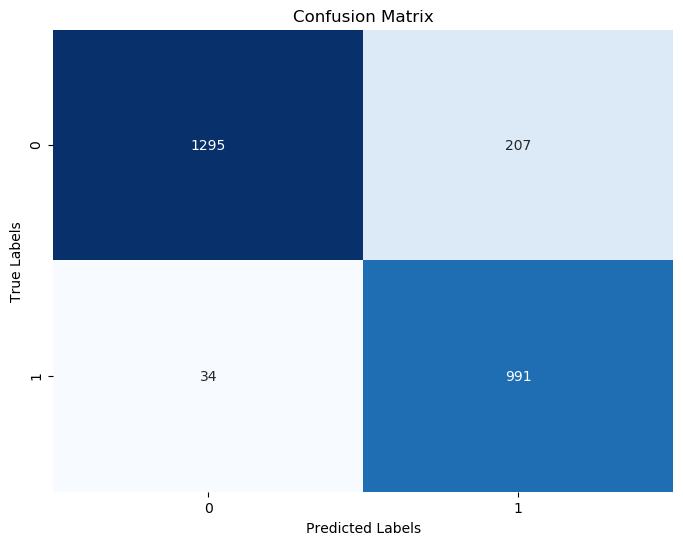

In [20]:
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [20]:
# Threshold Tuning
# Initialize lists to store metrics
precisions = []
recalls = []
f1_scores = []
thresholds = np.linspace(0, 1, 100)

# Loop through thresholds and calculate metrics
for threshold in thresholds:
    y_pred = (y_pred_prob > threshold).astype(int)
    precisions.append(precision_score(y_test, y_pred))
    recalls.append(recall_score(y_test, y_pred))
    f1_scores.append(f1_score(y_test, y_pred))

# Plot metrics vs thresholds
plt.figure(figsize=(12, 8))
plt.plot(thresholds, precisions, label='Precision')
plt.plot(thresholds, recalls, label='Recall')
plt.plot(thresholds, f1_scores, label='F1-Score')
plt.xlabel('Threshold')
plt.ylabel('Metric Value')
plt.title('Threshold Tuning')
plt.legend()
plt.show()

NameError: name 'y_pred_prob' is not defined

In [23]:
precisions, recalls, f1_scores

([0.40561931143648594,
  0.6989761092150171,
  0.7288256227758008,
  0.7407675597393193,
  0.7514705882352941,
  0.7621178225205071,
  0.7689992475545523,
  0.7736563209689629,
  0.7783701447067783,
  0.7811782708492732,
  0.7878086419753086,
  0.7902476780185759,
  0.7933177933177933,
  0.7957911145752143,
  0.7982799061767005,
  0.8001567398119123,
  0.8007843137254902,
  0.8034727703235991,
  0.8045886075949367,
  0.805863708399366,
  0.8077839555202542,
  0.8084260731319555,
  0.8090692124105012,
  0.8103585657370518,
  0.8103585657370518,
  0.8115015974440895,
  0.8112,
  0.8118494795836669,
  0.8118494795836669,
  0.8138041733547352,
  0.8138041733547352,
  0.8133547868061143,
  0.8138597904915391,
  0.81421647819063,
  0.8155339805825242,
  0.8158961881589619,
  0.8158961881589619,
  0.8165584415584416,
  0.8172217709179529,
  0.8184039087947883,
  0.8184039087947883,
  0.8186274509803921,
  0.8198198198198198,
  0.8210180623973727,
  0.823045267489712,
  0.8250825082508251,
  0

In [22]:
thresholds = np.linspace(0, 1, 100)

In [23]:
list(thresholds)

[0.0,
 0.010101010101010102,
 0.020202020202020204,
 0.030303030303030304,
 0.04040404040404041,
 0.05050505050505051,
 0.06060606060606061,
 0.07070707070707072,
 0.08080808080808081,
 0.09090909090909091,
 0.10101010101010102,
 0.11111111111111112,
 0.12121212121212122,
 0.13131313131313133,
 0.14141414141414144,
 0.15151515151515152,
 0.16161616161616163,
 0.17171717171717174,
 0.18181818181818182,
 0.19191919191919193,
 0.20202020202020204,
 0.21212121212121213,
 0.22222222222222224,
 0.23232323232323235,
 0.24242424242424243,
 0.25252525252525254,
 0.26262626262626265,
 0.27272727272727276,
 0.2828282828282829,
 0.29292929292929293,
 0.30303030303030304,
 0.31313131313131315,
 0.32323232323232326,
 0.33333333333333337,
 0.3434343434343435,
 0.3535353535353536,
 0.36363636363636365,
 0.37373737373737376,
 0.38383838383838387,
 0.393939393939394,
 0.4040404040404041,
 0.4141414141414142,
 0.42424242424242425,
 0.43434343434343436,
 0.4444444444444445,
 0.4545454545454546,
 0.4646464

In [26]:
print(os.path.abspath('best_model_tuning_8.pth'))

/root/Project Darwin/best_model_tuning_8.pth


### Deployment

In [37]:
# Compress .pth file into a tar.gz file
!tar -czvf best_model_tuning_8.tar.gz -C "/root/example-project/" best_model_tuning_8.pth

best_model_tuning_8.pth


In [9]:
# Upload model to S3 bucket
# Initialize a session using Amazon S3
s3 = boto3.client('s3')

# Specify the name of your S3 bucket
bucket_name = 'your-bucket-name'

# Specify the path to your local model
local_model_path = '/root/example-project/best_model_tuning_8.tar.gz'

# Specify the S3 path where you want to upload the model
s3_model_path = 'example-project/Model/best_model_tuning_8.tar.gz'

# Upload the model to S3
s3.upload_file(local_model_path, bucket_name, s3_model_path)

### Predict and Precision Score

In [6]:
def download_model_from_s3(bucket_name, model_key, download_path):
    """
    Download the fine-tuned pre-trained model from an S3 bucket.
    
    Parameters:
        bucket_name (str): Name of the S3 bucket.
        model_key (str): Key of the model file in the S3 bucket.
        download_path (str): Local path to download the model.
        
    Returns:
        None
    """
    s3 = boto3.client('s3')
    s3.download_file(bucket_name, model_key, download_path)

def initialise_model(download_path):
    """
    Initialise and return the fine-tuned pre-trained ResNet-50 model.
    
    Parameters:
        download_path (str): Local path where the model is downloaded.
        
    Returns:
        tuple: Fine-tuned pre-trained model and device (CPU or CUDA)
    """
    model = models.resnet50(pretrained=False)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 2)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.load_state_dict(torch.load(download_path, map_location=device))
    model = model.to(device)
    model.eval()
    return model, device

def preprocess_image(image_path):
    """
    Preprocess the image for model inference.
    
    Parameters:
        image_path (str): Path to the image file.
        
    Returns:
        Tensor: Preprocessed image tensor.
    """
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform(image)
    image = image.unsqueeze(0)
    return image

def predict(image_path, model, device):
    """
    Make a prediction and return the probability that the image is tampered.
    
    Parameters:
        image_path (str): Path to the image file.
        model (torch.nn.Module): The pre-trained and fine-tuned model.
        device (torch.device): The device (CPU or CUDA) where the model is located.
        
    Returns:
        float: Probability that the image is tampered.
    """
    image = preprocess_image(image_path)
    image = image.to(device)
    with torch.no_grad():
        logits = model(image)
        probabilities = F.softmax(logits, dim=1)
    return probabilities.cpu().numpy()[0][1]

In [7]:
bucket_name = "your-bucket-name"
model_key = "best_model_tuning_8.pth"
download_path = "./best_model_tuning_8.pth"
    
# Download the model from S3
download_model_from_s3(bucket_name, model_key, download_path)
    
# Initialise the model
model, device = initialise_model(download_path)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
